# Bioinformatics - Active regulatory regions prediction using deep neural networks
## Paolo Cortis

Application of deep supervised learning methods to identify the position of active/inactive cis-regulatory regions.

*Note*: The following code takes inspiration from the lab notebooks but was very much deconstructed, revised and customized for a better personal understanding, at times, even at the cost of some compactness and encapsulation present in the original.

## Libraries

In [1]:
from epigenomic_dataset import load_epigenomes
import numpy as np
import pandas as pd

from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from minepy import MINE
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

from boruta import BorutaPy
from multiprocessing import cpu_count

from sklearn.decomposition import PCA as skPCA
from sklearn.manifold import TSNE as skTSNE

import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedShuffleSplit, ShuffleSplit

import tensorflow as tf
from tensorflow.keras import activations, layers, optimizers, losses
from tensorflow.keras import Sequential
from extra_keras_metrics import get_standard_binary_metrics
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.metrics import accuracy_score, average_precision_score, roc_auc_score

#Genomic
from ucsc_genomes_downloader import Genome
from keras_bed_sequence import BedSequence
from keras_mixed_sequence import MixedSequence, VectorSequence

import keras_tuner as kt

## Data retrival: Epigenomic data
* **ENCODE**:  epigenomic data.
* **FANTOM**: labels.

Load and visualize epigenomic data (features+labels) for both promoters and enhancers for cell line **HepG2**.

#### Binarize labels
It is necessary to convert the real valued labels into discrete binary values to treat the problem as a binary classification task. Hence a threshold is selected to label regions as **active** or **inactive**.  
Since this binarization is still an open problem and the literature doesn't provide a clear method to perform it, nor a specific cut-off value, the choice of the threshold was guided by the necessity to reach a reasonable balance between the classes and the will to not discard any piece of data.
* Promoters threshold = 1.0
* Enhancers threshold = 0.09

In [2]:
cell_line = "HEPG2"
window_size = 256

promoters_epigenomes, promoters_labels = load_epigenomes(
    cell_line = cell_line,
    dataset = "fantom",
    region = "promoters",
    window_size = window_size,
    binarize = True,
    min_active_tpm_value = 1,
    max_inactive_tpm_value = 1
)

enhancers_epigenomes, enhancers_labels = load_epigenomes(
    cell_line = cell_line,
    dataset = "fantom",
    region = "enhancers",
    window_size = window_size,
    binarize = True,
    min_active_tpm_value = 0.09,
    max_inactive_tpm_value = 0.09
)

In [3]:
print(f"Promoters' features shape: {promoters_epigenomes.shape}")
print(f"Promoters' labels shape: {promoters_labels.shape}")
print(f"Enhancers' features shape: {enhancers_epigenomes.shape}")
print(f"Enhancers' labels shape: {enhancers_labels.shape}")

Promoters' features shape: (99881, 562)
Promoters' labels shape: (99881, 1)
Enhancers' features shape: (63285, 562)
Enhancers' labels shape: (63285, 1)


In [4]:
print(f"Inactive promoters: {promoters_labels[promoters_labels['HEPG2'] == False].size}\nActive promoters: {promoters_labels[promoters_labels['HEPG2'] == True].size}")
print(f"Inactive enhancers: {enhancers_labels[enhancers_labels['HEPG2'] == False].size}\nActive enhancers: {enhancers_labels[enhancers_labels['HEPG2'] == True].size}")

Inactive promoters: 74099
Active promoters: 25782
Inactive enhancers: 56108
Active enhancers: 7177


#### Promoters features

In [18]:
promoters_epigenomes[:5]

chrom                             NR2F6  ZCCHC11  PPARG  AGO2  CEBPZ   SP2  \
chrom chromStart chromEnd strand                                             
chr1  628964     629220   +        0.00     0.90   0.34  0.67    0.0  0.64   
      629013     629269   +        0.06     1.22   0.51  0.67    0.0  0.66   
      629642     629898   +        0.00     0.41   0.57  0.19    0.0  0.00   
      629847     630103   +        0.68     1.75   1.11  0.13    0.0  0.35   
      629905     630161   +        0.68     1.81   0.98  0.04    0.0  0.59   

chrom                             ZNF510  CREB1  ZNF526  ZNF629  ...  ZNF224  \
chrom chromStart chromEnd strand                                 ...           
chr1  628964     629220   +         0.82   0.40    0.27    0.56  ...    0.09   
      629013     629269   +         0.81   0.42    0.27    0.43  ...    0.17   
      629642     629898   +         0.16   0.03    0.17    0.15  ...    0.00   
      629847     630103   +         1.31   0.91    0.75    0.38  ...    0.05   
      629905     630161   +         1.25   1.21    0.80    0.47  ...    0.14   

chrom                             E2F4  NR3C1  SAFB2  CHD4  ZNF232  ZNF788  \
chrom chromStart chromEnd strand                                             
chr1  628964     629220   +       0.34   0.24   1.06  0.14    0.31    0.00   
      629013     629269   +       0.44   0.18   1.17  0.08    0.41    0.00   
      629642     629898   +       0.05   0.00   0.00  0.01    0.24    0.00   
      629847     630103   +       0.31   0.70   0.59  0.00    0.42    0.24   
      629905     630161   +       0.36   1.18   0.62  0.00    0.49    0.28   

chrom                             NCOR1  PREB  ZNF576  
chrom chromStart chromEnd strand                       
chr1  628964     629220   +        0.34  0.29    0.69  
      629013     629269   +        0.33  0.33    0.58  
      629642     629898   +        0.34  0.21    0.06  
      629847     630103   +        0.54  0.25    0.51  
      629905     630161   +        0.39  0.31    0.57  

[5 rows x 562 columns]

In [8]:
promoters_epigenomes.describe()

chrom,NR2F6,ZCCHC11,PPARG,AGO2,CEBPZ,SP2,ZNF510,CREB1,ZNF526,ZNF629,...,ZNF224,E2F4,NR3C1,SAFB2,CHD4,ZNF232,ZNF788,NCOR1,PREB,ZNF576
count,99881.000000,99881.000000,99881.000000,99881.000000,99880.000000,99881.000000,99881.000000,99881.000000,99881.000000,99881.000000,...,99881.000000,99881.000000,99881.000000,99881.000000,99881.000000,99881.000000,99881.000000,99881.000000,99881.000000,99881.000000
mean,1.097180,1.918595,2.028786,5.230861,0.714952,1.978142,1.398598,2.460228,1.653768,1.335839,...,1.186699,3.205277,1.051440,1.837787,1.502751,1.541730,1.947397,1.641510,1.104601,1.146580
std,1.424951,1.540896,2.248470,8.876331,1.288516,3.746221,0.991979,9.593309,3.292122,1.376866,...,0.685587,5.167217,0.489308,1.425254,1.194455,1.166041,1.568245,1.742847,0.604027,0.618647
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.450000,0.730000,0.590000,0.620000,0.320000,0.660000,0.670000,0.520000,0.690000,0.630000,...,0.690000,0.630000,0.710000,0.850000,0.640000,0.710000,0.800000,0.590000,0.690000,0.730000
50%,0.790000,1.390000,1.240000,1.980000,0.580000,1.040000,1.150000,0.800000,1.150000,1.040000,...,1.100000,1.250000,0.990000,1.460000,1.200000,1.220000,1.500000,1.070000,1.020000,1.080000
75%,1.280000,2.900000,2.920000,6.050000,0.890000,1.660000,1.940000,1.500000,1.810000,1.700000,...,1.570000,3.770000,1.330000,2.440000,2.070000,2.100000,2.740000,2.160000,1.420000,1.480000
max,46.970000,24.070000,73.100000,172.780000,73.090000,68.750000,15.150000,677.610000,120.840000,50.290000,...,7.750000,98.620000,7.400000,25.110000,21.100000,22.860000,17.940000,30.980000,8.820000,23.520000


#### Promoters labels

In [9]:
promoters_labels[:5]

HEPG2
chrom chromStart chromEnd strand       
chr1  628964     629220   +       False
      629013     629269   +       False
      629642     629898   +       False
      629847     630103   +       False
      629905     630161   +        True

#### Enhancers features

In [10]:
enhancers_epigenomes[:5]

chrom                              NR2F6  ZCCHC11  PPARG  AGO2  CEBPZ   SP2  \
chrom chromStart chromEnd  strand                                             
chr10 100006381  100006637 .        1.35     1.62   1.43  0.36   1.24  0.38   
      100008146  100008402 .        0.60     0.81   0.92  0.44   0.24  0.44   
      100014418  100014674 .        1.60     1.41   1.48  0.18   0.59  1.32   
      100020216  100020472 .        1.99     2.08   5.10  0.15   0.76  0.71   
      100043528  100043784 .        0.97     0.92   1.86  1.42   0.63  0.94   

chrom                              ZNF510  CREB1  ZNF526  ZNF629  ...  ZNF224  \
chrom chromStart chromEnd  strand                                 ...           
chr10 100006381  100006637 .         0.72   2.21    1.01    0.68  ...    0.78   
      100008146  100008402 .         1.02   0.36    0.27    0.91  ...    0.64   
      100014418  100014674 .         0.99   0.94    1.29    0.85  ...    2.52   
      100020216  100020472 .         2.17   1.78    1.18    1.12  ...    0.94   
      100043528  100043784 .         1.05   0.87    1.10    0.70  ...    1.23   

chrom                              E2F4  NR3C1  SAFB2  CHD4  ZNF232  ZNF788  \
chrom chromStart chromEnd  strand                                             
chr10 100006381  100006637 .       1.12   0.47   1.13  1.35    0.93    0.94   
      100008146  100008402 .       0.62   0.14   0.88  1.19    0.87    0.63   
      100014418  100014674 .       1.15   0.90   1.17  2.43    1.29    1.47   
      100020216  100020472 .       1.29   0.56   1.21  2.22    1.66    1.79   
      100043528  100043784 .       0.83   0.86   0.34  1.00    0.78    0.61   

chrom                              NCOR1  PREB  ZNF576  
chrom chromStart chromEnd  strand                       
chr10 100006381  100006637 .        1.96  0.87    0.79  
      100008146  100008402 .        1.28  0.76    0.76  
      100014418  100014674 .        0.56  0.82    1.28  
      100020216  100020472 .        1.93  0.23    1.14  
      100043528  100043784 .        0.26  1.54    0.69  

[5 rows x 562 columns]

In [11]:
enhancers_epigenomes.describe()

chrom,NR2F6,ZCCHC11,PPARG,AGO2,CEBPZ,SP2,ZNF510,CREB1,ZNF526,ZNF629,...,ZNF224,E2F4,NR3C1,SAFB2,CHD4,ZNF232,ZNF788,NCOR1,PREB,ZNF576
count,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,...,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000,63285.000000
mean,0.963189,1.059173,1.088036,1.208639,0.771997,0.800150,0.876783,0.939837,0.877640,0.875734,...,0.851586,0.867810,0.861504,0.945402,1.079634,0.903154,0.976611,1.054499,0.835609,0.878923
std,1.397075,0.803125,1.638099,3.221310,0.453335,0.818764,0.570115,2.168628,0.674322,0.974294,...,0.530374,1.004479,0.375902,0.655873,1.016449,0.656338,0.833855,1.415519,0.462954,0.521006
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.450000,0.550000,0.450000,0.230000,0.470000,0.470000,0.500000,0.520000,0.490000,0.470000,...,0.470000,0.460000,0.600000,0.490000,0.500000,0.500000,0.430000,0.510000,0.510000,0.510000
50%,0.700000,0.860000,0.720000,0.500000,0.730000,0.720000,0.770000,0.720000,0.790000,0.710000,...,0.780000,0.690000,0.830000,0.830000,0.790000,0.790000,0.800000,0.780000,0.790000,0.830000
75%,1.040000,1.300000,1.140000,1.020000,1.020000,1.010000,1.120000,0.970000,1.140000,1.030000,...,1.140000,1.000000,1.090000,1.250000,1.270000,1.150000,1.290000,1.140000,1.100000,1.180000
max,60.590000,17.830000,70.630000,138.330000,27.970000,50.300000,8.480000,195.180000,43.040000,43.740000,...,14.140000,55.770000,4.620000,9.340000,18.070000,35.260000,11.190000,40.940000,5.400000,28.750000


#### Enhancers labels

In [12]:
enhancers_labels[:5]

HEPG2
chrom chromStart chromEnd  strand       
chr10 100006381  100006637 .        True
      100008146  100008402 .       False
      100014418  100014674 .       False
      100020216  100020472 .       False
      100043528  100043784 .       False

In [4]:
feature_number = promoters_epigenomes.shape[1]

## Data elaboration and visualization: Epigenomic data

### Samples-features ratio
If the number of features is higher than the number of samples the model will behave erratically and overfit.  
* This is a simple check of the samples-features ratio.  
* The result is much higher than 0.

In [5]:
print(f"Promoters samples-features ratio: {promoters_epigenomes.shape[0]/promoters_epigenomes.shape[1]}")
print(f"Enhancers samples-features ratio: {enhancers_epigenomes.shape[0]/enhancers_epigenomes.shape[1]}")

Promoters samples-features ratio: 177.72419928825622
Enhancers samples-features ratio: 112.6067615658363


### NaN values
NaN values have a detrimental impact on the performance of the model.  
* This is a simple check of the total number of NaN values in the epigenomic dataset and of the row/column with the most NaN values (sample/feature to be eventually dropped). 
* The result shows a small number of NaN values and no particular sample or feature with enought NaN values to consider removing it.

In [6]:
print("NaN values report for Promoters: ")
print(f"Total NaN values: {promoters_epigenomes.isna().values.sum()} out of {promoters_epigenomes.values.size} values")
print(f"Row (sample) with the most NaN values has {promoters_epigenomes.isna().sum(axis=0).max()} NaN values out of {promoters_epigenomes.shape[1]} NaN values")
print(f"Column (feature) with the most NaN values has {promoters_epigenomes.isna().sum().max()} NaN values out of {promoters_epigenomes.shape[0]} NaN values")
print("-"*85)
print("NaN values report for Enhancers: ")
print(f"Total NaN values: {enhancers_epigenomes.isna().values.sum()} out of {enhancers_epigenomes.values.size} values")
print(f"Row (sample) with the most NaN values has {enhancers_epigenomes.isna().sum(axis=0).max()} NaN values out of {enhancers_epigenomes.shape[1]} NaN values")
print(f"Column (feature) with the most NaN values has {enhancers_epigenomes.isna().sum().max()} NaN values out of {enhancers_epigenomes.shape[0]} NaN values")

NaN values report for Promoters: 
Total NaN values: 359 out of 56133122 values
Row (sample) with the most NaN values has 138 NaN values out of 562 NaN values
Column (feature) with the most NaN values has 138 NaN values out of 99881 NaN values
-------------------------------------------------------------------------------------
NaN values report for Enhancers: 
Total NaN values: 19 out of 35566170 values
Row (sample) with the most NaN values has 19 NaN values out of 562 NaN values
Column (feature) with the most NaN values has 19 NaN values out of 63285 NaN values


### NaN values imputation
The amount of NaN values is small enough to allow imputation.  
* This is a simple function replacing NaN values with the K-NN approach. It assigns the average value of the K nearest neighbours' values.
* The result is the dataframe with no NaN values.

In [3]:
def knn_imputation(df: pd.DataFrame, n) -> pd.DataFrame:
    """ Return the provided dataframe with NaN values imputed using knn inputation.
    
    Parameters
    ------------------------
    df: pd.DataFrame
        The dataframe to impute.
    n: int
        The number of neighbours to consider.
        
    Returns
    ------------------------
    pd.DataFrame
        The dataframe with the NaN values imputed."""
    
    return pd.DataFrame(
        KNNImputer(n_neighbors=n).fit_transform(df.values),
        columns=df.columns,
        index=df.index
    )

In [4]:
n = 5
promoters_epigenomes = knn_imputation(promoters_epigenomes, n)
enhancers_epigenomes = knn_imputation(enhancers_epigenomes, n)

print(f"Promoters NaN values: {promoters_epigenomes.isna().values.sum()}")
print(f"Enhancers NaN values: {enhancers_epigenomes.isna().values.sum()}")

Promoters NaN values: 0
Enhancers NaN values: 0


### Data Visualization
Visualizing the data helps to evaluate the difficulty of the task and to design models with the appropiate complexity.
In this case data decomposition techniques (PCA and t-SNE) are used to reduce the high dimensional dataset into fewer dimensions (two), while preserving spatial characteristics for visualization purposes.

In this portion of the code epigenomic data is being pre-processed, however, for this visualization part, sequence data is also considered.

#### PCA
Technique to reduce the dimensionality of a dataset by linearly transforming the data into a new coordinate system where the variation in the data can be described with fewer dimensions than the initial data while preserving most of the original data variation.

#### t-SNE
Non linear dimensionality reduction technique, based on Stochastic Neighbour Embedding, well-suited for embedding high-dimensional data in a low-dimensional space of two dimensions for visualization.

In [5]:
# Importing the genome, for the visualization of sequence data
genome = Genome("hg38")

Loading chromosomes for genome hg38:   0%|                                                      | 0/25 [00:00<…

In [6]:
def to_bed(data:pd.DataFrame)->pd.DataFrame:
    """Return bed coordinates from given dataset."""
    return data.reset_index()[data.index.names]

In [34]:
from sklearn.decomposition import PCA

def get_pca_decomposition(
    X: pd.DataFrame,
    data_type: str,
    region: str,
    cell_line: str,
    metric: str,
    **kwargs
) -> pd.DataFrame:
    """Return the 2D TSNE decomposition of the given data."""
    
    return pd.DataFrame(
        PCA(n_components=2).fit_transform(X.values),
        index=X.index
    )

In [35]:
def get_tsne_decomposition(
    X: pd.DataFrame,
    data_type: str,
    region: str,
    cell_line: str,
    metric: str,
)->pd.DataFrame:
    """Return the 2D TSNE decomposition of the given data."""

    from MulticoreTSNE import MulticoreTSNE as TSNE
    
    return pd.DataFrame(
        TSNE(verbose=True).fit_transform(X.values),
        index=X.index
    )

In [36]:
from matplotlib.figure import Figure
from matplotlib.axes import Axes 
from matplotlib.colors import ListedColormap, LogNorm

def scatter_with_heatmap(
    decomposition: pd.DataFrame,
    scores: np.ndarray,
    figure: Figure,
    ax: Axes
):
    """Plot the scatter plot."""

    scatter = ax.scatter(
        *decomposition.values.T,
        c=scores,
        norm=matplotlib.colors.Normalize(vmin=-1, vmax=1),
        s=3
    )
    color_bar = figure.colorbar(scatter, ax=ax)

The following loop plots PCA and t-SNE decomposition for epigenomic data and sequence data considering both promoters and enhancers.

*Note*: since the labels are binarized the max/mean metric differentiation is useless and produces the same result twice. Due to the computational time required to run t-SNE however, this cell has not been touched in that regard.

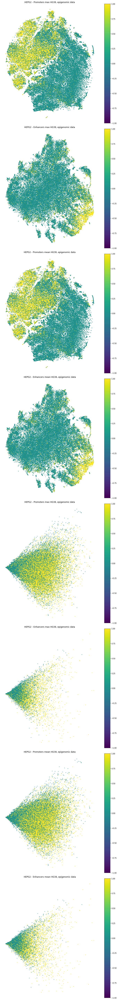

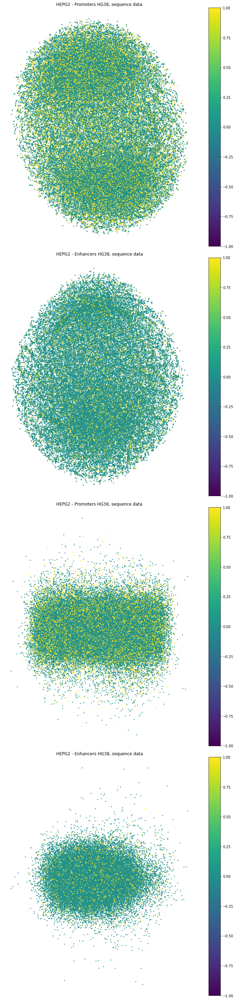

In [37]:
epigenomic_fig, epigenomic_axes = plt.subplots(
    nrows=8,
    ncols=1,
    figsize=(10, 80),
    squeeze=True
)

sequence_fig, sequence_axes = plt.subplots(
    nrows=4,
    ncols=1,
    figsize=(10, 40),
    squeeze=True
)

for k, metric in enumerate(("max", "mean")):
    for l, decomposition_method in enumerate((get_tsne_decomposition, get_pca_decomposition)):
        for j, ((epigenomic, scores), region, clip_value) in enumerate((
            ((promoters_epigenomes, promoters_labels), "Promoters", 1000),
            ((enhancers_epigenomes, enhancers_labels), "Enhancers", 20)
        )):
            
            # Epigenomic data
            decomposed_epigenomic = decomposition_method(
                epigenomic,
                "epigenomic",
                region,
                cell_line,
                metric
            )
            
            scores[scores>clip_value] = clip_value
            scatter_with_heatmap(
                decomposition=decomposed_epigenomic,
                scores=scores.values,
                figure=epigenomic_fig,
                ax=epigenomic_axes[j + 2*k + l*4]
            )
            
            epigenomic_axes[j + 2*k + l*4].set_title(f"{cell_line} - {region} {metric} HG38, epigenomic data")
            epigenomic_axes[j + 2*k + l*4].set_axis_off()
            
            # Sequence data
            if k==0:
                sequence = pd.DataFrame(
                    np.array(BedSequence(
                    genome,
                    bed=to_bed(scores),
                    batch_size=1
                    )).reshape(-1, 4*256),
                    index=scores.index
                )
                
                decomposed_sequence = decomposition_method(
                    sequence,
                    "sequence",
                    region,
                    cell_line,
                    metric="None",
                )
                
                scatter_with_heatmap(
                    decomposition=decomposed_sequence,
                    scores=scores.values,
                    figure=sequence_fig,
                    ax=sequence_axes[j + l*2]
                )
                sequence_axes[j + l*2].set_title(f"{cell_line} - {region} HG38, sequence data")
                sequence_axes[j + l*2].set_axis_off()

epigenomic_fig.tight_layout()
sequence_fig.tight_layout()
plt.show()

### Normalization via robust scaler
Data normalization is proven to improve the performance of models.  
The robust scaler operates normalization subtracting the median and dividing by the standard deviation between the interquantile range. This is operates a z-scoring while being robust to outliers.
* This is a simple function applying robust scaling to the data. 
* The result is the dataframe with normalized data.

In [282]:
def robust_scaler(df: pd.DataFrame) -> pd.DataFrame:
    """ Return the provided dataframe normalized using robust z-scoring.
    
    Parameters
    ------------------------
    df: pd.DataFrame
        The dataframe to normalize.

    Returns
    ------------------------
    pd.DataFrame
        The dataframe normalized."""
    
    return pd.DataFrame(
        RobustScaler().fit_transform(df.values),
        columns=df.columns,
        index=df.index
    )

promoters_epigenomes = robust_scaler(promoters_epigenomes)
enhancers_epigenomes = robust_scaler(enhancers_epigenomes)

### Feature selection
Feature selection implies the choice of a subset of the original pool of features.  
This is a useful step as irrelevant or partially relevant features can negatively impact the model performance, hence feature selection reduces noise, improves model accuracy and reduces training time by cutting the total number of features (currently pretty high).

#### Correlation with the output tests

Features not correlated with the output do not carry relevan information for the model to exploit for the task at hand. These can be removed.

* Pearson: identifies linear correlation between each feature and the output.
* Spearman: identifies monotonic correlation between each feature and the output.
* Maximal information coefficient (Mic): identifies non-linear correlation between each feature and the output.

In the following section functions are defined and ran for each of these tests over the entire dataset. This is done here just for explanatory purposes, in fact the resulting correlated features are not dropped from the dataset as this would introduce **bias** due to **data leakage**. Instead these tests are saved for the training "main loop" and ran, for each holdout, over the training portion of the data only, maintaining test data unseen and reserving it for actual testing.

In [283]:
p_value_threshold = 0.01
correlation_threshold = 0.05

#### Pearson correlation test
* This is a check for linear correlation between each feature and the label considering the p-value of the Pearson test.
* The result is a list of the features uncorrelated with the output (useless/to be dropped).

In [284]:
def get_pearson_uncorrelated(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    p_value_threshold: float = 0.01
) -> list:
    """ Return the list of features that the Pearson correlation test found to be uncorrelated with the labels.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset (epigenomic data).
    labels: pd.dataFrame
        The data labels.
    p_value_threshold: float = 0.01
        The minimum p-value required to consider a feature uncorrelated.

    Returns
    ------------------------
    list: list
        The list of uncorrelated features."""

    uncorrelated_features = []

    for feature in (data.columns):
        correlation, p_value = pearsonr(data[feature].values.ravel(), labels.values.ravel())
        if p_value > p_value_threshold:
            if feature not in uncorrelated_features:
                uncorrelated_features.append(feature)

    return uncorrelated_features

In [285]:
print("-- Just for explanatory purpose --")
uncorrelated_features_pearson_promoters = get_pearson_uncorrelated(promoters_epigenomes, promoters_labels)
uncorrelated_features_pearson_enhancers = get_pearson_uncorrelated(enhancers_epigenomes, enhancers_labels)

print(f"Promoters: features not correlated with the output: [Pearson]\n{uncorrelated_features_pearson_promoters}")
print("-"*80)
print(f"Enhancers: features not correlated with the output: [Pearson]\n{uncorrelated_features_pearson_enhancers}")                      

-- Just for explanatory purpose --
Promoters: features not correlated with the output: [Pearson]
[]
--------------------------------------------------------------------------------
Enhancers: features not correlated with the output: [Pearson]
['SNRNP70']


#### Spearman correlation test
* This is a check for monotonic correlation between each feature and the label considering the p-value of the Spearman test.
* The result is a list of the features uncorrelated with the output (useless/to be dropped).

In [286]:
def get_spearman_uncorrelated(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    p_value_threshold: float = 0.01
) -> list:
    """ Return the list of features that the Spearman correlation test found to be uncorrelated with the labels.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset (epigenomic data).
    labels: pd.dataFrame
        The data labels.
    p_value_threshold: float = 0.01
        The minimum p-value required to consider a feature uncorrelated.

    Returns
    ------------------------
    list: list
        The list of uncorrelated features."""
    
    uncorrelated_features = []

    for feature in (data.columns):
        correlation, p_value = spearmanr(data[feature].values.ravel(), labels.values.ravel())
        if p_value > p_value_threshold:
            if feature not in uncorrelated_features:
                uncorrelated_features.append(feature)

    return uncorrelated_features

In [287]:
print("-- Just for explanatory purpose --")
uncorrelated_features_spearman_promoters = get_spearman_uncorrelated(promoters_epigenomes, promoters_labels)
uncorrelated_features_spearman_enhancers = get_spearman_uncorrelated(enhancers_epigenomes, enhancers_labels)

print(f"Promoters: features not correlated with the output: [Spearman]\n{uncorrelated_features_spearman_promoters}")
print("-"*80)
print(f"Enhancers: features not correlated with the output: [Spearman]\n{uncorrelated_features_spearman_enhancers}")        

-- Just for explanatory purpose --
Promoters: features not correlated with the output: [Spearman]
['ZNF207', 'ZNF737']
--------------------------------------------------------------------------------
Enhancers: features not correlated with the output: [Spearman]
['SNRNP70']


In [288]:
print("-- Just for explanatory purpose --")
uncorrelated_features_promoters = uncorrelated_features_pearson_promoters + uncorrelated_features_spearman_promoters
uncorrelated_features_enhancers = uncorrelated_features_pearson_enhancers + uncorrelated_features_spearman_enhancers
uncorrelated_features_promoters = list(set(uncorrelated_features_promoters))
uncorrelated_features_enhancers = list(set(uncorrelated_features_enhancers))

print(f"Promoters: currently there are {len(uncorrelated_features_promoters)} uncorrelated features with the output:\n{uncorrelated_features_promoters}" )
print("-"*80)
print(f"Enhancers: currently there are {len(uncorrelated_features_enhancers)} uncorrelated features with the output:\n{uncorrelated_features_enhancers}" )

-- Just for explanatory purpose --
Promoters: currently there are 2 uncorrelated features with the output:
['ZNF737', 'ZNF207']
--------------------------------------------------------------------------------
Enhancers: currently there are 1 uncorrelated features with the output:
['SNRNP70']


#### Maximal information coefficient
* This is a check for all features found to be uncorrelated via the Pearson and Spearman tests to determine whether these features are actually uncorrelated with the output via the Maximal information score which checks also for non-linear correlations.
* The result is a list of the features **actually** uncorrelated with the output (useless/to be dropped).

In [289]:
def get_mic_uncorrelated(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    features_to_check: list,
    correlation_threshold: float = 0.05
) -> list:
    """ Return the list of features that the MIC correlation test confirmed to be uncorrelated with the labels.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset (epigenomic data).
    labels: pd.dataFrame
        The data labels.
    features_to_check: list
        The list of features to check with the MIC correlation test.
    correlation_threshold: float = 0.05
        The maximum correlation value required to consider a feature uncorrelated.

    Returns
    ------------------------
    list: list
        The list of uncorrelated features."""
    
    uncorrelated_features = []

    for feature in (features_to_check):
        mine = MINE()
        mine.compute_score(data[feature].values.ravel(), labels.values.ravel())
        score = mine.mic()
        if score < correlation_threshold:
            uncorrelated_features.append(feature)

    return uncorrelated_features

In [290]:
print("-- Just for explanatory purpose --")
uncorrelated_features_mic_promoters = get_mic_uncorrelated(promoters_epigenomes, promoters_labels, uncorrelated_features_promoters)
uncorrelated_features_mic_enhancers = get_mic_uncorrelated(enhancers_epigenomes, enhancers_labels, uncorrelated_features_enhancers)

print(f"Promoters: there are {len(uncorrelated_features_mic_promoters)} uncorrelated features with the output: [Confirmed via MIC]\n{uncorrelated_features_mic_promoters}" )
print("-"*80)
print(f"Enhancers: there are {len(uncorrelated_features_mic_enhancers)} uncorrelated features with the output: [Confirmed via MIC]\n{uncorrelated_features_mic_enhancers}" )

-- Just for explanatory purpose --
Promoters: there are 2 uncorrelated features with the output: [Confirmed via MIC]
['ZNF737', 'ZNF207']
--------------------------------------------------------------------------------
Enhancers: there are 1 uncorrelated features with the output: [Confirmed via MIC]
['SNRNP70']


#### Drop feature uncorrelated with the output

In [188]:
def uncorrelated_features_test(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    p_value_threshold: float = 0.01,
    correlation_threshold: float = 0.05
) -> list:
    """ Return the list of features that the Pearson+Spearman+Mic correlation tests 
        found to be uncorrelated with the output.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset (epigenomic data).
    labels: pd.dataFrame
        The data labels.
    p_value_threshold: float = 0.01
        The minimum p-value required to consider a feature uncorrelated.
    correlation_threshold: float = 0.05
        The maximum correlation value required to consider a feature uncorrelated.

    Returns
    ------------------------
    list: list
        The list of uncorrelated features."""
    
    uncorrelated_features = []
    
    #Pearson
    uncorrelated_features += get_pearson_uncorrelated(data, labels, p_value_threshold)
    
    #Spearman
    uncorrelated_features += get_spearman_uncorrelated(data, labels, p_value_threshold)
    
    uncorrelated_features = list(set(uncorrelated_features))
    print(f"-- {len(uncorrelated_features)} Uncorrelated features: [Pearson+Spearman]\n{uncorrelated_features}")
    
    actually_uncorrelated_features = uncorrelated_features
    
    #Mic
    actually_uncorrelated_features = get_mic_uncorrelated(data, labels, uncorrelated_features, correlation_threshold)
    print(f"-- Actually uncorrelated features: [confirmed via MIC]\n{actually_uncorrelated_features}")
    
    return actually_uncorrelated_features

#### Correlation with the features tests
Features correlated with each other carry the same kind of information. These can be removed.

#### Pearson correlation test
Identifies linear correlation between features.

* This is a check for linear correlation within the features considering the p-value and correlation of the Pearson test.
* The result is a list of the features uncorrelated with the output (useless/to be dropped).  
  When two features are correlated the one with the lowest entropy is dropped.

In [291]:
def correlated_features_test(
    data: pd.DataFrame,
    p_value_threshold: float = 0.01,
    correlation_threshold: float = 0.97
) -> list:
    """ Return the features that the Pearson correlation tests found to be correlated with other features.
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The dataset (epigenomic data).
    p_value_threshold: float = 0.01
        The maximum p-value required to consider a feature correlated.
    correlation_threshold: float = 0.97
        The minimum correlation value required to consider a feature correlated.

    Returns
    ------------------------
    list: list
        The list of correlated features."""
    
    correlated_features = []
    
    #Pearson
    for i, feature1 in (enumerate(data.columns)):
        for feature2 in data.columns[i+1:]:
            correlation, p_value = pearsonr(data[feature1].values.ravel(), data[feature2].values.ravel())
            correlation = np.abs(correlation)
            if p_value < p_value_threshold and correlation > correlation_threshold:
                if entropy(data[feature1]) > entropy(data[feature2]):
                    correlated_features.append(feature2)
                else:
                    correlated_features.append(feature1)
    
    correlated_features = list(set(correlated_features))
    print(f"-- {len(correlated_features)} Correlated features: [Pearson]\n{correlated_features}")
    
    return correlated_features

In [292]:
print("-- Just for explanatory purpose --")
correlated_features_promoters = correlated_features_test(promoters_epigenomes)
correlated_features_enhancers = correlated_features_test(enhancers_epigenomes)

-- Just for explanatory purpose --
-- 1 Correlated features: [Pearson]
['SAP130']
-- 0 Correlated features: [Pearson]
[]


#### Boruta feature selection
The algorithm gives a numerical estimate of the feature importance and categorizes features in those to keep, those to discard and *tentative*, meaning that there is uncertainty regarding their actual correlation with the output. **Both** uncorrelated and tentative features are discarded. Experiments were performed when discarding only strictly uncorrelated features, the results, however, were found to be similar.
* This is the application of the Boruta feature selection algorithm. It returns the features to keep and those to discard.

In [190]:
def boruta_feature_selection(
    data: pd.DataFrame,
    labels: pd.DataFrame,
    max_iter: int = 100
) -> pd.DataFrame:
    """ Return the features that the Boruta algorithm found to be correlated with the output (useful/to keep).
    
    Parameters
    ------------------------
    data: pd.DataFrame
        The data reserved for the input of the training of the Boruta model.
    labels: pd.DataFrame
        The data reserved for the output of the training of the Boruta model.
    max_iter: int = 100
        The number of iterations to run Boruta for.

    Returns
    ------------------------
    list: list
        The list of correlated features."""
    
    # Create the Boruta model
    boruta_selector = BorutaPy(
        RandomForestClassifier(n_jobs=cpu_count(), class_weight='balanced', max_depth=5),
        n_estimators = 'auto',
        verbose = 2,
        alpha = 0.05,
        max_iter = max_iter,
        random_state = 42
    )
    # Fit the Boruta model
    boruta_selector.fit(data.values, labels.values.ravel())
    
    # Get the kept features and discarded features
    kept_features = list(data.columns[boruta_selector.support_])
    discarted_features = list(data.columns[~boruta_selector.support_])

    print(f"-- {len(kept_features)} Kept (correlated) features [Boruta]")
    print(f"-- {len(discarted_features)} Discarted (uncorrelated) features [Boruta]")
    
    return kept_features

## Learning

The technique used to generate the holdouts for the evaluation of the various architectures is the **stratified Monte-Carlo** method, producing each time a different arrangement of the training, validation and testing set, while keeping roughly the same class balance.

10 holdouts are considered to train and evaluate each model, 20% of the whole dataset was used for testing, 80% for training where 20% of it is reserved for the validation of the meta-model.

To avoid increasing excessively the computational complexity of the main training loop, the hyperparameter tuning step is performed, for all holdouts, considering a **single** split of the training set in a training and validation portion.

In [15]:
number_of_splits = 10

holdouts_generator = StratifiedShuffleSplit(
    n_splits = number_of_splits,
    test_size = 0.2,
    random_state = 42
)

In [16]:
number_of_splits_tuning = 1

holdouts_generator_tuning = StratifiedShuffleSplit(
    n_splits = number_of_splits_tuning,
    test_size = 0.2,
    random_state = 42
)

In [191]:
def train_model(
    model: tf.keras.Model,
    x_train: np.ndarray,
    x_test: np.ndarray,
    y_train: np.ndarray,
    y_test: np.ndarray,
    epochs: int,
    batch_size: int
):
    """ Train the model and return the performance metrics (accuracy, AUROC, AUPRC) for train and test and the training history.
    
    Parameters
    ------------------------
    x_train: np.ndarray
        The input data for training.
    x_test: np.ndarray
        The input data for testing.
    y_train: np.ndarray
        The labels of the input data for training.
    y_test: np.ndarray
        The labels of the input data for testing.
    epochs: int
        The number of times the learning algorithm works through the dataset.
    batch_size: int
        The number of samples to work through before updating the model.

    Returns
    ------------------------
    The performance metrics and history of the model."""
    
    model_history = model.fit(
        x_train, y_train,
        validation_data = (x_test, y_test),
        epochs = epochs,
        batch_size = batch_size,
        callbacks = [EarlyStopping("val_loss", patience=2)]
    )

    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)
    
    metrics = evaluate_model_prediction(y_train, y_train_pred, y_test, y_test_pred)
    
    return metrics, model_history

#### Evaluate a model
Next are a set of functions to **evaluate** and **visualize** the performances of models.

To have a statistically sound estimate of an architecture performance, multiple models are built and trained, each with the same architecture, over different portions of the data (holdouts) and, the **average** performance of those, is considered as an estimate of the overall performance of the architecture.

In [192]:
def evaluate_model_prediction(
    y_train_true: np.ndarray,
    y_train_pred: np.ndarray,
    y_test_true: np.ndarray,
    y_test_pred: np.ndarray
) -> dict[str, float]:
    """ Return the performance metrics (accuracy, AUROC, AUPRC) for train and test of the model predictions.
    
    Parameters
    ------------------------
    y_train_true: np.ndarray
        The actual labels (train).
    y_train_pred: np.ndarray
        The predicted labels (train).
    y_test_true: np.ndarray
        The actual labels (test).
    y_test_pred: np.ndarray
        The predicted labels (test).

    Returns
    ------------------------
    dict: dict[str, float]
        The performance metrics of the model predictions."""
    
    accuracy_train = accuracy_score(y_train_true, np.round(y_train_pred).astype(int))
    AUROC_train = roc_auc_score(y_train_true, y_train_pred)
    AUPRC_train = average_precision_score(y_train_true, y_train_pred)
    
    accuracy_test = accuracy_score(y_test_true, np.round(y_test_pred).astype(int))
    AUROC_test = roc_auc_score(y_test_true, y_test_pred)
    AUPRC_test = average_precision_score(y_test_true, y_test_pred)
    
    metrics = {
      "accuracy_train": accuracy_train,
      "accuracy_test": accuracy_test,
      "AUROC_train": AUROC_train,
      "AUROC_test": AUROC_test,
      "AUPRC_train": AUPRC_train,
      "AUPRC_test": AUPRC_test
    }
    
    return metrics

In [193]:
def model_metrics_holdout_estimate(
    model_metrics: list,
    holdout_total_number: int
) -> dict[str, float]:
    """ Return the average metrics (accuracy, AUROC, AUPRC) of the model accross all the holdouts for train and test.
    
    Parameters
    ------------------------
    model_metrics: list
        The list with the train/test metrics (accuracy, AUROC, AUPRC) for all the holdouts.
    holdout_total_number: int
        The number of total holdouts.

    Returns
    ------------------------
    dict: dict[str, float]
        The average metrics of the model accross all the holdouts for train and test."""
    
    total_accuracy_train = 0
    total_accuracy_test = 0
    total_AUROC_train = 0
    total_AUROC_test = 0
    total_AUPRC_train = 0
    total_AUPRC_test = 0

    for holdout in model_metrics:
        total_accuracy_train += holdout['accuracy_train']
        total_accuracy_test += holdout['accuracy_test']
        total_AUROC_train += holdout['AUROC_train']
        total_AUROC_test += holdout['AUROC_test']
        total_AUPRC_train += holdout['AUPRC_train']
        total_AUPRC_test += holdout['AUPRC_test']

    avg_accuracy_train = total_accuracy_train / holdout_total_number
    avg_accuracy_test = total_accuracy_test / holdout_total_number
    avg_AUROC_train = total_AUROC_train / holdout_total_number
    avg_AUROC_test = total_AUROC_test / holdout_total_number
    avg_AUPRC_train = total_AUPRC_train / holdout_total_number
    avg_AUPRC_test = total_AUPRC_test / holdout_total_number

    return {
        'accuracy_train': avg_accuracy_train,
        'accuracy_test': avg_accuracy_test,
        'AUROC_train': avg_AUROC_train,
        'AUROC_test': avg_AUROC_test,
        'AUPRC_train': avg_AUPRC_train,
        'AUPRC_test': avg_AUPRC_test,
    }

In [194]:
def plot_train_history(model_history):
    """ Plots the metrics (accuracy, AUROC, AUPRC) of the model across the epochs and for each holdout.
    
    Parameters
    ------------------------
    model_history: history
        The training record of the model."""

    for i in range(len(model_history)):
        fig = plt.figure(figsize=(12.7,4.51))
        fig.suptitle(str(i+1) + " Holdout")
        
        # Accuracy
        plt.subplot(1,3,1)
        plt.plot(model_history[i].history['accuracy'])
        plt.plot(model_history[i].history['val_accuracy'])
        plt.title('Accuracy')
        plt.ylabel('accuracy')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        
        # AUROC
        plt.subplot(1,3,2)
        plt.plot(model_history[i].history['AUROC'])
        plt.plot(model_history[i].history['val_AUROC'])
        plt.title('AUROC')
        plt.ylabel('AUROC')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        
        # AUPRC
        plt.subplot(1,3,3)
        plt.plot(model_history[i].history['AUPRC'])
        plt.plot(model_history[i].history['val_AUPRC'])
        plt.title('AUPRC')
        plt.ylabel('AUPRC')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')

        plt.subplots_adjust(wspace=0.3)
        plt.show()

#### Hyperparameter tuning
Hyperparameter tuning is performed training a meta model over training and validation data to obtain the best set of hyperparameters via **Bayesian optimization**.

Here is the function to **train** the hypermodel.

In [195]:
def hyperparameter_tuning(
    x_train: np.ndarray,
    x_validation: np.ndarray,
    y_train: np.ndarray,
    y_validation: np.ndarray,
    hypermodel: tf.keras.Model,
    name: str,
    directory: str,
    max_trials: int = 10,
    epochs: int = 50,
    batch_size: int = 256
):
    """ Tunes the hypermodel with bayesian optiomization and returns the best set of hyperparameters.
    
    Parameters
    ------------------------
    x_train: np.ndarray
        The input data for training the hypermodel.
    x_validation: np.ndarray
        The input data for testing the hypermodel.
    y_train: np.ndarray
        The labels of the input data for training the hypermodel.
    y_validation: np.ndarray
        The labels of the input data for testing the hypermodel.
    hypermodel: model
        The hypermodel to tune or a function that builds a model using hp object.
    name: str
        The project name.
    directory: str
        The directory where to store results.
    max_trials: int
        The maximum amount of model configuration that the algorithm will try out.
    epochs: int
        The number of times the learning algorithm works through the dataset.
    batch_size: int
        The number of samples to work through before updating the model.

    Returns
    ------------------------
    hyperparameters: hyperparameters
        The best set of hyperparameters."""

    tuner = kt.tuners.BayesianOptimization(
        hypermodel,
        objective = [
            kt.Objective("val_accuracy", direction="max"),
            kt.Objective("val_AUROC", direction="max"),
            kt.Objective("val_AUPRC", direction="max")],
        max_trials = max_trials,
        project_name = name,
        directory = directory
    )

    tuner.search(
        x_train,
        y_train,
        epochs = epochs,
        batch_size = batch_size,
        validation_data = (x_validation, y_validation),
        callbacks = [EarlyStopping("val_loss", patience=2)]
    )
    
    best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
    
    print(f"-- Best set of hyperparameters found:\n{best_hp.values}")

    return best_hp

### MLP
A multi-layer perceptron is a feed forward neural network consiting of one input and output layer with hidden **dense** layers in-between. To avoid overfitting of the model dropout layers were added.

Here are the functions to build the **hypermodel** for hyperparameter tuning and to build the **model** with the best set of hyperparameters found.

In [196]:
def build_MLP_hypermodel(hp) -> tf.keras.Model:
    """ Returns the hypermodel.
    
    Parameters
    ------------------------
    hp: hyperparameters
        The hyperparameters object.

    Returns
    ------------------------
    hypermodel: model
        The hyperparamodel."""

    MLP_Hypermodel = Sequential(name="MLP_Hypermodel")
    MLP_Hypermodel.add(layers.Input((feature_number, )))
    
    for i in range(hp.Int('depth', min_value=1, max_value=5)):
        MLP_Hypermodel.add(layers.Dense(units = hp.Int('units_' + str(i), min_value=8, max_value=136, step=32), activation="relu"))
        MLP_Hypermodel.add(layers.Dropout(hp.Choice('dropout_'+ str(i), [0.3, 0.4, 0.5])))
    
    MLP_Hypermodel.add(layers.Dense(1, activation='sigmoid'))
    
    MLP_Hypermodel.compile(
        optimizer='nadam',
        loss='binary_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    MLP_Hypermodel.summary()
    
    return MLP_Hypermodel

In [23]:
def build_MLP(
    best_hyperparameters: dict,
    input_shape: tuple
) -> tf.keras.Model:
    """ Returns the model with the best set of hyperparameters.
    
    Parameters
    ------------------------
    best_hyperparameters: dict
        The best set of hyperparameters for the model.
    input_shape: tuple
        The shape of the input.
    Returns
    ------------------------
    model: model
        The best model."""

    MLP = Sequential(name="MLP")
    MLP.add(layers.Input((input_shape[1], )))
    
    for i in range(best_hyperparameters['depth']):
        MLP.add(layers.Dense(units = best_hyperparameters['units_' + str(i)], activation="relu"))
        MLP.add(layers.Dropout(best_hyperparameters['dropout_' + str(i)]))
    
    MLP.add(layers.Dense(1, activation='sigmoid'))
    
    MLP.compile(
        optimizer='nadam',
        loss='binary_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    MLP.summary()
    
    return MLP

### Main training loop - MLP
* Tune hyperparameters with the **meta-model** based on **Bayesian optimization** using the training set (split into train and validation) for 1 holdout. The result is the best set of hyperparameters found using that specific training set.
* Remove features uncorrelated with the output performing the **Pearson** and **Spearman** correlation tests, the **Mic** correlation test to confirm the choice, remove features correlated with each other performing the **Pearson** correlation test, and the **Boruta feature selection** algorithm using the training set. The architecture is trained also **without** Boruta feature selection to inspect the possible impact on the performance.
* Build and train the model over the entire training set with the **optimal** set of hyperparameters found by the meta-model and test it over the test set.

In [24]:
epochs = 1000
batch_size = 256

#### Promoters

In [49]:
print("---- PROMOTERS ----")

MLP_metrics_promoters = {}
MLP_history_promoters = {}

MLP_metrics_promoters["boruta_True"] = []
MLP_metrics_promoters["boruta_False"] = []

MLP_history_promoters["boruta_True"] = []
MLP_history_promoters["boruta_False"] = []

# Generate holdouts
for holdout_number, (train_indices, test_indices) in enumerate(holdouts_generator.split(promoters_epigenomes, promoters_labels)):
    print(f"-- HOLDOUT {holdout_number+1} --")
    # Train/Test data
    x_train_promoters, x_test_promoters = promoters_epigenomes.iloc[train_indices], promoters_epigenomes.iloc[test_indices]
    y_train_promoters, y_test_promoters = promoters_labels.iloc[train_indices], promoters_labels.iloc[test_indices]
    
    ## Hyperparameter tuning
    # Generate holdouts
    for holdout_number_tuning, (train_indices_tuning, val_indices_tuning) in enumerate(holdouts_generator_tuning.split(x_train_promoters, y_train_promoters)):
        # Train/Validation data
        x_train_promoters_tuning, x_val_promoters_tuning = x_train_promoters.iloc[train_indices_tuning], x_train_promoters.iloc[val_indices_tuning]
        y_train_promoters_tuning, y_val_promoters_tuning = y_train_promoters.iloc[train_indices_tuning], y_train_promoters.iloc[val_indices_tuning]
        
        hp = kt.HyperParameters()

        best_hyperparameters = hyperparameter_tuning(
            x_train_promoters_tuning.values,
            x_val_promoters_tuning.values,
            y_train_promoters_tuning.values,
            y_val_promoters_tuning.values,
            build_MLP_hypermodel,
            name = "MLP_hypermodel_promoters_" + str(holdout_number),
            directory='MLP_hypermodel_promoters',
            max_trials = 8,
            epochs = 50,
            batch_size = 256
        )
    
    ## Remove uncorrelated features with the output
    uncorrelated_features = uncorrelated_features_test(x_train_promoters, y_train_promoters)
    for feature in (x_train_promoters.columns):
        if feature in (uncorrelated_features):
            x_train_promoters = x_train_promoters.drop(columns=feature)
            x_test_promoters = x_test_promoters.drop(columns=feature)
            
    ## Remove correlated features with eachother
    correlated_features = correlated_features_test(x_train_promoters)
    for feature in (x_train_promoters.columns):
        if feature in (correlated_features):
            x_train_promoters = x_train_promoters.drop(columns=feature)
            x_test_promoters = x_test_promoters.drop(columns=feature)
            
    ## Boruta feature selection
    for use_Boruta in (False, True):
        if use_Boruta:
            print("-- Running Boruta Feature Selection:")
            kept_features = boruta_feature_selection(x_train_promoters, y_train_promoters)
            x_train_promoters = x_train_promoters[kept_features]
            x_test_promoters = x_test_promoters[kept_features]
            
        # Build MLP with best set of hyperparameters
        MLP = build_MLP(best_hyperparameters, x_train_promoters.shape)

        print("- Training model:\n")
        MLP_holdout_metrics, MLP_holdout_history = train_model(
            MLP,
            x_train_promoters.values,
            x_test_promoters.values,
            y_train_promoters.values,
            y_test_promoters.values,
            epochs,
            batch_size
        )
        
        MLP_metrics_promoters["boruta_" + str(use_Boruta)].append(MLP_holdout_metrics)
        MLP_history_promoters["boruta_" + str(use_Boruta)].append(MLP_holdout_history)

---- PROMOTERS ----
-- HOLDOUT 1 --
INFO:tensorflow:Reloading Oracle from existing project MLP_hypermodel_promoters\MLP_hypermodel_promoters_0\oracle.json
Model: "MLP_Hypermodel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 8)                 4504      
                                                                 
 dropout_1 (Dropout)         (None, 8)                 0         
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4,513
Trainable params: 4,513
Non-trainable params: 0
_________________________________________________________________
INFO:tensorflow:Reloading Tuner from MLP_hypermodel_promoters\MLP_hypermodel_promoters_0\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyper

Iteration: 	13 / 100
Confirmed: 	434
Tentative: 	125
Rejected: 	0
Iteration: 	14 / 100
Confirmed: 	434
Tentative: 	124
Rejected: 	1
Iteration: 	15 / 100
Confirmed: 	434
Tentative: 	124
Rejected: 	1
Iteration: 	16 / 100
Confirmed: 	444
Tentative: 	114
Rejected: 	1
Iteration: 	17 / 100
Confirmed: 	444
Tentative: 	114
Rejected: 	1
Iteration: 	18 / 100
Confirmed: 	444
Tentative: 	114
Rejected: 	1
Iteration: 	19 / 100
Confirmed: 	451
Tentative: 	107
Rejected: 	1
Iteration: 	20 / 100
Confirmed: 	451
Tentative: 	104
Rejected: 	4
Iteration: 	21 / 100
Confirmed: 	451
Tentative: 	104
Rejected: 	4
Iteration: 	22 / 100
Confirmed: 	457
Tentative: 	98
Rejected: 	4
Iteration: 	23 / 100
Confirmed: 	457
Tentative: 	98
Rejected: 	4
Iteration: 	24 / 100
Confirmed: 	457
Tentative: 	98
Rejected: 	4
Iteration: 	25 / 100
Confirmed: 	457
Tentative: 	98
Rejected: 	4
Iteration: 	26 / 100
Confirmed: 	462
Tentative: 	93
Rejected: 	4
Iteration: 	27 / 100
Confirmed: 	462
Tentative: 	91
Rejected: 	6
Iteration: 	28 /

Epoch 4/1000
313/313 [==============================] - 6s 20ms/step - loss: 0.3280 - accuracy: 0.8473 - recall: 0.7384 - precision: 0.6911 - AUROC: 0.9081 - AUPRC: 0.7260 - f1_score: 0.7140 - balanced_accuracy: 0.8118 - specificity: 0.8852 - miss_rate: 0.2616 - fall_out: 0.1148 - mcc: 0.6106 - val_loss: 0.3330 - val_accuracy: 0.8440 - val_recall: 0.7111 - val_precision: 0.6927 - val_AUROC: 0.9051 - val_AUPRC: 0.7241 - val_f1_score: 0.7018 - val_balanced_accuracy: 0.8006 - val_specificity: 0.8902 - val_miss_rate: 0.2889 - val_fall_out: 0.1098 - val_mcc: 0.5962
Epoch 5/1000
313/313 [==============================] - 6s 19ms/step - loss: 0.3241 - accuracy: 0.8488 - recall: 0.7397 - precision: 0.6944 - AUROC: 0.9103 - AUPRC: 0.7327 - f1_score: 0.7163 - balanced_accuracy: 0.8132 - specificity: 0.8867 - miss_rate: 0.2603 - fall_out: 0.1133 - mcc: 0.6139 - val_loss: 0.3346 - val_accuracy: 0.8421 - val_recall: 0.6387 - val_precision: 0.7184 - val_AUROC: 0.9064 - val_AUPRC: 0.7321 - val_f1_sco

Iteration: 	48 / 100
Confirmed: 	470
Tentative: 	76
Rejected: 	13
Iteration: 	49 / 100
Confirmed: 	470
Tentative: 	75
Rejected: 	14
Iteration: 	50 / 100
Confirmed: 	470
Tentative: 	75
Rejected: 	14
Iteration: 	51 / 100
Confirmed: 	471
Tentative: 	74
Rejected: 	14
Iteration: 	52 / 100
Confirmed: 	471
Tentative: 	74
Rejected: 	14
Iteration: 	53 / 100
Confirmed: 	471
Tentative: 	74
Rejected: 	14
Iteration: 	54 / 100
Confirmed: 	471
Tentative: 	74
Rejected: 	14
Iteration: 	55 / 100
Confirmed: 	471
Tentative: 	74
Rejected: 	14
Iteration: 	56 / 100
Confirmed: 	471
Tentative: 	74
Rejected: 	14
Iteration: 	57 / 100
Confirmed: 	472
Tentative: 	73
Rejected: 	14
Iteration: 	58 / 100
Confirmed: 	472
Tentative: 	73
Rejected: 	14
Iteration: 	59 / 100
Confirmed: 	474
Tentative: 	71
Rejected: 	14
Iteration: 	60 / 100
Confirmed: 	474
Tentative: 	71
Rejected: 	14
Iteration: 	61 / 100
Confirmed: 	474
Tentative: 	67
Rejected: 	18
Iteration: 	62 / 100
Confirmed: 	474
Tentative: 	67
Rejected: 	18
Iteration:

Epoch 8/1000
313/313 [==============================] - 6s 19ms/step - loss: 0.3153 - accuracy: 0.8541 - recall: 0.7493 - precision: 0.7044 - AUROC: 0.9159 - AUPRC: 0.7525 - f1_score: 0.7262 - balanced_accuracy: 0.8200 - specificity: 0.8906 - miss_rate: 0.2507 - fall_out: 0.1094 - mcc: 0.6275 - val_loss: 0.3264 - val_accuracy: 0.8487 - val_recall: 0.8005 - val_precision: 0.6743 - val_AUROC: 0.9115 - val_AUPRC: 0.7358 - val_f1_score: 0.7320 - val_balanced_accuracy: 0.8330 - val_specificity: 0.8655 - val_miss_rate: 0.1995 - val_fall_out: 0.1345 - val_mcc: 0.6321
Epoch 9/1000
313/313 [==============================] - 6s 19ms/step - loss: 0.3140 - accuracy: 0.8555 - recall: 0.7512 - precision: 0.7071 - AUROC: 0.9166 - AUPRC: 0.7523 - f1_score: 0.7285 - balanced_accuracy: 0.8215 - specificity: 0.8917 - miss_rate: 0.2488 - fall_out: 0.1083 - mcc: 0.6307 - val_loss: 0.3237 - val_accuracy: 0.8497 - val_recall: 0.7190 - val_precision: 0.7047 - val_AUROC: 0.9111 - val_AUPRC: 0.7357 - val_f1_sco

Iteration: 	91 / 100
Confirmed: 	488
Tentative: 	53
Rejected: 	18
Iteration: 	92 / 100
Confirmed: 	488
Tentative: 	53
Rejected: 	18
Iteration: 	93 / 100
Confirmed: 	488
Tentative: 	53
Rejected: 	18
Iteration: 	94 / 100
Confirmed: 	488
Tentative: 	53
Rejected: 	18
Iteration: 	95 / 100
Confirmed: 	488
Tentative: 	53
Rejected: 	18
Iteration: 	96 / 100
Confirmed: 	488
Tentative: 	48
Rejected: 	23
Iteration: 	97 / 100
Confirmed: 	488
Tentative: 	48
Rejected: 	23
Iteration: 	98 / 100
Confirmed: 	488
Tentative: 	48
Rejected: 	23
Iteration: 	99 / 100
Confirmed: 	488
Tentative: 	48
Rejected: 	23


BorutaPy finished running.

Iteration: 	100 / 100
Confirmed: 	488
Tentative: 	24
Rejected: 	23
-- 488 Kept (correlated) features [Boruta]
-- 71 Discarted (uncorrelated) features [Boruta]
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_18 (Dense)            (None, 136)               66504     
      

Total params: 22,401
Trainable params: 22,401
Non-trainable params: 0
_________________________________________________________________
- Training model:

Epoch 1/1000
313/313 [==============================] - 7s 21ms/step - loss: 0.4301 - accuracy: 0.7982 - recall: 0.6919 - precision: 0.5936 - AUROC: 0.8522 - AUPRC: 0.6021 - f1_score: 0.6390 - balanced_accuracy: 0.7635 - specificity: 0.8352 - miss_rate: 0.3081 - fall_out: 0.1648 - mcc: 0.5029 - val_loss: 0.3404 - val_accuracy: 0.8393 - val_recall: 0.7400 - val_precision: 0.6711 - val_AUROC: 0.9017 - val_AUPRC: 0.7059 - val_f1_score: 0.7039 - val_balanced_accuracy: 0.8069 - val_specificity: 0.8738 - val_miss_rate: 0.2600 - val_fall_out: 0.1262 - val_mcc: 0.5953
Epoch 2/1000
313/313 [==============================] - 6s 19ms/step - loss: 0.3588 - accuracy: 0.8329 - recall: 0.7264 - precision: 0.6602 - AUROC: 0.8908 - AUPRC: 0.6861 - f1_score: 0.6917 - balanced_accuracy: 0.7982 - specificity: 0.8699 - miss_rate: 0.2736 - fall_out: 0.130

Iteration: 	83 / 100
Confirmed: 	489
Tentative: 	49
Rejected: 	20
Iteration: 	84 / 100
Confirmed: 	489
Tentative: 	49
Rejected: 	20
Iteration: 	85 / 100
Confirmed: 	490
Tentative: 	48
Rejected: 	20
Iteration: 	86 / 100
Confirmed: 	490
Tentative: 	48
Rejected: 	20
Iteration: 	87 / 100
Confirmed: 	490
Tentative: 	48
Rejected: 	20
Iteration: 	88 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	89 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	90 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	91 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	92 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	93 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	94 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	95 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	96 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration: 	97 / 100
Confirmed: 	490
Tentative: 	47
Rejected: 	21
Iteration:

_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_28 (Dense)            (None, 104)               58136     
                                                                 
 dropout_14 (Dropout)        (None, 104)               0         
                                                                 
 dense_29 (Dense)            (None, 1)                 105       
                                                                 
Total params: 58,241
Trainable params: 58,241
Non-trainable params: 0
_________________________________________________________________
- Training model:

Epoch 1/1000
313/313 [==============================] - 8s 21ms/step - loss: 0.4092 - accuracy: 0.8140 - recall: 0.6826 - precision: 0.6287 - AUROC: 0.8662 - AUPRC: 0.6304 - f1_score: 0.6545 - balanced_accuracy: 0.7712 - specificity: 0.8597 - miss_rate: 0.3174 - fall_out: 0.1403 - mcc: 0.5284 - val_loss: 0.3534 - va

Iteration: 	70 / 100
Confirmed: 	478
Tentative: 	59
Rejected: 	21
Iteration: 	71 / 100
Confirmed: 	478
Tentative: 	57
Rejected: 	23
Iteration: 	72 / 100
Confirmed: 	481
Tentative: 	54
Rejected: 	23
Iteration: 	73 / 100
Confirmed: 	481
Tentative: 	54
Rejected: 	23
Iteration: 	74 / 100
Confirmed: 	481
Tentative: 	54
Rejected: 	23
Iteration: 	75 / 100
Confirmed: 	481
Tentative: 	53
Rejected: 	24
Iteration: 	76 / 100
Confirmed: 	481
Tentative: 	53
Rejected: 	24
Iteration: 	77 / 100
Confirmed: 	484
Tentative: 	50
Rejected: 	24
Iteration: 	78 / 100
Confirmed: 	484
Tentative: 	50
Rejected: 	24
Iteration: 	79 / 100
Confirmed: 	484
Tentative: 	50
Rejected: 	24
Iteration: 	80 / 100
Confirmed: 	484
Tentative: 	49
Rejected: 	25
Iteration: 	81 / 100
Confirmed: 	484
Tentative: 	49
Rejected: 	25
Iteration: 	82 / 100
Confirmed: 	484
Tentative: 	49
Rejected: 	25
Iteration: 	83 / 100
Confirmed: 	485
Tentative: 	47
Rejected: 	26
Iteration: 	84 / 100
Confirmed: 	485
Tentative: 	47
Rejected: 	26
Iteration:

-- 2 Uncorrelated features: [Pearson+Spearman]
['ZNF737', 'ZNF207']
-- Actually uncorrelated features: [confirmed via MIC]
['ZNF737', 'ZNF207']
-- 1 Correlated features: [Pearson]
['SAP130']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_34 (Dense)            (None, 136)               76160     
                                                                 
 dropout_17 (Dropout)        (None, 136)               0         
                                                                 
 dense_35 (Dense)            (None, 1)                 137       
                                                                 
Total params: 76,297
Trainable params: 76,297
Non-trainable params: 0
_________________________________________________________________
- Training model:

Epoch 1/1000
313/313 [==============================] - 8s 21ms/step - loss: 0.4096 - accuracy: 0.8176 - recall: 

Iteration: 	59 / 100
Confirmed: 	476
Tentative: 	68
Rejected: 	15
Iteration: 	60 / 100
Confirmed: 	476
Tentative: 	67
Rejected: 	16
Iteration: 	61 / 100
Confirmed: 	476
Tentative: 	67
Rejected: 	16
Iteration: 	62 / 100
Confirmed: 	478
Tentative: 	65
Rejected: 	16
Iteration: 	63 / 100
Confirmed: 	478
Tentative: 	65
Rejected: 	16
Iteration: 	64 / 100
Confirmed: 	478
Tentative: 	65
Rejected: 	16
Iteration: 	65 / 100
Confirmed: 	479
Tentative: 	64
Rejected: 	16
Iteration: 	66 / 100
Confirmed: 	479
Tentative: 	64
Rejected: 	16
Iteration: 	67 / 100
Confirmed: 	480
Tentative: 	55
Rejected: 	24
Iteration: 	68 / 100
Confirmed: 	480
Tentative: 	55
Rejected: 	24
Iteration: 	69 / 100
Confirmed: 	480
Tentative: 	55
Rejected: 	24
Iteration: 	70 / 100
Confirmed: 	481
Tentative: 	54
Rejected: 	24
Iteration: 	71 / 100
Confirmed: 	481
Tentative: 	54
Rejected: 	24
Iteration: 	72 / 100
Confirmed: 	482
Tentative: 	53
Rejected: 	24
Iteration: 	73 / 100
Confirmed: 	482
Tentative: 	53
Rejected: 	24
Iteration:

Epoch 9/1000
313/313 [==============================] - 6s 19ms/step - loss: 0.3144 - accuracy: 0.8547 - recall: 0.7484 - precision: 0.7061 - AUROC: 0.9163 - AUPRC: 0.7525 - f1_score: 0.7266 - balanced_accuracy: 0.8200 - specificity: 0.8916 - miss_rate: 0.2516 - fall_out: 0.1084 - mcc: 0.6283 - val_loss: 0.3213 - val_accuracy: 0.8488 - val_recall: 0.7514 - val_precision: 0.6904 - val_AUROC: 0.9123 - val_AUPRC: 0.7436 - val_f1_score: 0.7196 - val_balanced_accuracy: 0.8171 - val_specificity: 0.8827 - val_miss_rate: 0.2486 - val_fall_out: 0.1173 - val_mcc: 0.6174
Epoch 10/1000
313/313 [==============================] - 6s 19ms/step - loss: 0.3118 - accuracy: 0.8557 - recall: 0.7432 - precision: 0.7109 - AUROC: 0.9179 - AUPRC: 0.7575 - f1_score: 0.7267 - balanced_accuracy: 0.8190 - specificity: 0.8948 - miss_rate: 0.2568 - fall_out: 0.1052 - mcc: 0.6290 - val_loss: 0.3236 - val_accuracy: 0.8504 - val_recall: 0.7380 - val_precision: 0.6991 - val_AUROC: 0.9117 - val_AUPRC: 0.7409 - val_f1_sc

Iteration: 	91 / 100
Confirmed: 	482
Tentative: 	49
Rejected: 	28
Iteration: 	92 / 100
Confirmed: 	482
Tentative: 	49
Rejected: 	28
Iteration: 	93 / 100
Confirmed: 	482
Tentative: 	49
Rejected: 	28
Iteration: 	94 / 100
Confirmed: 	482
Tentative: 	49
Rejected: 	28
Iteration: 	95 / 100
Confirmed: 	483
Tentative: 	48
Rejected: 	28
Iteration: 	96 / 100
Confirmed: 	483
Tentative: 	48
Rejected: 	28
Iteration: 	97 / 100
Confirmed: 	483
Tentative: 	48
Rejected: 	28
Iteration: 	98 / 100
Confirmed: 	483
Tentative: 	48
Rejected: 	28
Iteration: 	99 / 100
Confirmed: 	483
Tentative: 	48
Rejected: 	28


BorutaPy finished running.

Iteration: 	100 / 100
Confirmed: 	483
Tentative: 	30
Rejected: 	28
-- 483 Kept (correlated) features [Boruta]
-- 76 Discarted (uncorrelated) features [Boruta]
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_42 (Dense)            (None, 136)               65824     
      

                                                                 
 dense_50 (Dense)            (None, 1)                 41        
                                                                 
Total params: 53,793
Trainable params: 53,793
Non-trainable params: 0
_________________________________________________________________
- Training model:

Epoch 1/1000
313/313 [==============================] - 10s 28ms/step - loss: 0.4533 - accuracy: 0.7697 - recall: 0.4688 - precision: 0.5648 - AUROC: 0.8224 - AUPRC: 0.5520 - f1_score: 0.5124 - balanced_accuracy: 0.6716 - specificity: 0.8743 - miss_rate: 0.5312 - fall_out: 0.1257 - mcc: 0.3660 - val_loss: 0.3606 - val_accuracy: 0.8290 - val_recall: 0.6391 - val_precision: 0.6794 - val_AUROC: 0.8952 - val_AUPRC: 0.6799 - val_f1_score: 0.6587 - val_balanced_accuracy: 0.7671 - val_specificity: 0.8951 - val_miss_rate: 0.3609 - val_fall_out: 0.1049 - val_mcc: 0.5452
Epoch 2/1000
313/313 [==============================] - 8s 27ms/step - loss: 0.

Epoch 15/1000
313/313 [==============================] - 8s 26ms/step - loss: 0.3245 - accuracy: 0.8503 - recall: 0.7700 - precision: 0.6875 - AUROC: 0.9097 - AUPRC: 0.7247 - f1_score: 0.7264 - balanced_accuracy: 0.8241 - specificity: 0.8782 - miss_rate: 0.2300 - fall_out: 0.1218 - mcc: 0.6258 - val_loss: 0.3372 - val_accuracy: 0.8478 - val_recall: 0.7644 - val_precision: 0.6835 - val_AUROC: 0.9105 - val_AUPRC: 0.7285 - val_f1_score: 0.7217 - val_balanced_accuracy: 0.8206 - val_specificity: 0.8769 - val_miss_rate: 0.2356 - val_fall_out: 0.1231 - val_mcc: 0.6193
Epoch 16/1000
313/313 [==============================] - 8s 26ms/step - loss: 0.3224 - accuracy: 0.8514 - recall: 0.7824 - precision: 0.6859 - AUROC: 0.9102 - AUPRC: 0.7257 - f1_score: 0.7310 - balanced_accuracy: 0.8289 - specificity: 0.8754 - miss_rate: 0.2176 - fall_out: 0.1246 - mcc: 0.6315 - val_loss: 0.3334 - val_accuracy: 0.8461 - val_recall: 0.8001 - val_precision: 0.6688 - val_AUROC: 0.9094 - val_AUPRC: 0.7238 - val_f1_s

 dropout_27 (Dropout)        (None, 72)                0         
                                                                 
 dense_52 (Dense)            (None, 104)               7592      
                                                                 
 dropout_28 (Dropout)        (None, 104)               0         
                                                                 
 dense_53 (Dense)            (None, 40)                4200      
                                                                 
 dropout_29 (Dropout)        (None, 40)                0         
                                                                 
 dense_54 (Dense)            (None, 40)                1640      
                                                                 
 dropout_30 (Dropout)        (None, 40)                0         
                                                                 
 dense_55 (Dense)            (None, 1)                 41        
          

Iteration: 	74 / 100
Confirmed: 	486
Tentative: 	54
Rejected: 	19
Iteration: 	75 / 100
Confirmed: 	486
Tentative: 	54
Rejected: 	19
Iteration: 	76 / 100
Confirmed: 	486
Tentative: 	54
Rejected: 	19
Iteration: 	77 / 100
Confirmed: 	487
Tentative: 	53
Rejected: 	19
Iteration: 	78 / 100
Confirmed: 	487
Tentative: 	53
Rejected: 	19
Iteration: 	79 / 100
Confirmed: 	487
Tentative: 	53
Rejected: 	19
Iteration: 	80 / 100
Confirmed: 	487
Tentative: 	53
Rejected: 	19
Iteration: 	81 / 100
Confirmed: 	487
Tentative: 	53
Rejected: 	19
Iteration: 	82 / 100
Confirmed: 	487
Tentative: 	53
Rejected: 	19
Iteration: 	83 / 100
Confirmed: 	488
Tentative: 	46
Rejected: 	25
Iteration: 	84 / 100
Confirmed: 	488
Tentative: 	46
Rejected: 	25
Iteration: 	85 / 100
Confirmed: 	488
Tentative: 	46
Rejected: 	25
Iteration: 	86 / 100
Confirmed: 	488
Tentative: 	46
Rejected: 	25
Iteration: 	87 / 100
Confirmed: 	488
Tentative: 	46
Rejected: 	25
Iteration: 	88 / 100
Confirmed: 	488
Tentative: 	46
Rejected: 	25
Iteration:

INFO:tensorflow:Reloading Tuner from MLP_hypermodel_promoters\MLP_hypermodel_promoters_9\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'depth': 1, 'units_0': 136, 'dropout_0': 0.3, 'units_1': 104, 'dropout_1': 0.3, 'units_2': 104, 'dropout_2': 0.3, 'units_3': 8, 'dropout_3': 0.5, 'units_4': 72, 'dropout_4': 0.3}
-- 2 Uncorrelated features: [Pearson+Spearman]
['ZNF737', 'ZNF207']
-- Actually uncorrelated features: [confirmed via MIC]
['ZNF737', 'ZNF207']
-- 1 Correlated features: [Pearson]
['SAP130']
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_64 (Dense)            (None, 136)               76160     
                                                                 
 dropout_35 (Dropout)        (None, 136)               0         
                                                                 
 dense_65 (Dense)            (None, 1)     

Iteration: 	19 / 100
Confirmed: 	446
Tentative: 	102
Rejected: 	11
Iteration: 	20 / 100
Confirmed: 	446
Tentative: 	102
Rejected: 	11
Iteration: 	21 / 100
Confirmed: 	446
Tentative: 	102
Rejected: 	11
Iteration: 	22 / 100
Confirmed: 	453
Tentative: 	95
Rejected: 	11
Iteration: 	23 / 100
Confirmed: 	453
Tentative: 	95
Rejected: 	11
Iteration: 	24 / 100
Confirmed: 	453
Tentative: 	95
Rejected: 	11
Iteration: 	25 / 100
Confirmed: 	453
Tentative: 	94
Rejected: 	12
Iteration: 	26 / 100
Confirmed: 	455
Tentative: 	92
Rejected: 	12
Iteration: 	27 / 100
Confirmed: 	455
Tentative: 	92
Rejected: 	12
Iteration: 	28 / 100
Confirmed: 	455
Tentative: 	92
Rejected: 	12
Iteration: 	29 / 100
Confirmed: 	459
Tentative: 	88
Rejected: 	12
Iteration: 	30 / 100
Confirmed: 	459
Tentative: 	88
Rejected: 	12
Iteration: 	31 / 100
Confirmed: 	459
Tentative: 	88
Rejected: 	12
Iteration: 	32 / 100
Confirmed: 	465
Tentative: 	79
Rejected: 	15
Iteration: 	33 / 100
Confirmed: 	465
Tentative: 	79
Rejected: 	15
Iterati

-- PROMOTERS -- withOUT BORUTA FEATURE SELECTION
MLP Metrics - 10-holdouts estimate:
Accuracy : train - 0.8585627753303966  --  test - 0.8457426039945937
AUROC : train - 0.9228826231988739  --  test - 0.908225762344436
AUPRC : train - 0.7754590575471727  --  test - 0.730489182316224
--------------------------------------------------------------------------------
MLP - Train history:


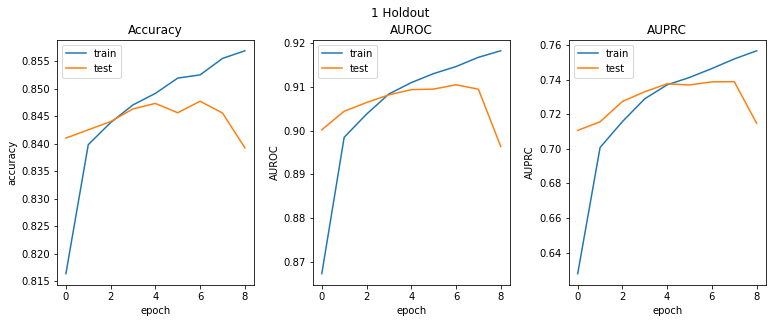

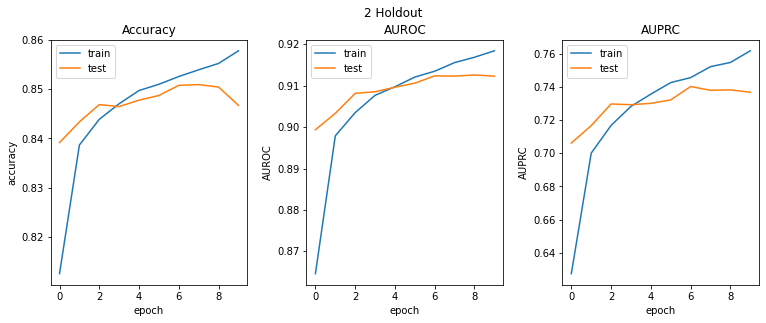

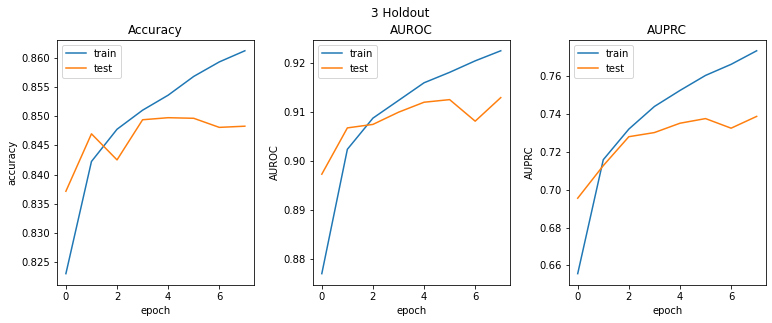

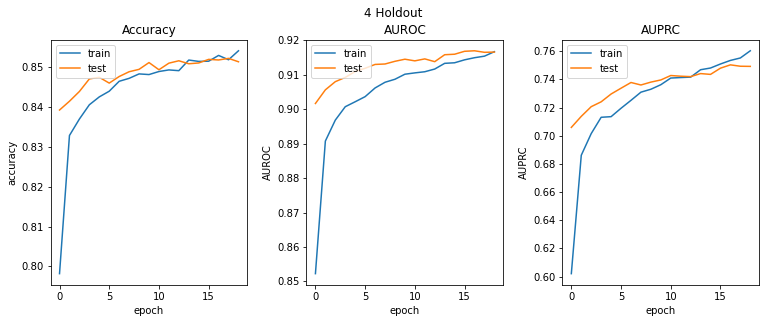

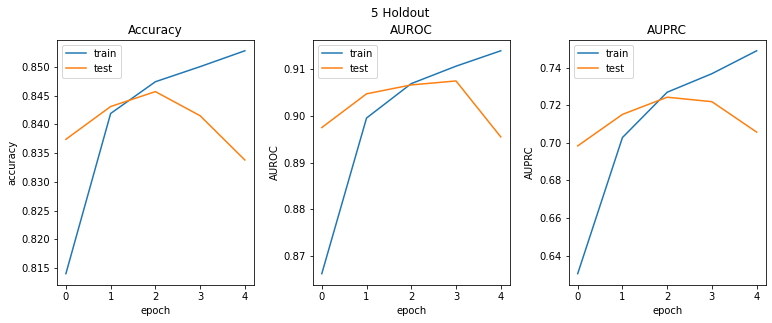

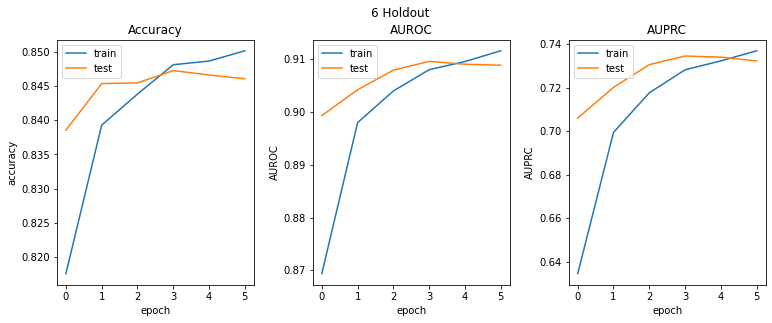

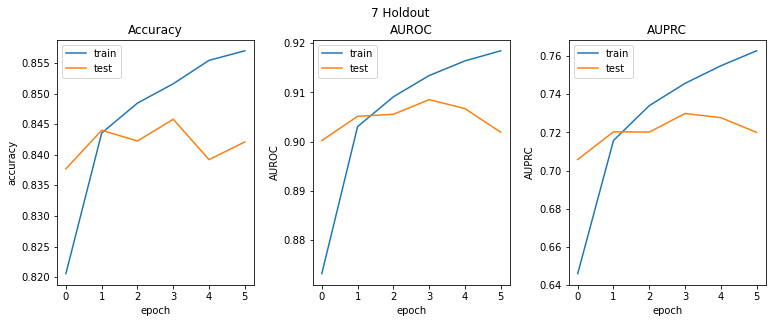

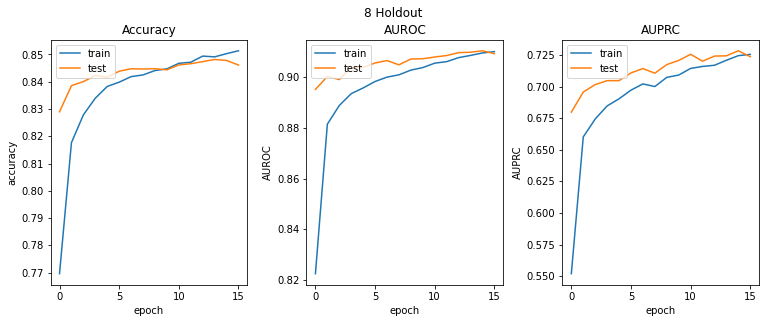

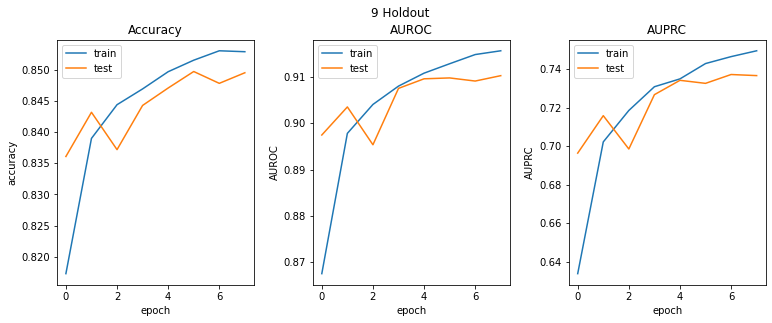

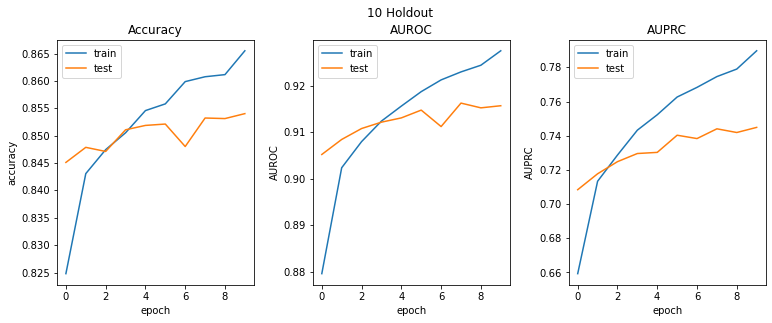

----------------------------------------------------------------------------------------------------
-- PROMOTERS -- with BORUTA FEATURE SELECTION (selective)
MLP Metrics - 10-holdouts estimate:
Accuracy : train - 0.8610082098518221  --  test - 0.8482404765480303
AUROC : train - 0.926005039875637  --  test - 0.9115797167326514
AUPRC : train - 0.7821367946295082  --  test - 0.7343833693474171
--------------------------------------------------------------------------------
MLP - Train history:


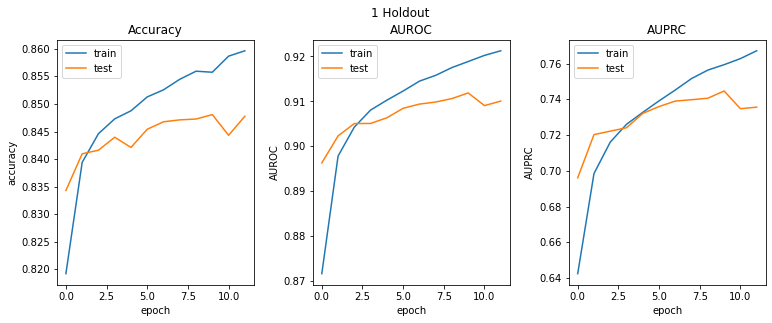

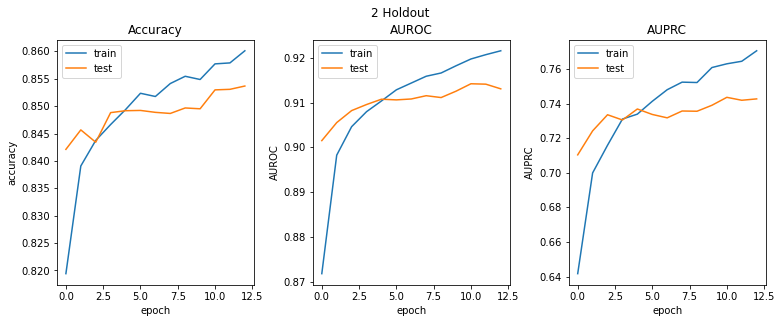

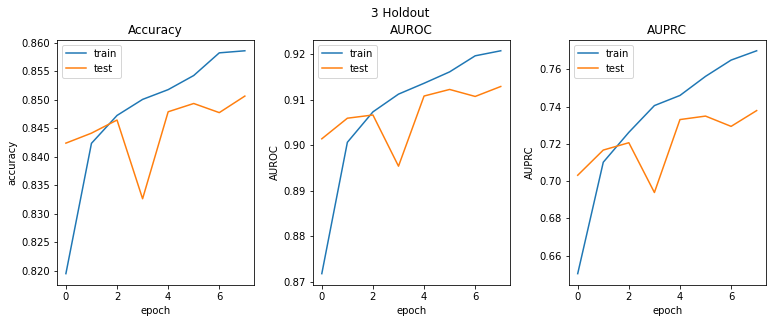

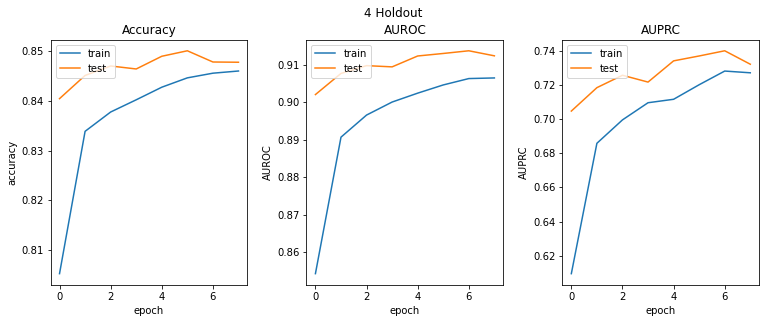

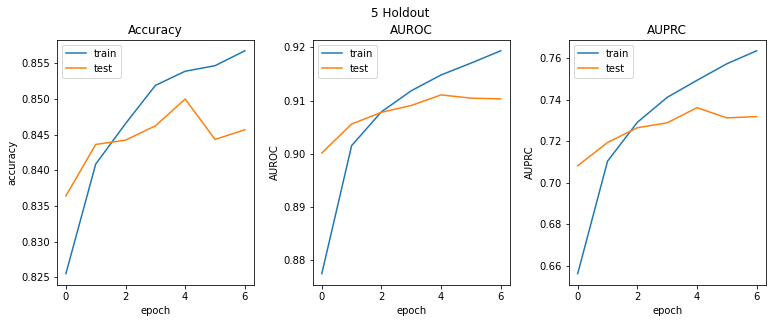

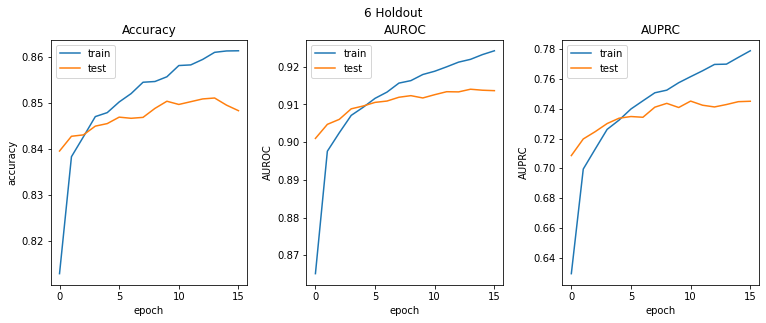

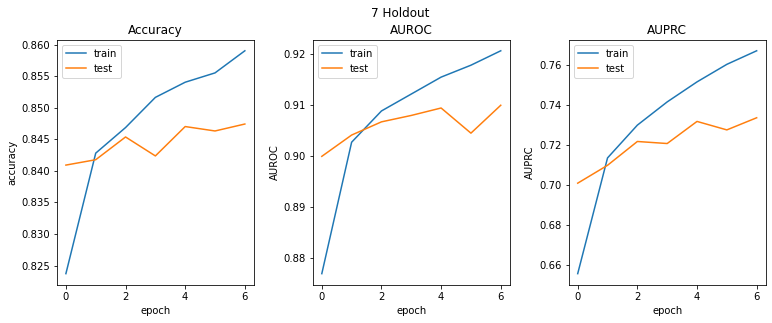

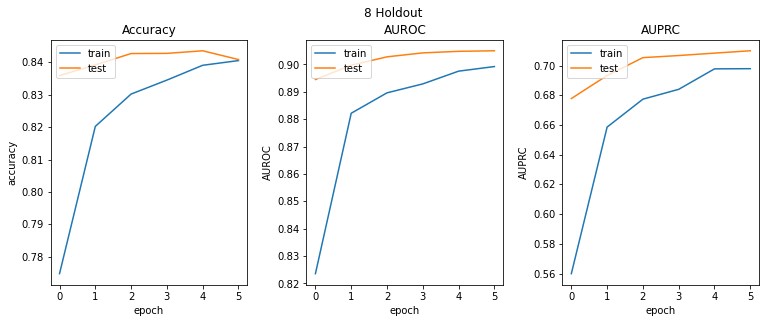

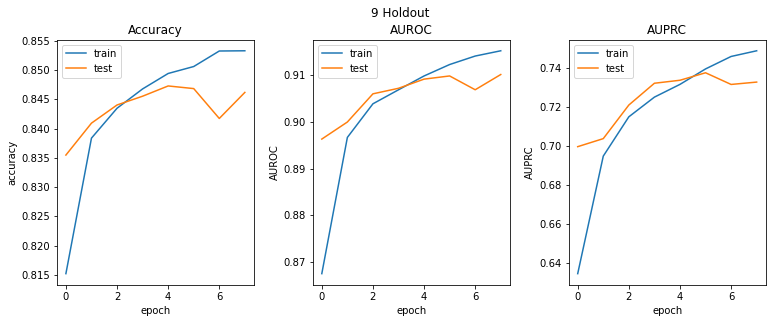

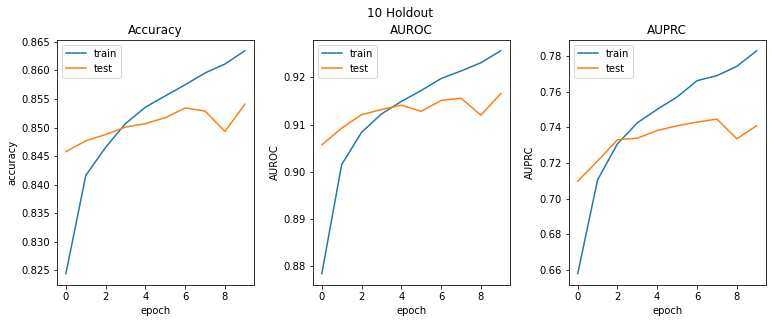

In [50]:
MLP_metrics_estimate = model_metrics_holdout_estimate(MLP_metrics_promoters["boruta_False"], number_of_splits)
print("-- PROMOTERS -- withOUT BORUTA FEATURE SELECTION")
print(f"MLP Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MLP_metrics_estimate['accuracy_train']}  --  test - {MLP_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MLP_metrics_estimate['AUROC_train']}  --  test - {MLP_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MLP_metrics_estimate['AUPRC_train']}  --  test - {MLP_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MLP - Train history:")
plot_train_history(MLP_history_promoters["boruta_False"])

print("-"*100)

MLP_metrics_estimate = model_metrics_holdout_estimate(MLP_metrics_promoters["boruta_True"], number_of_splits)
print("-- PROMOTERS -- with BORUTA FEATURE SELECTION (selective)")
print(f"MLP Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MLP_metrics_estimate['accuracy_train']}  --  test - {MLP_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MLP_metrics_estimate['AUROC_train']}  --  test - {MLP_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MLP_metrics_estimate['AUPRC_train']}  --  test - {MLP_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MLP - Train history:")
plot_train_history(MLP_history_promoters["boruta_True"])

In [53]:
MLP_metrics_promoters

{'boruta_True': [{'accuracy_train': 0.8691805166199439,
   'accuracy_test': 0.8477248836161586,
   'AUROC_train': 0.9316258866265176,
   'AUROC_test': 0.910291025104564,
   'AUPRC_train': 0.799867754920471,
   'AUPRC_test': 0.7356074096598941},
  {'accuracy_train': 0.8662520024028835,
   'accuracy_test': 0.8536817339940932,
   'AUROC_train': 0.9302799546264787,
   'AUROC_test': 0.9131811261346486,
   'AUPRC_train': 0.7932045839765405,
   'AUPRC_test': 0.7428782216184122},
  {'accuracy_train': 0.8626977372847416,
   'accuracy_test': 0.8506782800220253,
   'AUROC_train': 0.9281695354326,
   'AUROC_test': 0.9130397554573177,
   'AUPRC_train': 0.7909347900957879,
   'AUPRC_test': 0.7381452849862872},
  {'accuracy_train': 0.8499574489387265,
   'accuracy_test': 0.8477248836161586,
   'AUROC_train': 0.9153795789504894,
   'AUROC_test': 0.9125136699537361,
   'AUPRC_train': 0.750664209218836,
   'AUPRC_test': 0.7323172063854766},
  {'accuracy_train': 0.8612710252302763,
   'accuracy_test': 0.

In [54]:
# Saving results
import json

# Saving metrics
file = open("results/MLP_metrics_promoters.txt", "w") 
string = repr(MLP_metrics_promoters)
file.write("MLP_metrics_promoters = " + string + "\n")
file.close()

# Saving history
for boruta in ("boruta_True", "boruta_False"):
    with open("results/MLP_history_promoters_" + boruta + ".json", 'w') as h:
        for holdout in range(number_of_splits):
            json.dump(MLP_history_promoters[boruta][holdout].history, h)

#### Wilcoxon test
The Wilcoxon signed-rank test is a non-parametric statistical hypothesis test which checks the null hypothesis that two related paired samples come from the same distribution. Here, this test is used to determine whether there is any **statistically significant** difference in the results produced by two different model architectures.

#### Wilcoxon test [MLP_Promoters_Boruta VS MLP_Promoters_No_Boruta]

In [25]:
from scipy.stats import wilcoxon

In [58]:
MLP_distinct_metrics_promoters = {}
MLP_distinct_metrics_promoters["boruta_True"] = {}
MLP_distinct_metrics_promoters["boruta_False"] = {}

for boruta in ("boruta_True", "boruta_False"):
    MLP_distinct_metrics_promoters[boruta]["accuracy_test"] = []
    MLP_distinct_metrics_promoters[boruta]["AUROC_test"] = []
    MLP_distinct_metrics_promoters[boruta]["AUPRC_test"] = []
    for holdout in MLP_metrics_promoters[boruta]:
        MLP_distinct_metrics_promoters[boruta]["accuracy_test"].append(holdout['accuracy_test'])
        MLP_distinct_metrics_promoters[boruta]["AUROC_test"].append(holdout['AUROC_test'])
        MLP_distinct_metrics_promoters[boruta]["AUPRC_test"].append(holdout['AUPRC_test'])

print("MLP - Promoters - Wilcoxon test - Boruta model performances VS Non-Boruta model performances")
print(f"-Accuracy: {wilcoxon(MLP_distinct_metrics_promoters['boruta_True']['accuracy_test'], MLP_distinct_metrics_promoters['boruta_False']['accuracy_test'])}")
print(f"-AUROC: {wilcoxon(MLP_distinct_metrics_promoters['boruta_True']['AUROC_test'], MLP_distinct_metrics_promoters['boruta_False']['AUROC_test'])}")
print(f"-AUPRC: {wilcoxon(MLP_distinct_metrics_promoters['boruta_True']['AUPRC_test'], MLP_distinct_metrics_promoters['boruta_False']['AUPRC_test'])}")

MLP - Promoters - Wilcoxon test - Boruta model performances VS Non-Boruta model performances
-Accuracy: WilcoxonResult(statistic=15.0, pvalue=0.232421875)
-AUROC: WilcoxonResult(statistic=14.0, pvalue=0.193359375)
-AUPRC: WilcoxonResult(statistic=21.0, pvalue=0.556640625)


#### Enhancers

In [24]:
print("---- ENHANCERS ----")

MLP_metrics_enhancers = {}
MLP_history_enhancers = {}

MLP_metrics_enhancers["boruta_True"] = []
MLP_metrics_enhancers["boruta_False"] = []

MLP_history_enhancers["boruta_True"] = []
MLP_history_enhancers["boruta_False"] = []

# Generate holdouts
for holdout_number, (train_indices, test_indices) in enumerate(holdouts_generator.split(enhancers_epigenomes, enhancers_labels)):
    print(f"-- HOLDOUT {holdout_number+1} --")
    # Train/Test data
    x_train_enhancers, x_test_enhancers = enhancers_epigenomes.iloc[train_indices], enhancers_epigenomes.iloc[test_indices]
    y_train_enhancers, y_test_enhancers = enhancers_labels.iloc[train_indices], enhancers_labels.iloc[test_indices]
    
    ## Hyperparameter tuning
    # Generate holdouts
    for holdout_number_tuning, (train_indices_tuning, val_indices_tuning) in enumerate(holdouts_generator_tuning.split(x_train_enhancers, y_train_enhancers)):
        # Train/Validation data
        x_train_enhancers_tuning, x_val_enhancers_tuning = x_train_enhancers.iloc[train_indices_tuning], x_train_enhancers.iloc[val_indices_tuning]
        y_train_enhancers_tuning, y_val_enhancers_tuning = y_train_enhancers.iloc[train_indices_tuning], y_train_enhancers.iloc[val_indices_tuning]
        
        hp = kt.HyperParameters()

        best_hyperparameters = hyperparameter_tuning(
            x_train_enhancers_tuning.values,
            x_val_enhancers_tuning.values,
            y_train_enhancers_tuning.values,
            y_val_enhancers_tuning.values,
            build_MLP_hypermodel,
            name = "MLP_hypermodel_enhancers_" + str(holdout_number),
            directory='MLP_hypermodel_enhancers',
            max_trials = 8,
            epochs = 50,
            batch_size = 256
        )
    
    ## Remove uncorrelated features with the output
    uncorrelated_features = uncorrelated_features_test(x_train_enhancers, y_train_enhancers)
    for feature in (x_train_enhancers.columns):
        if feature in (uncorrelated_features):
            x_train_enhancers = x_train_enhancers.drop(columns=feature)
            x_test_enhancers = x_test_enhancers.drop(columns=feature)
            
    ## Remove correlated features with eachother
    correlated_features = correlated_features_test(x_train_enhancers)
    for feature in (x_train_enhancers.columns):
        if feature in (correlated_features):
            x_train_enhancers = x_train_enhancers.drop(columns=feature)
            x_test_enhancers = x_test_enhancers.drop(columns=feature)
    
    ## Boruta feature selection
    for use_Boruta in (False, True):
        if use_Boruta:
            print("-- Running Boruta Feature Selection:")
            kept_features = boruta_feature_selection(x_train_enhancers, y_train_enhancers)
            x_train_enhancers = x_train_enhancers[kept_features]
            x_test_enhancers = x_test_enhancers[kept_features]
        
        # Build MLP with best set of hyperparameters
        MLP = build_MLP(best_hyperparameters, x_train_enhancers.shape)

        print("- Training model:\n")
        MLP_holdout_metrics, MLP_holdout_history = train_model(
            MLP,
            x_train_enhancers.values,
            x_test_enhancers.values,
            y_train_enhancers.values,
            y_test_enhancers.values,
            epochs,
            batch_size
        )

        MLP_metrics_enhancers["boruta_" + str(use_Boruta)].append(MLP_holdout_metrics)
        MLP_history_enhancers["boruta_" + str(use_Boruta)].append(MLP_holdout_history)

Trial 8 Complete [00h 00m 28s]
multi_objective: -2.3371983766555786

Best multi_objective So Far: -2.357012093067169
Total elapsed time: 00h 04m 54s
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'depth': 3, 'units_0': 136, 'dropout_0': 0.3, 'units_1': 8, 'dropout_1': 0.3, 'units_2': 8, 'dropout_2': 0.3}
-- 2 Uncorrelated features: [Pearson+Spearman]
['ZNF282', 'SNRNP70']
-- Actually uncorrelated features: [confirmed via MIC]
['ZNF282', 'SNRNP70']
-- 0 Correlated features: [Pearson]
[]
Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 136)               76296     
                                                                 
 dropout_3 (Dropout)         (None, 136)               0         
                                                                 
 dense_5 (Dense)             (None, 8)                 1096      
    

Iteration: 	33 / 100
Confirmed: 	320
Tentative: 	90
Rejected: 	150
Iteration: 	34 / 100
Confirmed: 	320
Tentative: 	90
Rejected: 	150
Iteration: 	35 / 100
Confirmed: 	320
Tentative: 	90
Rejected: 	150
Iteration: 	36 / 100
Confirmed: 	320
Tentative: 	90
Rejected: 	150
Iteration: 	37 / 100
Confirmed: 	321
Tentative: 	89
Rejected: 	150
Iteration: 	38 / 100
Confirmed: 	321
Tentative: 	89
Rejected: 	150
Iteration: 	39 / 100
Confirmed: 	321
Tentative: 	89
Rejected: 	150
Iteration: 	40 / 100
Confirmed: 	322
Tentative: 	88
Rejected: 	150
Iteration: 	41 / 100
Confirmed: 	322
Tentative: 	88
Rejected: 	150
Iteration: 	42 / 100
Confirmed: 	322
Tentative: 	88
Rejected: 	150
Iteration: 	43 / 100
Confirmed: 	322
Tentative: 	88
Rejected: 	150
Iteration: 	44 / 100
Confirmed: 	322
Tentative: 	86
Rejected: 	152
Iteration: 	45 / 100
Confirmed: 	322
Tentative: 	86
Rejected: 	152
Iteration: 	46 / 100
Confirmed: 	325
Tentative: 	83
Rejected: 	152
Iteration: 	47 / 100
Confirmed: 	325
Tentative: 	83
Rejected: 

Epoch 5/1000
198/198 [==============================] - 5s 23ms/step - loss: 0.2744 - accuracy: 0.9044 - recall: 0.2356 - precision: 0.7504 - AUROC: 0.8294 - AUPRC: 0.4913 - f1_score: 0.3586 - balanced_accuracy: 0.6128 - specificity: 0.9900 - miss_rate: 0.7644 - fall_out: 0.0100 - mcc: 0.3860 - val_loss: 0.2513 - val_accuracy: 0.9121 - val_recall: 0.2892 - val_precision: 0.8185 - val_AUROC: 0.8524 - val_AUPRC: 0.5814 - val_f1_score: 0.4274 - val_balanced_accuracy: 0.6405 - val_specificity: 0.9918 - val_miss_rate: 0.7108 - val_fall_out: 0.0082 - val_mcc: 0.4543


-- ENHANCERS -- withOUT BORUTA FEATURE SELECTION
MLP Metrics - 10-holdouts estimate:
Accuracy : train - 0.9105297463853992  --  test - 0.9092043928261042
AUROC : train - 0.8975376189283605  --  test - 0.8528177944393699
AUPRC : train - 0.6178753437988747  --  test - 0.5708571083326558
--------------------------------------------------------------------------------
MLP - Train history:


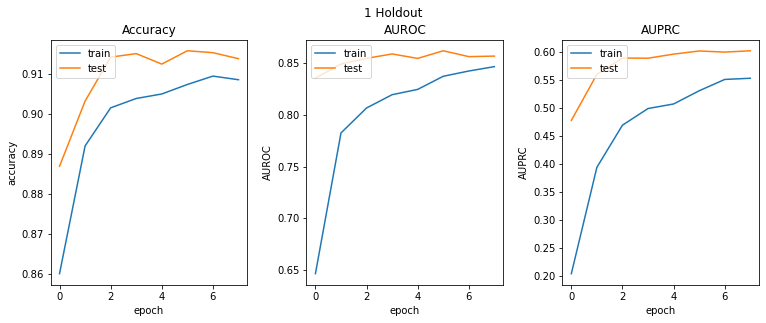

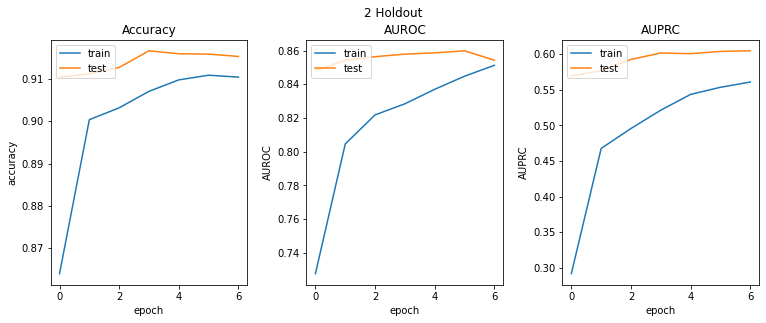

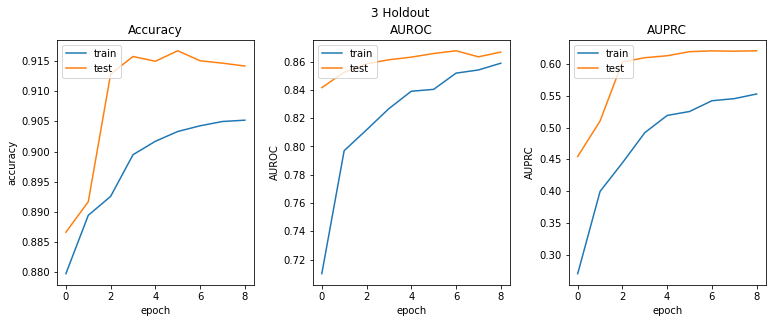

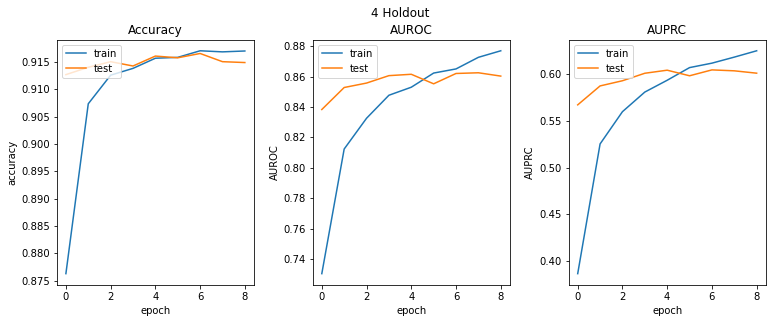

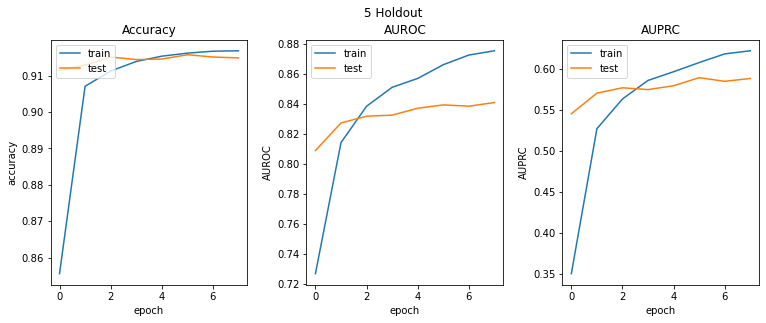

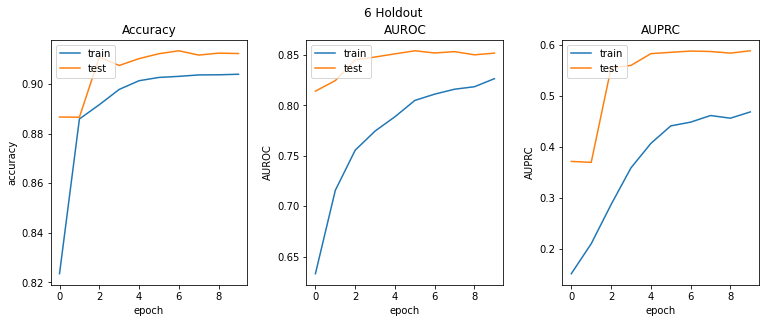

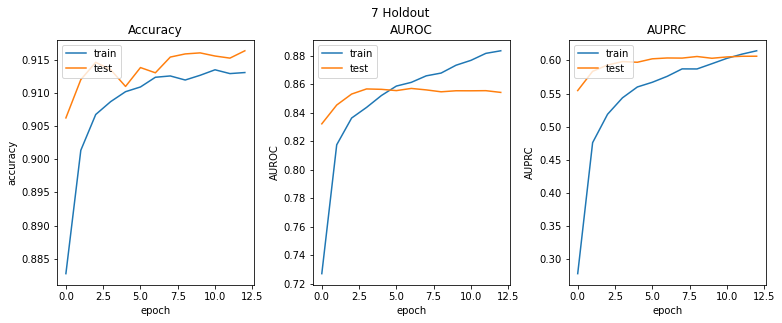

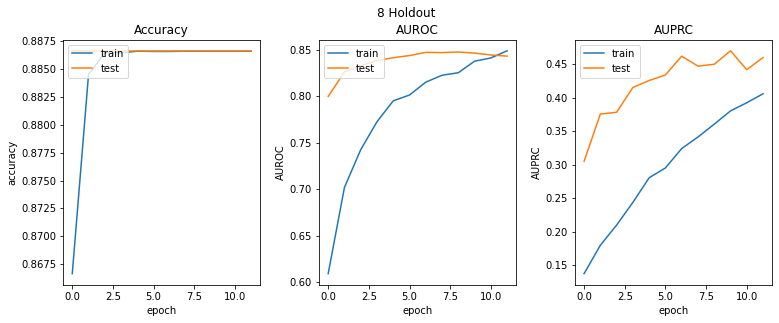

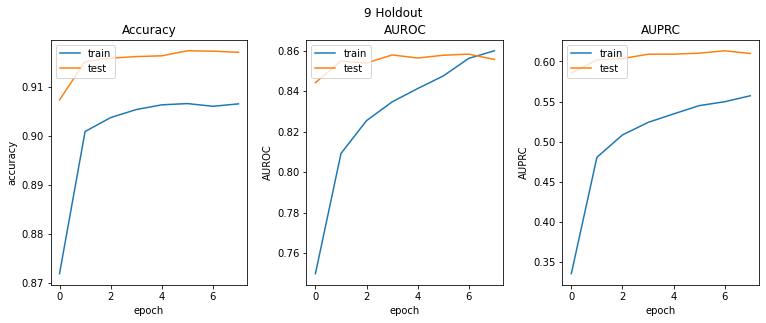

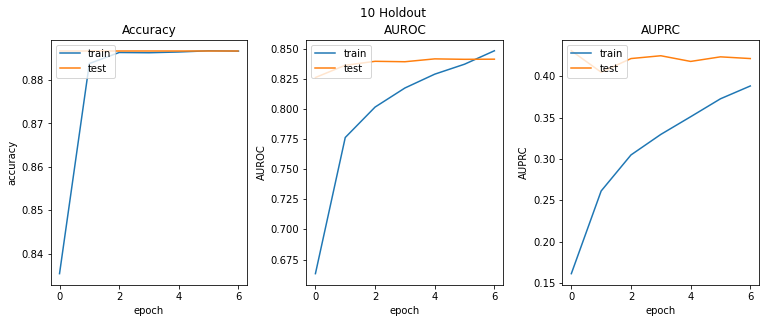

----------------------------------------------------------------------------------------------------
-- ENHANCERS -- with BORUTA FEATURE SELECTION
MLP Metrics - 10-holdouts estimate:
Accuracy : train - 0.9148712175080982  --  test - 0.9137078296594769
AUROC : train - 0.8841010755246934  --  test - 0.8576130727534329
AUPRC : train - 0.62724966027985  --  test - 0.5990892730926193
--------------------------------------------------------------------------------
MLP - Train history:


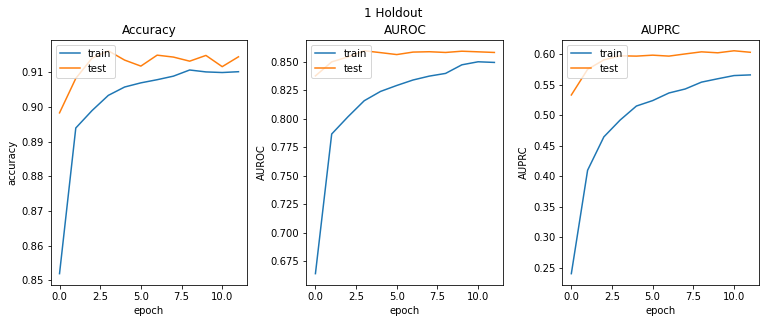

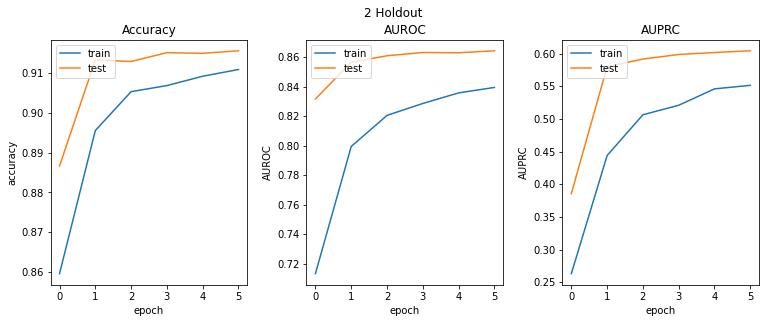

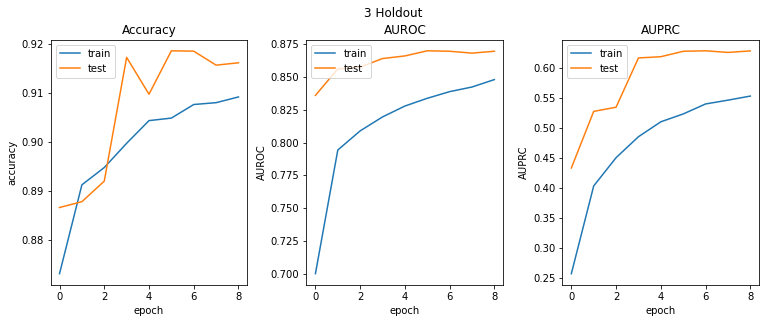

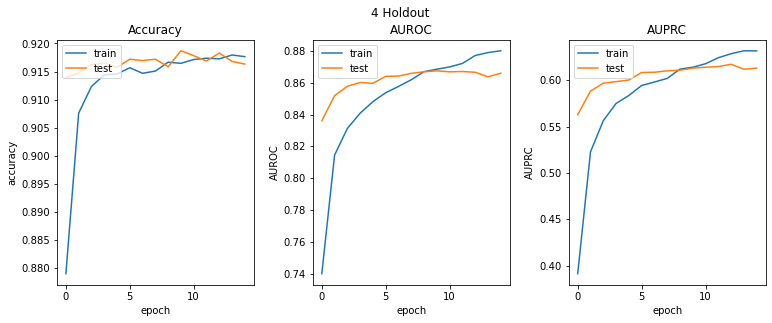

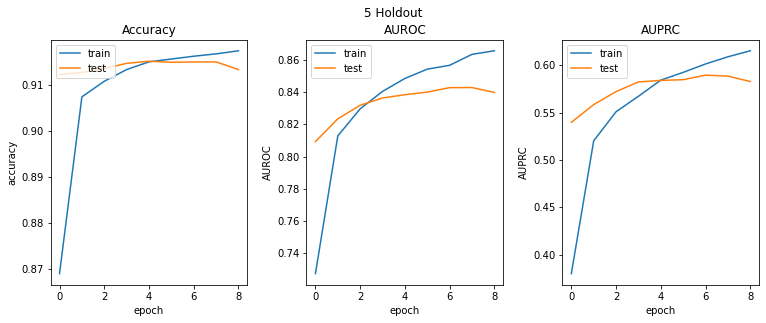

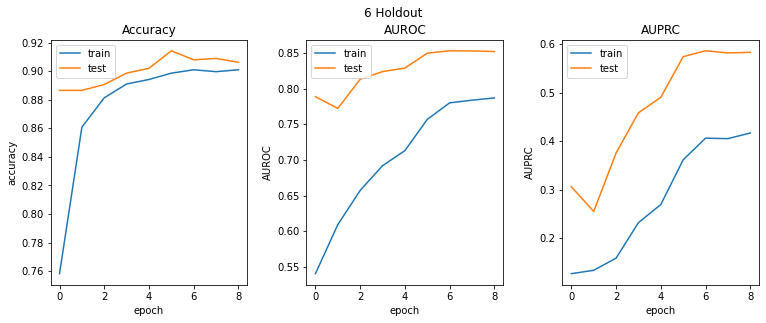

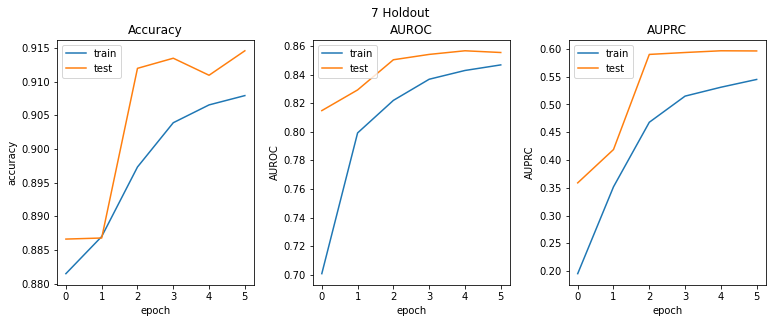

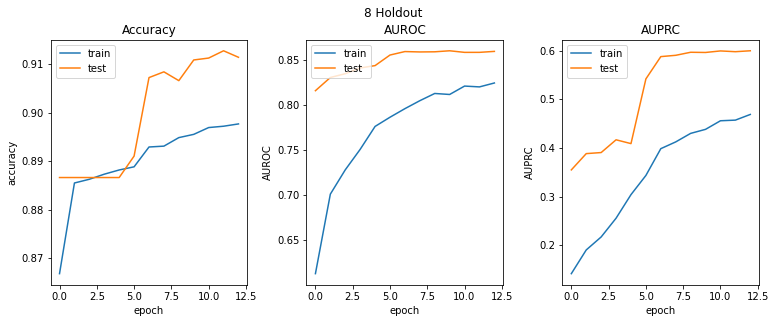

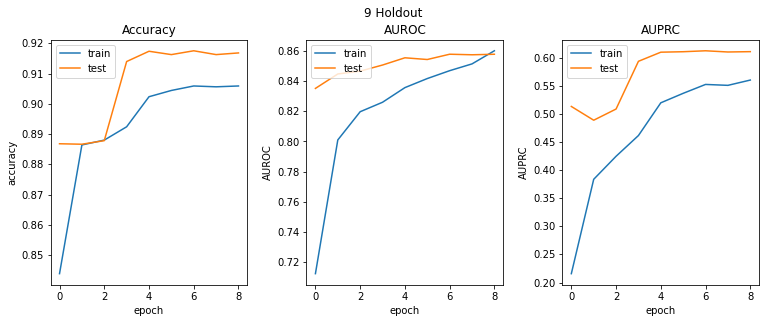

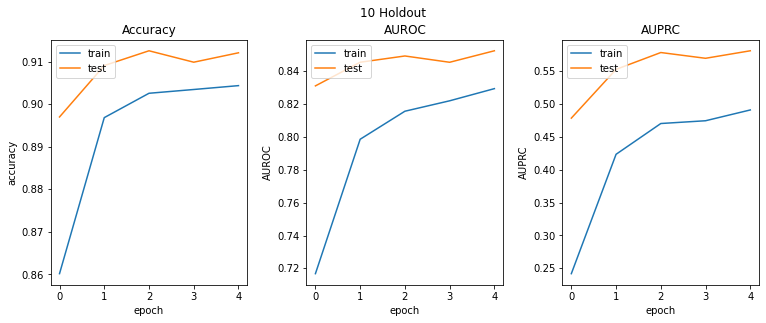

In [25]:
MLP_metrics_estimate = model_metrics_holdout_estimate(MLP_metrics_enhancers["boruta_False"], number_of_splits)
print("-- ENHANCERS -- withOUT BORUTA FEATURE SELECTION")
print(f"MLP Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MLP_metrics_estimate['accuracy_train']}  --  test - {MLP_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MLP_metrics_estimate['AUROC_train']}  --  test - {MLP_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MLP_metrics_estimate['AUPRC_train']}  --  test - {MLP_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MLP - Train history:")
plot_train_history(MLP_history_enhancers["boruta_False"])

print("-"*100)

MLP_metrics_estimate = model_metrics_holdout_estimate(MLP_metrics_enhancers["boruta_True"], number_of_splits)
print("-- ENHANCERS -- with BORUTA FEATURE SELECTION")
print(f"MLP Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MLP_metrics_estimate['accuracy_train']}  --  test - {MLP_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MLP_metrics_estimate['AUROC_train']}  --  test - {MLP_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MLP_metrics_estimate['AUPRC_train']}  --  test - {MLP_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MLP - Train history:")
plot_train_history(MLP_history_enhancers["boruta_True"])

In [26]:
MLP_metrics_enhancers

{'boruta_True': [{'accuracy_train': 0.9139606541834558,
   'accuracy_test': 0.9145137078296595,
   'AUROC_train': 0.8870782490688551,
   'AUROC_test': 0.858294713532465,
   'AUPRC_train': 0.6307042609597342,
   'AUPRC_test': 0.6038708123262326},
  {'accuracy_train': 0.9159160938611045,
   'accuracy_test': 0.9155408074583234,
   'AUROC_train': 0.8833191924748005,
   'AUROC_test': 0.8643202097423118,
   'AUPRC_train': 0.6211444423614926,
   'AUPRC_test': 0.6046434026438599},
  {'accuracy_train': 0.9147902346527613,
   'accuracy_test': 0.9160938611045272,
   'AUROC_train': 0.8826625985722133,
   'AUROC_test': 0.8694618646672756,
   'AUPRC_train': 0.6258925511772357,
   'AUPRC_test': 0.6290504574729222},
  {'accuracy_train': 0.9197479655526586,
   'accuracy_test': 0.9163308840957572,
   'AUROC_train': 0.9010941014966156,
   'AUROC_test': 0.8658580674968345,
   'AUPRC_train': 0.6772079423458085,
   'AUPRC_test': 0.613083650673553},
  {'accuracy_train': 0.9166074109188591,
   'accuracy_test'

In [27]:
# Saving results
import json

# Saving metrics
file = open("results/MLP_metrics_enhancers.txt", "w") 
string = repr(MLP_metrics_enhancers)
file.write("MLP_metrics_enhancers = " + string + "\n")
file.close()

# Saving history
for boruta in ("boruta_True", "boruta_False"):
    with open("results/MLP_history_enhancers_" + boruta + ".json", 'w') as h:
        for holdout in range(number_of_splits):
            json.dump(MLP_history_enhancers[boruta][holdout].history, h)

#### Wilcoxon test [MLP_Enhancers_Boruta VS MLP_Enhancers_No_Boruta]

In [28]:
MLP_distinct_metrics_enhancers = {}
MLP_distinct_metrics_enhancers["boruta_True"] = {}
MLP_distinct_metrics_enhancers["boruta_False"] = {}

for boruta in ("boruta_True", "boruta_False"):
    MLP_distinct_metrics_enhancers[boruta]["accuracy_test"] = []
    MLP_distinct_metrics_enhancers[boruta]["AUROC_test"] = []
    MLP_distinct_metrics_enhancers[boruta]["AUPRC_test"] = []
    for holdout in MLP_metrics_enhancers[boruta]:
        MLP_distinct_metrics_enhancers[boruta]["accuracy_test"].append(holdout['accuracy_test'])
        MLP_distinct_metrics_enhancers[boruta]["AUROC_test"].append(holdout['AUROC_test'])
        MLP_distinct_metrics_enhancers[boruta]["AUPRC_test"].append(holdout['AUPRC_test'])

print("MLP - Enhancers - Wilcoxon test - Boruta model performances VS Non-Boruta model performances")
print(f"-Accuracy: {wilcoxon(MLP_distinct_metrics_enhancers['boruta_True']['accuracy_test'], MLP_distinct_metrics_enhancers['boruta_False']['accuracy_test'])}")
print(f"-AUROC: {wilcoxon(MLP_distinct_metrics_enhancers['boruta_True']['AUROC_test'], MLP_distinct_metrics_enhancers['boruta_False']['AUROC_test'])}")
print(f"-AUPRC: {wilcoxon(MLP_distinct_metrics_enhancers['boruta_True']['AUPRC_test'], MLP_distinct_metrics_enhancers['boruta_False']['AUPRC_test'])}")

MLP - Enhancers - Wilcoxon test - Boruta model performances VS Non-Boruta model performances
-Accuracy: WilcoxonResult(statistic=21.0, pvalue=0.556640625)
-AUROC: WilcoxonResult(statistic=3.0, pvalue=0.009765625)
-AUPRC: WilcoxonResult(statistic=19.0, pvalue=0.431640625)


## Data retrival: Genomic data
* **UCSC**:  genomic sequence data.
* **FANTOM**: labels.

Load and visualize genomic sequence data for both promoters and enhancers for cell line **HepG2**.

In [26]:
genome = Genome("hg38")

Loading chromosomes for genome hg38:   0%|                                                      | 0/25 [00:00<…

In [27]:
genome

C:\Users\Paolo\anaconda3\lib\site-packages\dateparser\date_parser.py:35: PytzUsageWarning: The localize method is no longer necessary, as this time zone supports the fold attribute (PEP 495). For more details on migrating to a PEP 495-compliant implementation, see https://pytz-deprecation-shim.readthedocs.io/en/latest/migration.html
  date_obj = stz.localize(date_obj)


Human, Homo sapiens, hg38, 2013-12-04, 25 chromosomes

In [90]:
cell_line = "HEPG2"
window_size = 256

promoters_epigenomes, promoters_labels = load_epigenomes(
    cell_line = cell_line,
    dataset = "fantom",
    region = "promoters",
    window_size = window_size,
    binarize = True,
    min_active_tpm_value = 1,
    max_inactive_tpm_value = 1
)

enhancers_epigenomes, enhancers_labels = load_epigenomes(
    cell_line = cell_line,
    dataset = "fantom",
    region = "enhancers",
    window_size = window_size,
    binarize = True,
    min_active_tpm_value = 0.09,
    max_inactive_tpm_value = 0.09
)

In [16]:
def to_bed(data:pd.DataFrame)->pd.DataFrame:
    """Return bed coordinates from given dataset."""
    return data.reset_index()[data.index.names]

In [92]:
bed_promoters = to_bed(promoters_epigenomes)
bed_enhancers = to_bed(enhancers_epigenomes)

In [31]:
bed_promoters

chrom,chrom,chromStart,chromEnd,strand
0,chr1,628964,629220,+
1,chr1,629013,629269,+
2,chr1,629642,629898,+
3,chr1,629847,630103,+
4,chr1,629905,630161,+
...,...,...,...,...
99876,chrX,154441877,154442133,+
99877,chrX,154584927,154585183,+
99878,chrY,1452882,1453138,-
99879,chrY,2500959,2501215,-


In [32]:
bed_enhancers

chrom,chrom,chromStart,chromEnd,strand
0,chr10,100006381,100006637,.
1,chr10,100008146,100008402,.
2,chr10,100014418,100014674,.
3,chr10,100020216,100020472,.
4,chr10,100043528,100043784,.
...,...,...,...,...
63280,chrY,7520247,7520503,.
63281,chrY,7724272,7724528,.
63282,chrY,7770029,7770285,.
63283,chrY,7796295,7796551,.


In [93]:
promoters_genome = genome.bed_to_sequence(to_bed(promoters_epigenomes))
enhancers_genome = genome.bed_to_sequence(to_bed(enhancers_epigenomes))

In [34]:
print("-- PROMOTERS:")
print(promoters_genome)

print("-"*80)

print("-- ENHANCERS:")
print(enhancers_genome)

-- PROMOTERS:
['AAATGGTCATCCATCCTTTGGCCCCAATACCTAAACTAAGGTCTATGAACAATAAGATGATTTTCTTCAGTGGGACTTTTTTGTTTAATATATTAGATTTGACCTTCAGCAAGGTCAAAGGGAGTCCGAACTAGTCTCAGGCTTCAACATCGAATACGCCGCAGGCCCCTTCGCCCTATTCTTCATAGCCGAATACACAAACATTATTATAATAAACACCCTCACCACTACAATCTTCCTAGGAACAACATATAAC'
 'CAATAAGATGATTTTCTTCAGTGGGACTTTTTTGTTTAATATATTAGATTTGACCTTCAGCAAGGTCAAAGGGAGTCCGAACTAGTCTCAGGCTTCAACATCGAATACGCCGCAGGCCCCTTCGCCCTATTCTTCATAGCCGAATACACAAACATTATTATAATAAACACCCTCACCACTACAATCTTCCTAGGAACAACATATAACGCACTCTCCCCTGAACTCTACACAACATATTTTGTCACCAAGACCCTAC'
 'AATCCCCTGGCCCAACCCGTCATCTACTCTACCATCTTTGCAGGCACACTCATCACAGCGCTAAGCTCGCACTGATTTTTTACCTGAGTAGGCCTAGAAATAAACATGCTAGCTTTTATTCCAGTTCTAACCAAAAAAATAAACCCTCGTTCCACAGAAGCTGCCATCAAGTATTTCCTCACGCAAGCAACCGCATCCATAATCCTTCTAATAGCTATCCTCTTCAACAATATACTCTCCGGACAATGAACCATAA'
 ...
 'AGATTTATAACATATATGATATAATCATGGGGGGGGTGAATAATTGAGACTTTATTCTTATAGAATTGTATTTTTATTTATTCTTATAGAATTGTATTTGACTTATATTCCTGACAATTCTTTTATAGAGTTATATTTGAATTGTATTCTTGCCAGGTGTCTTACTGAATTCTATTTGAATTGTGTTCTTGCCATTTCT

### NaN values
Check for NaN values, n/N represent a missing value.
In this case NaN values are **ignored** as there are very few.

In [36]:
promoters_NaN = sum([
    nucleotide.lower() == "n"
    for sequence in (promoters_genome)
    for nucleotide in sequence
])

enhancers_NaN = sum([
    nucleotide.lower() == "n"
    for sequence in (enhancers_genome)
    for nucleotide in sequence
])

print(f"Promoters NaN values: {promoters_NaN}")
print(f"Enhancers NaN values: {enhancers_NaN}")

Promoters NaN values: 4
Enhancers NaN values: 1


#### CNN data sequence generation
The following step constructs the **Mixed Sequence** to train CNNs with DNA sequence data.

In [197]:
def get_cnn_sequence(
    genome: Genome,
    bed: pd.DataFrame,
    y: np.ndarray,
    batch_size: int
) -> MixedSequence:
    """ Returns the genomic sequence data for the CNN training.
    
    Parameters
    -------------------------
    genome: Genome,
        The genome from where to extract the genomic sequence.
    bed: pd.DataFrame,
        The BED file coordinates describing where to extract the sequences.
    y: np.ndarray,
        The values the model should predict.
    batch_size: int,
        The size of the batches to generate.
    
    Returns
    --------------------------
        MixedSequence object to train a CNN."""
    
    return MixedSequence(
        x = BedSequence(
            genome,
            bed,
            batch_size
        ),
        y = VectorSequence(y, batch_size)
    )

In [38]:
batch_size=256
mixed_sequence_promoters = get_cnn_sequence(genome, bed_promoters, promoters_labels[cell_line].values, batch_size)
mixed_sequence_enhancers = get_cnn_sequence(genome, bed_enhancers, enhancers_labels[cell_line].values, batch_size)

In [39]:
mixed_sequence_promoters[0]

(array([[[0., 0., 0., 1.],
         [0., 0., 1., 0.],
         [0., 0., 0., 1.],
         ...,
         [0., 1., 0., 0.],
         [0., 0., 1., 0.],
         [0., 1., 0., 0.]],
 
        [[1., 0., 0., 0.],
         [0., 1., 0., 0.],
         [0., 0., 1., 0.],
         ...,
         [0., 0., 1., 0.],
         [0., 0., 0., 1.],
         [1., 0., 0., 0.]],
 
        [[0., 0., 1., 0.],
         [0., 0., 0., 1.],
         [0., 0., 0., 1.],
         ...,
         [0., 1., 0., 0.],
         [0., 1., 0., 0.],
         [0., 0., 1., 0.]],
 
        ...,
 
        [[0., 1., 0., 0.],
         [0., 0., 1., 0.],
         [0., 1., 0., 0.],
         ...,
         [0., 1., 0., 0.],
         [0., 0., 0., 1.],
         [0., 0., 0., 1.]],
 
        [[0., 0., 1., 0.],
         [0., 0., 1., 0.],
         [0., 0., 1., 0.],
         ...,
         [0., 1., 0., 0.],
         [1., 0., 0., 0.],
         [0., 1., 0., 0.]],
 
        [[0., 0., 0., 1.],
         [0., 0., 0., 1.],
         [0., 0., 0., 1.],
         

### CNN
A convolutional neural network consists a set of **convolutional** layers (convolution+maxPooling) and a set of **dense** layer. To avoid overfitting of the model dropout layers were added.

To have a statistically sound estimate of an architecture performance, multiple models are built and trained, each with the same architecture, over different portions of the data (holdouts) and, the average performance of those, is considered as an estimate of the overall performance of the architecture.

Hyperparameter tuning is performed training a meta model over training and validation data to obtain the best set of hyperparameters via **Bayesian optimization**.

Here are the functions to **evaluate** the model performances, build and train the **hypermodel** for hyperparameter tuning, and to build and train the **model** with the best set of hyperparameters found.

In [198]:
def model_metrics_holdout_estimate_evaluation(
    model_metrics: list,
    holdout_total_number: int
) -> dict[str, float]:
    """ Return the average metrics (accuracy, AUROC, AUPRC) of the model accross all the holdouts for train and test.
    
    Parameters
    ------------------------
    model_metrics: list
        The list with the train/test metrics (accuracy, AUROC, AUPRC) for all the holdouts.
    holdout_total_number: int
        The number of total holdouts.

    Returns
    ------------------------
    dict: dict[str, float]
        The average metrics of the model accross all the holdouts for train and test."""
    
    total_accuracy_train = 0
    total_accuracy_test = 0
    total_AUROC_train = 0
    total_AUROC_test = 0
    total_AUPRC_train = 0
    total_AUPRC_test = 0

    for holdout in model_metrics:
        total_accuracy_train += holdout["train_evaluation"]['accuracy']
        total_AUROC_train += holdout["train_evaluation"]['AUROC']
        total_AUPRC_train += holdout["train_evaluation"]['AUPRC']

    for holdout in model_metrics:
        total_accuracy_test += holdout["test_evaluation"]['accuracy']
        total_AUROC_test += holdout["test_evaluation"]['AUROC']
        total_AUPRC_test += holdout["test_evaluation"]['AUPRC']

    avg_accuracy_train = total_accuracy_train / holdout_total_number
    avg_accuracy_test = total_accuracy_test / holdout_total_number
    avg_AUROC_train = total_AUROC_train / holdout_total_number
    avg_AUROC_test = total_AUROC_test / holdout_total_number
    avg_AUPRC_train = total_AUPRC_train / holdout_total_number
    avg_AUPRC_test = total_AUPRC_test / holdout_total_number

    return {
        'accuracy_train': avg_accuracy_train,
        'accuracy_test': avg_accuracy_test,
        'AUROC_train': avg_AUROC_train,
        'AUROC_test': avg_AUROC_test,
        'AUPRC_train': avg_AUPRC_train,
        'AUPRC_test': avg_AUPRC_test,
    }

In [199]:
def hyperparameter_tuning_CNN(
    x_train: pd.DataFrame,
    x_validation: pd.DataFrame,
    y_train: np.ndarray,
    y_validation: np.ndarray,
    hypermodel: tf.keras.Model,
    name: str,
    directory: str,
    max_trials: int = 10,
    epochs: int = 50,
    batch_size: int = 256
):
    """ Tunes the hypermodel with bayesian optiomization and returns the best set of hyperparameters.
    
    Parameters
    ------------------------
    x_train: pd.DataFrame
        The input data for training the hypermodel.
    x_validation: pd.DataFrame
        The input data for testing the hypermodel.
    y_train: np.ndarray
        The labels of the input data for training the hypermodel.
    y_validation: np.ndarray
        The labels of the input data for testing the hypermodel.
    hypermodel: model
        The hypermodel to tune or a function that builds a model using the hp object.
    name: str
        The project name.
    directory: str
        The directory where to store results.
    max_trials: int
        The maximum amount of model configuration that the algorithm will try out.
    epochs: int
        The number of times the learning algorithm works through the dataset.
    batch_size: int
        The number of samples to work through before updating the model.

    Returns
    ------------------------
    hyperparameters: hyperparameters
        The best set of hyperparameters."""
    
    train_sequence = get_cnn_sequence(genome, x_train, y_train, batch_size)
    validation_sequence = get_cnn_sequence(genome, x_validation, y_validation, batch_size)

    tuner = kt.tuners.BayesianOptimization(
        hypermodel,
        objective = [
            kt.Objective("val_accuracy", direction="max"),
            kt.Objective("val_AUROC", direction="max"),
            kt.Objective("val_AUPRC", direction="max")],
        max_trials = max_trials,
        project_name = name,
        directory = directory
    )

    tuner.search(
        train_sequence,
        epochs = epochs,
        batch_size = batch_size,
        validation_data = validation_sequence,
        callbacks = [EarlyStopping("val_loss", patience=2)]
    )
    
    best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
    
    print(f"-- Best set of hyperparameters found:\n{best_hp.values}")

    return best_hp

In [200]:
def build_CNN_hypermodel(hp) -> tf.keras.Model:
    """ Returns the CNN hypermodel.
    
    Parameters
    ------------------------
    hp: hyperparameters
        The hyperparameters object.

    Returns
    ------------------------
    hypermodel: model
        The CNN hypermodel."""

    CNN_Hypermodel = Sequential(name="CNN_Hypermodel")
    CNN_Hypermodel.add(layers.Input((window_size, 4)))

    for i in range(hp.Int('conv_depth', min_value=1, max_value=6)):
        CNN_Hypermodel.add(layers.Conv1D(
            filters = hp.Int('filters_' + str(i), min_value=8, max_value=160, step=8),
            kernel_size = hp.Choice('kernel_size_' + str(i), [6, 8, 12, 16]),
            padding='same',
            activation='relu'))
        CNN_Hypermodel.add(layers.Dropout(hp.Choice('conv_dropout_'+ str(i), [0.0, 0.1, 0.2])))
        CNN_Hypermodel.add(layers.MaxPooling1D(2))

    CNN_Hypermodel.add(layers.Flatten())

    for i in range(hp.Int('dense_depth', min_value=1, max_value=4)):
        CNN_Hypermodel.add(layers.Dense(units = hp.Int('units_' + str(i), min_value=16, max_value=128, step=16), activation="relu"))
        CNN_Hypermodel.add(layers.Dropout(hp.Choice('dense_dropout_'+ str(i), [0.3, 0.4, 0.5])))
 
    CNN_Hypermodel.add(layers.Dense(1, activation='sigmoid'))

    CNN_Hypermodel.compile(
        optimizer='nadam',
        loss='binary_crossentropy',
        metrics=get_standard_binary_metrics()
    )

    CNN_Hypermodel.summary()

    return CNN_Hypermodel

In [201]:
def build_CNN(
    best_hyperparameters: dict
) -> tf.keras.Model:
    """ Returns the CNN model with the best set of hyperparameters.
    
    Parameters
    ------------------------
    best_hyperparameters: dict
        The best set of hyperparameters for the model.

    Returns
    ------------------------
    model: model
        The best CNN model."""
    
    CNN = Sequential(name="CNN")
    CNN.add(layers.Input((window_size, 4)))
    
    for i in range(best_hyperparameters['conv_depth']):
        CNN.add(layers.Conv1D(
            filters = best_hyperparameters['filters_' + str(i)],
            kernel_size = best_hyperparameters['kernel_size_' + str(i)],
            padding='same',
            activation='relu'))
        CNN.add(layers.Dropout(best_hyperparameters['conv_dropout_' + str(i)]))
        CNN.add(layers.MaxPooling1D(2))
    
    CNN.add(layers.Flatten())
    
    for i in range(best_hyperparameters['dense_depth']):
        CNN.add(layers.Dense(units = best_hyperparameters['units_' + str(i)], activation='relu'))
        CNN.add(layers.Dropout(best_hyperparameters['dense_dropout_' + str(i)]))
        
    CNN.add(layers.Dense(1, activation='sigmoid'))
    
    CNN.compile(
        optimizer='nadam',
        loss='binary_crossentropy',
        metrics=get_standard_binary_metrics()
    )
    
    CNN.summary()
    
    return CNN

In [44]:
def train_CNN(
    model: tf.keras.Model,
    x_train: pd.DataFrame,
    x_test: pd.DataFrame,
    y_train: np.ndarray,
    y_test: np.ndarray,
    genome: Genome,
    epochs: int,
    batch_size: int
):
    """ Train a model and return the performance metrics (accuracy, AUROC, AUPRC) for train and test and the training history.
    
    Parameters
    ------------------------
    x_train: pd.DataFrame
        The input data for training.
    x_test: pd.DataFrame
        The input data for testing.
    y_train: np.ndarray
        The labels of the input data for training.
    y_test: np.ndarray
        The labels of the input data for testing.
    genome: Genome,
        The genome from where to extract the genomic sequence.
    epochs: int
        The number of times the learning algorithm works through the dataset.
    batch_size: int
        The number of samples to work through before updating the model.

    Returns
    ------------------------
    The performance metrics and history of the model."""
    
    train_sequence = get_cnn_sequence(genome, x_train, y_train, batch_size)
    test_sequence = get_cnn_sequence(genome, x_test, y_test, batch_size)

    CNN_history = model.fit(
        train_sequence,
        validation_data = test_sequence,
        epochs = epochs,
        batch_size = batch_size,
        callbacks = [EarlyStopping("val_loss", patience=2)]
    )

    train_evaluation = model.evaluate(train_sequence, return_dict=True)
    test_evaluation = model.evaluate(test_sequence, return_dict=True)
    CNN_metrics = {"train_evaluation": train_evaluation, "test_evaluation": test_evaluation}
    
    return CNN_metrics, CNN_history

### Main training loop - CNN
* Tune hyperparameters with the **meta-model** based on **Bayesian optimization** using the training set (split into train and validation) for 1 holdout. The result is the best set of hyperparameters found using that specific training set.
* Build and train the model over the entire training set with the **optimal** set of hyperparameters found by the meta-model and test it over the test set.

In [98]:
epochs = 1000
batch_size = 256

#### Promoters

In [96]:
print("---- PROMOTERS ----")

CNN_metrics_promoters = []
CNN_history_promoters = []

for holdout_number, (train_indices, test_indices) in enumerate(holdouts_generator.split(bed_promoters, promoters_labels)):
    print(f"-- HOLDOUT {holdout_number+1} --")
    # Train/Test data
    x_train_promoters, x_test_promoters = bed_promoters.iloc[train_indices], bed_promoters.iloc[test_indices]
    y_train_promoters, y_test_promoters = promoters_labels.iloc[train_indices], promoters_labels.iloc[test_indices]

    ## Hyperparameter tuning
    # Generate holdouts
    for holdout_number_tuning, (train_indices_tuning, val_indices_tuning) in enumerate(holdouts_generator_tuning.split(x_train_promoters, y_train_promoters)):
        # Train/Validation data
        x_train_promoters_tuning, x_val_promoters_tuning = x_train_promoters.iloc[train_indices_tuning], x_train_promoters.iloc[val_indices_tuning]
        y_train_promoters_tuning, y_val_promoters_tuning = y_train_promoters.iloc[train_indices_tuning], y_train_promoters.iloc[val_indices_tuning]
        
        hp = kt.HyperParameters()

        best_hyperparameters = hyperparameter_tuning_CNN(
            x_train_promoters_tuning,
            x_val_promoters_tuning,
            y_train_promoters_tuning.values,
            y_val_promoters_tuning.values,
            build_CNN_hypermodel,
            name = "CNN_hypermodel_promoters_" + str(holdout_number),
            directory='CNN_hypermodel_promoters',
            max_trials = 15,
            epochs = 50,
            batch_size = 256
        )    
    
    #Build CNN with best set of hyperparameters
    CNN = build_CNN(best_hyperparameters)
    
    print("- Training model:\n")
    CNN_holdout_metrics, CNN_holdout_history = train_CNN(
        CNN,
        x_train_promoters,
        x_test_promoters,
        y_train_promoters.values,
        y_test_promoters.values,
        genome,
        epochs,
        batch_size
    )

    CNN_metrics_promoters.append(CNN_holdout_metrics)
    CNN_history_promoters.append(CNN_holdout_history)

Trial 15 Complete [00h 00m 42s]
multi_objective: -2.0165334939956665

Best multi_objective So Far: -2.106355130672455
Total elapsed time: 00h 23m 05s
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'conv_depth': 6, 'filters_0': 160, 'kernel_size_0': 6, 'conv_dropout_0': 0.2, 'dense_depth': 1, 'units_0': 128, 'dense_dropout_0': 0.3, 'filters_1': 8, 'kernel_size_1': 16, 'conv_dropout_1': 0.2, 'units_1': 16, 'dense_dropout_1': 0.5, 'filters_2': 8, 'kernel_size_2': 12, 'conv_dropout_2': 0.0, 'filters_3': 8, 'kernel_size_3': 6, 'conv_dropout_3': 0.1, 'filters_4': 8, 'kernel_size_4': 6, 'conv_dropout_4': 0.0, 'filters_5': 8, 'kernel_size_5': 6, 'conv_dropout_5': 0.0}
Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 256, 160)          4000      
                                                                 
 dropout (Dropout)      

Epoch 8/1000
313/313 [==============================] - 11s 34ms/step - loss: 0.4870 - accuracy: 0.7673 - recall: 0.3119 - precision: 0.5936 - AUROC: 0.7597 - AUPRC: 0.5208 - f1_score: 0.4089 - balanced_accuracy: 0.6188 - specificity: 0.9257 - miss_rate: 0.6881 - fall_out: 0.0743 - mcc: 0.3037 - val_loss: 0.4939 - val_accuracy: 0.7659 - val_recall: 0.4128 - val_precision: 0.5635 - val_AUROC: 0.7672 - val_AUPRC: 0.5294 - val_f1_score: 0.4766 - val_balanced_accuracy: 0.6508 - val_specificity: 0.8887 - val_miss_rate: 0.5872 - val_fall_out: 0.1113 - val_mcc: 0.3370
Epoch 9/1000
313/313 [==============================] - 11s 35ms/step - loss: 0.4845 - accuracy: 0.7701 - recall: 0.3255 - precision: 0.6010 - AUROC: 0.7629 - AUPRC: 0.5273 - f1_score: 0.4223 - balanced_accuracy: 0.6251 - specificity: 0.9248 - miss_rate: 0.6745 - fall_out: 0.0752 - mcc: 0.3159 - val_loss: 0.4921 - val_accuracy: 0.7713 - val_recall: 0.4375 - val_precision: 0.5749 - val_AUROC: 0.7735 - val_AUPRC: 0.5445 - val_f1_s

 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 128)               16512     
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 32)                4128      
                                                                 
 dropout_8 (Dropout)         (None, 32)                0         
          

Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 256, 160)          5280      
                                                                 
 dropout_2 (Dropout)         (None, 256, 160)          0         
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 128, 160)         0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 128, 160)          409760    
                                                                 
 dropout_3 (Dropout)         (None, 128, 160)          0         
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 64, 160)          0         
 1D)                                                           

Epoch 9/1000
313/313 [==============================] - 13s 39ms/step - loss: 0.4239 - accuracy: 0.8173 - recall: 0.5025 - precision: 0.7051 - AUROC: 0.8257 - AUPRC: 0.6667 - f1_score: 0.5868 - balanced_accuracy: 0.7147 - specificity: 0.9269 - miss_rate: 0.4975 - fall_out: 0.0731 - mcc: 0.4850 - val_loss: 0.4709 - val_accuracy: 0.7796 - val_recall: 0.2988 - val_precision: 0.6622 - val_AUROC: 0.7832 - val_AUPRC: 0.5716 - val_f1_score: 0.4118 - val_balanced_accuracy: 0.6229 - val_specificity: 0.9470 - val_miss_rate: 0.7012 - val_fall_out: 0.0530 - val_mcc: 0.3353
Epoch 10/1000
313/313 [==============================] - 13s 39ms/step - loss: 0.3994 - accuracy: 0.8334 - recall: 0.5475 - precision: 0.7395 - AUROC: 0.8473 - AUPRC: 0.7084 - f1_score: 0.6292 - balanced_accuracy: 0.7402 - specificity: 0.9329 - miss_rate: 0.4525 - fall_out: 0.0671 - mcc: 0.5347 - val_loss: 0.4687 - val_accuracy: 0.7839 - val_recall: 0.3678 - val_precision: 0.6420 - val_AUROC: 0.7813 - val_AUPRC: 0.5715 - val_f1_

                                                                 
Total params: 124,889
Trainable params: 124,889
Non-trainable params: 0
_________________________________________________________________
- Training model:

Epoch 1/1000
313/313 [==============================] - 12s 33ms/step - loss: 0.5641 - accuracy: 0.7367 - recall: 0.0091 - precision: 0.2386 - AUROC: 0.6092 - AUPRC: 0.3196 - f1_score: 0.0176 - balanced_accuracy: 0.4995 - specificity: 0.9899 - miss_rate: 0.9909 - fall_out: 0.0101 - mcc: -0.0045 - val_loss: 0.5215 - val_accuracy: 0.7419 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00 - val_AUROC: 0.7102 - val_AUPRC: 0.4158 - val_f1_score: 0.0000e+00 - val_balanced_accuracy: 0.5000 - val_specificity: 1.0000 - val_miss_rate: 1.0000 - val_fall_out: 0.0000e+00 - val_mcc: 0.0000e+00
Epoch 2/1000
313/313 [==============================] - 11s 33ms/step - loss: 0.5278 - accuracy: 0.7419 - recall: 0.0044 - precision: 0.5000 - AUROC: 0.6991 - AUPRC: 0.4114 - f1_score: 0.0

In [97]:
CNN_metrics_promoters

[{'train_evaluation': {'loss': 0.46463608741760254,
   'accuracy': 0.7859807014465332,
   'recall': 0.4177939295768738,
   'precision': 0.6285193562507629,
   'AUROC': 0.7905188202857971,
   'AUPRC': 0.5814822912216187,
   'f1_score': 0.5019367933273315,
   'balanced_accuracy': 0.6659390926361084,
   'specificity': 0.914084255695343,
   'miss_rate': 0.5822060704231262,
   'fall_out': 0.08591575175523758,
   'mcc': 0.3852105140686035},
  'test_evaluation': {'loss': 0.4851917624473572,
   'accuracy': 0.7685838937759399,
   'recall': 0.3847197890281677,
   'precision': 0.577751874923706,
   'AUROC': 0.7632117867469788,
   'AUPRC': 0.5343385338783264,
   'f1_score': 0.4618787169456482,
   'balanced_accuracy': 0.643439531326294,
   'specificity': 0.9021592736244202,
   'miss_rate': 0.6152802109718323,
   'fall_out': 0.09784075617790222,
   'mcc': 0.33274704217910767}},
 {'train_evaluation': {'loss': 0.21400186419487,
   'accuracy': 0.9345089197158813,
   'recall': 0.7837091088294983,
   'pr

-- PROMOTERS --
CNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.8364537358283997  --  test - 0.771271961927414
AUROC : train - 0.865492069721222  --  test - 0.765926045179367
AUPRC : train - 0.7274022579193116  --  test - 0.5423382163047791
--------------------------------------------------------------------------------
CNN - Train history:


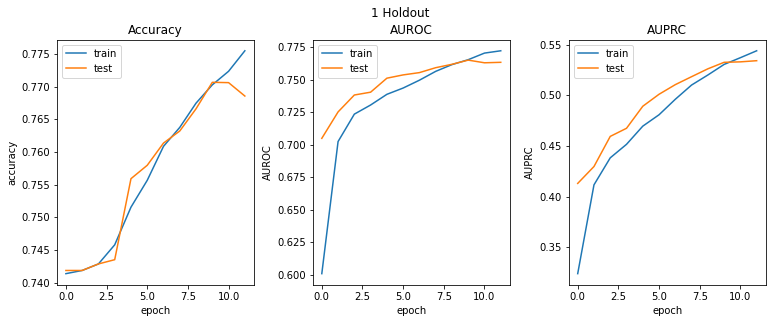

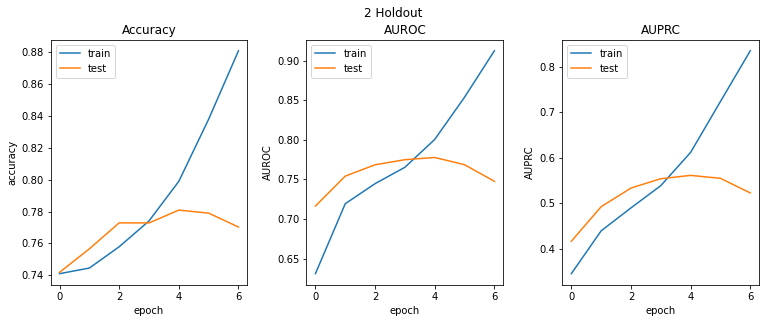

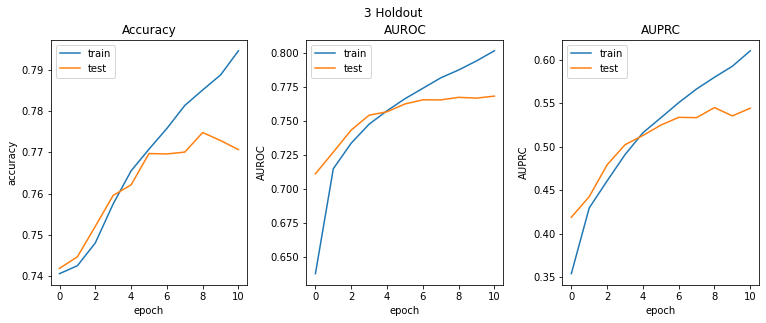

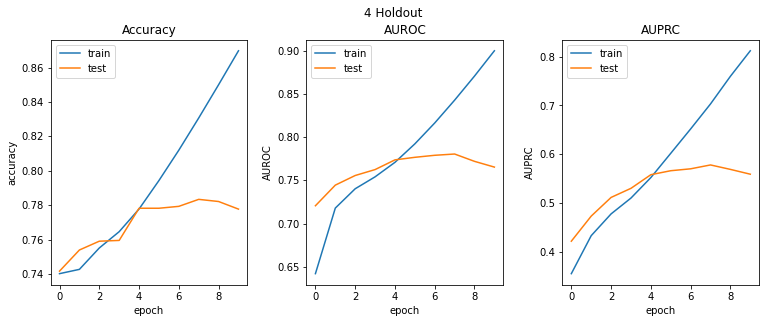

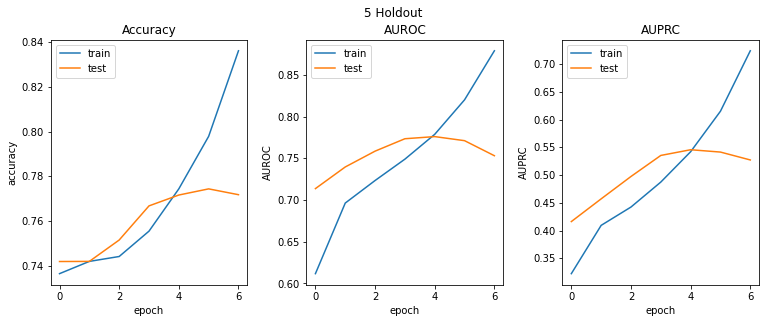

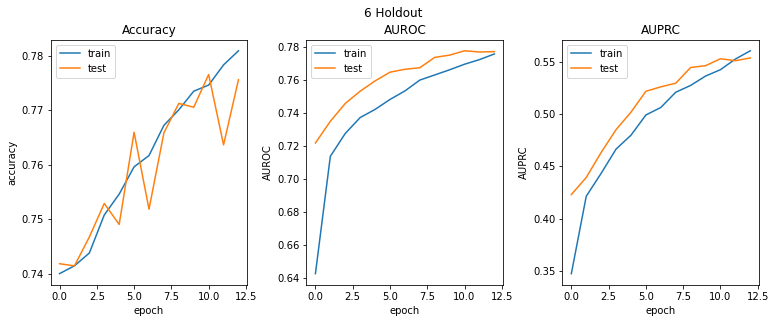

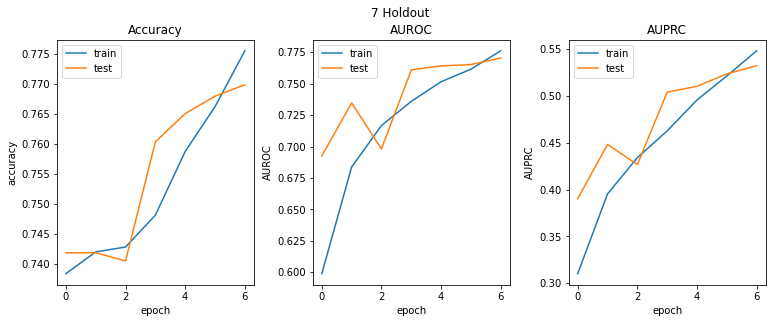

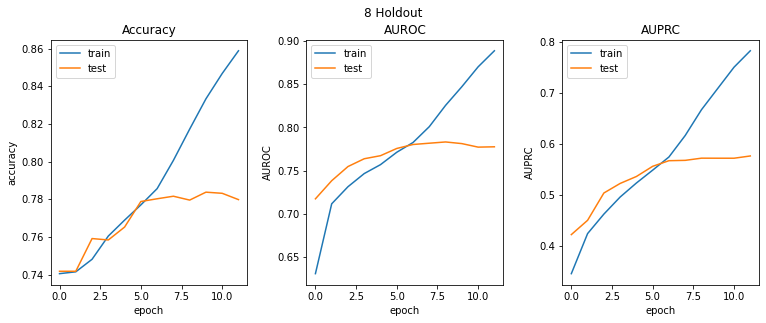

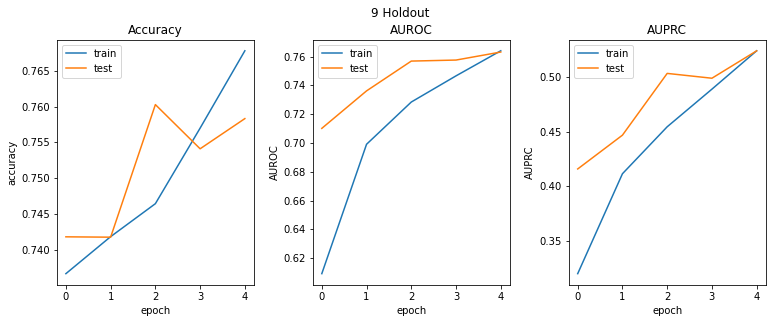

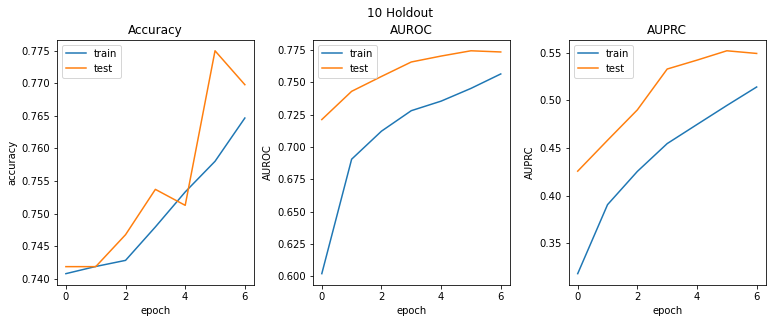

In [98]:
CNN_metrics_estimate = model_metrics_holdout_estimate_evaluation(CNN_metrics_promoters, number_of_splits)
print("-- PROMOTERS --")
print(f"CNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {CNN_metrics_estimate['accuracy_train']}  --  test - {CNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {CNN_metrics_estimate['AUROC_train']}  --  test - {CNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {CNN_metrics_estimate['AUPRC_train']}  --  test - {CNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("CNN - Train history:")
plot_train_history(CNN_history_promoters)

In [99]:
# Saving results
import json

# Saving metrics
file = open("results/CNN_metrics_promoters.txt", "w") 
string = repr(CNN_metrics_promoters)
file.write("CNN_metrics_promoters = " + string + "\n")
file.close()

# Saving history
with open("results/CNN_history_promoters.json", 'w') as h:
    for holdout in range(number_of_splits):
        json.dump(CNN_history_promoters[holdout].history, h)

#### Wilcoxon test [MLP_Promoters VS CNN_Promoters]

In [102]:
MLP_distinct_metrics_promoters = {}
MLP_distinct_metrics_promoters["accuracy_test"] = []
MLP_distinct_metrics_promoters["AUROC_test"] = []
MLP_distinct_metrics_promoters["AUPRC_test"] = []

CNN_distinct_metrics_promoters = {}
CNN_distinct_metrics_promoters["accuracy_test"] = []
CNN_distinct_metrics_promoters["AUROC_test"] = []
CNN_distinct_metrics_promoters["AUPRC_test"] = []

for holdout in MLP_metrics_promoters["boruta_False"]:
    MLP_distinct_metrics_promoters["accuracy_test"].append(holdout['accuracy_test'])
    MLP_distinct_metrics_promoters["AUROC_test"].append(holdout['AUROC_test'])
    MLP_distinct_metrics_promoters["AUPRC_test"].append(holdout['AUPRC_test'])

for holdout in CNN_metrics_promoters:
    CNN_distinct_metrics_promoters["accuracy_test"].append(holdout["test_evaluation"]['accuracy'])
    CNN_distinct_metrics_promoters["AUROC_test"].append(holdout["test_evaluation"]['AUROC'])
    CNN_distinct_metrics_promoters["AUPRC_test"].append(holdout["test_evaluation"]['AUPRC'])

print("Promoters - Wilcoxon test - MLP VS CNN")
print(f"-Accuracy: {wilcoxon(MLP_distinct_metrics_promoters['accuracy_test'], CNN_distinct_metrics_promoters['accuracy_test'])}")
print(f"-AUROC: {wilcoxon(MLP_distinct_metrics_promoters['AUROC_test'], CNN_distinct_metrics_promoters['AUROC_test'])}")
print(f"-AUPRC: {wilcoxon(MLP_distinct_metrics_promoters['AUPRC_test'], CNN_distinct_metrics_promoters['AUPRC_test'])}")

Promoters - Wilcoxon test - MLP VS CNN
-Accuracy: WilcoxonResult(statistic=0.0, pvalue=0.001953125)
-AUROC: WilcoxonResult(statistic=0.0, pvalue=0.001953125)
-AUPRC: WilcoxonResult(statistic=0.0, pvalue=0.001953125)


#### Enhancers

In [48]:
print("---- ENHANCERS ----")

CNN_metrics_enhancers = []
CNN_history_enhancers = []

for holdout_number, (train_indices, test_indices) in enumerate(holdouts_generator.split(bed_enhancers, enhancers_labels)):
    print(f"-- HOLDOUT {holdout_number+1} --")
    # Train/Test data
    x_train_enhancers, x_test_enhancers = bed_enhancers.iloc[train_indices], bed_enhancers.iloc[test_indices]
    y_train_enhancers, y_test_enhancers = enhancers_labels.iloc[train_indices], enhancers_labels.iloc[test_indices]

    ## Hyperparameter tuning
    # Generate holdouts
    for holdout_number_tuning, (train_indices_tuning, val_indices_tuning) in enumerate(holdouts_generator_tuning.split(x_train_enhancers, y_train_enhancers)):
        # Train/Validation data
        x_train_enhancers_tuning, x_val_enhancers_tuning = x_train_enhancers.iloc[train_indices_tuning], x_train_enhancers.iloc[val_indices_tuning]
        y_train_enhancers_tuning, y_val_enhancers_tuning = y_train_enhancers.iloc[train_indices_tuning], y_train_enhancers.iloc[val_indices_tuning]
        
        hp = kt.HyperParameters()

        best_hyperparameters = hyperparameter_tuning_CNN(
            x_train_enhancers_tuning,
            x_val_enhancers_tuning,
            y_train_enhancers_tuning.values,
            y_val_enhancers_tuning.values,
            build_CNN_hypermodel,
            name = "CNN_hypermodel_enhancers_" + str(holdout_number),
            directory='CNN_hypermodel_enhancers',
            max_trials = 15,
            epochs = 50,
            batch_size = 256
        )    
    
    #Build CNN with best set of hyperparameters
    CNN = build_CNN(best_hyperparameters)
    
    print("- Training model:\n")
    CNN_holdout_metrics, CNN_holdout_history = train_CNN(
        CNN,
        x_train_enhancers,
        x_test_enhancers,
        y_train_enhancers.values,
        y_test_enhancers.values,
        genome,
        epochs,
        batch_size
    )

    CNN_metrics_enhancers.append(CNN_holdout_metrics)
    CNN_history_enhancers.append(CNN_holdout_history)

Trial 15 Complete [00h 00m 49s]
multi_objective: -1.7022864073514938

Best multi_objective So Far: -1.7153688371181488
Total elapsed time: 00h 14m 05s
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'conv_depth': 3, 'filters_0': 96, 'kernel_size_0': 6, 'conv_dropout_0': 0.1, 'dense_depth': 1, 'units_0': 32, 'dense_dropout_0': 0.4, 'filters_1': 96, 'kernel_size_1': 12, 'conv_dropout_1': 0.2, 'filters_2': 88, 'kernel_size_2': 16, 'conv_dropout_2': 0.2, 'filters_3': 104, 'kernel_size_3': 8, 'conv_dropout_3': 0.0, 'units_1': 32, 'dense_dropout_1': 0.3, 'units_2': 96, 'dense_dropout_2': 0.4, 'units_3': 48, 'dense_dropout_3': 0.4, 'units_4': 48, 'dense_dropout_4': 0.4}
Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 256, 96)           2400      
                                                                 
 dropout (Dropout)    

In [53]:
CNN_metrics_enhancers

[{'train_evaluation': {'loss': 0.29501962661743164,
   'accuracy': 0.8865845203399658,
   'recall': 0.0,
   'precision': 0.0,
   'AUROC': 0.8374033570289612,
   'AUPRC': 0.3552652597427368,
   'f1_score': 0.0,
   'balanced_accuracy': 0.5,
   'specificity': 1.0,
   'miss_rate': 1.0,
   'fall_out': 0.0,
   'mcc': 0.0},
  'test_evaluation': {'loss': 0.34381547570228577,
   'accuracy': 0.8866239786148071,
   'recall': 0.0,
   'precision': 0.0,
   'AUROC': 0.6243546009063721,
   'AUPRC': 0.2190447896718979,
   'f1_score': 0.0,
   'balanced_accuracy': 0.5,
   'specificity': 1.0,
   'miss_rate': 1.0,
   'fall_out': 0.0,
   'mcc': 0.0}},
 {'train_evaluation': {'loss': 0.3482652008533478,
   'accuracy': 0.8865845203399658,
   'recall': 0.0,
   'precision': 0.0,
   'AUROC': 0.6315912008285522,
   'AUPRC': 0.21136806905269623,
   'f1_score': 0.0,
   'balanced_accuracy': 0.5,
   'specificity': 1.0,
   'miss_rate': 1.0,
   'fall_out': 0.0,
   'mcc': 0.0},
  'test_evaluation': {'loss': 0.34882986545

-- ENHANCERS --
CNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.8868017852306366  --  test - 0.8867424964904785
AUROC : train - 0.6695534765720368  --  test - 0.6263732314109802
AUPRC : train - 0.23628508895635605  --  test - 0.207713982462883
--------------------------------------------------------------------------------
CNN - Train history:


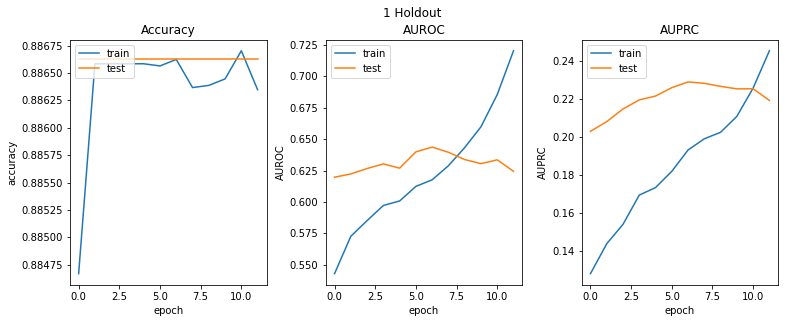

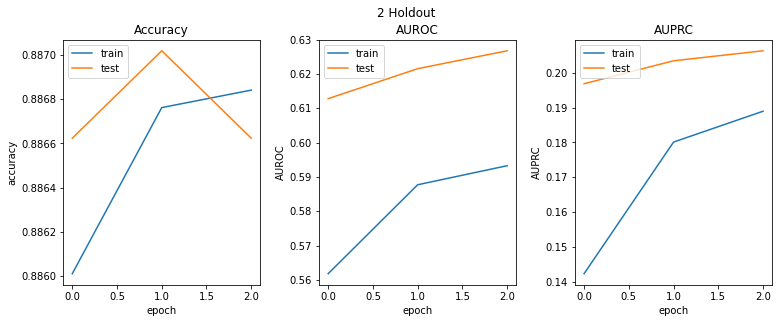

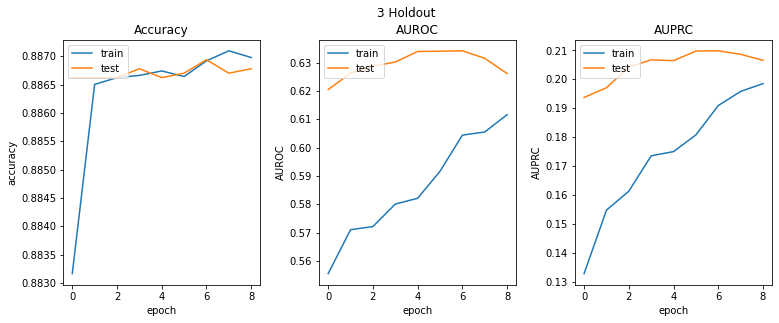

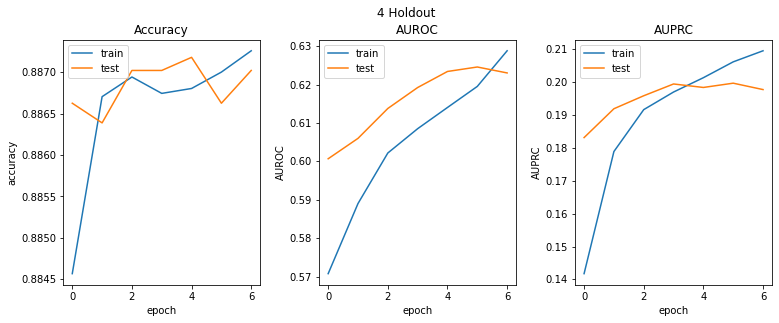

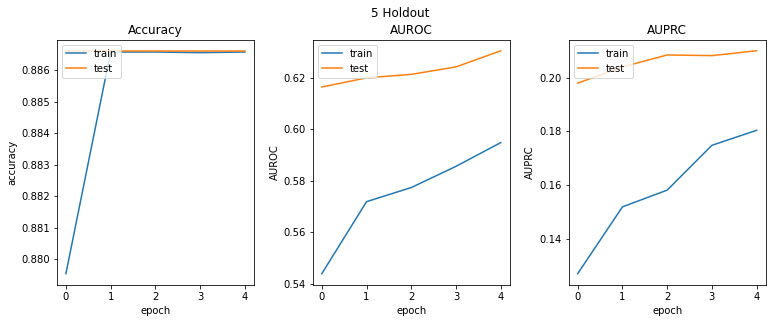

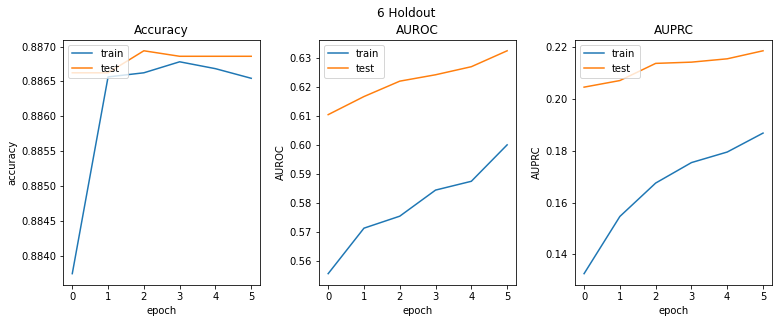

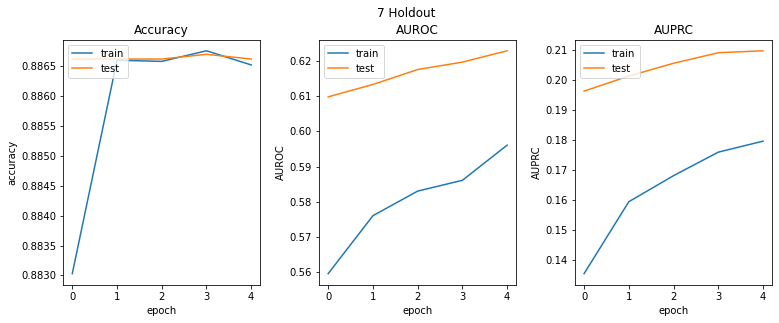

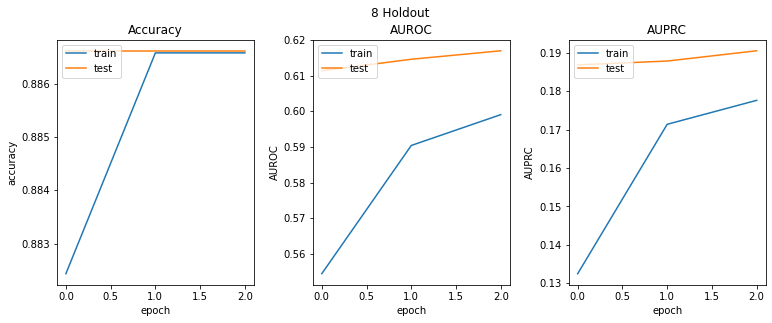

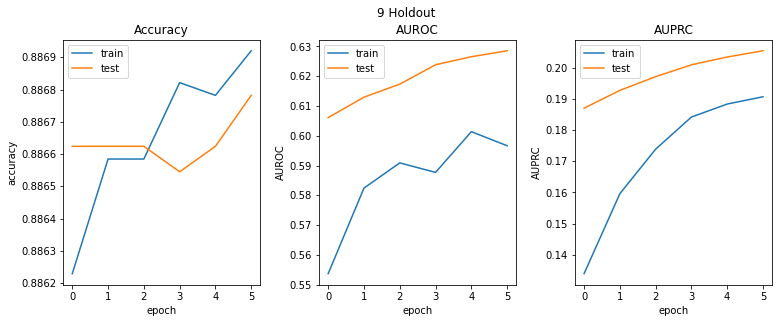

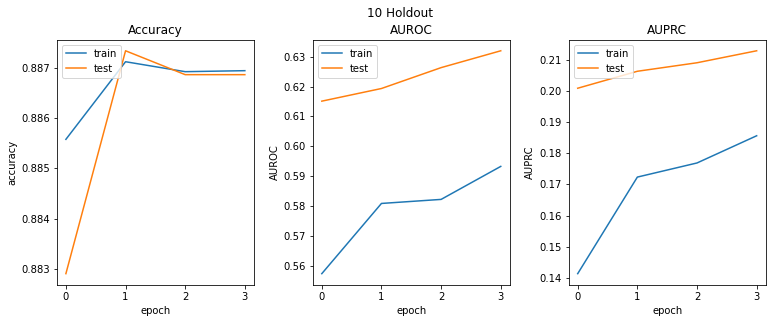

In [49]:
CNN_metrics_estimate = model_metrics_holdout_estimate_evaluation(CNN_metrics_enhancers, number_of_splits)
print("-- ENHANCERS --")
print(f"CNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {CNN_metrics_estimate['accuracy_train']}  --  test - {CNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {CNN_metrics_estimate['AUROC_train']}  --  test - {CNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {CNN_metrics_estimate['AUPRC_train']}  --  test - {CNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("CNN - Train history:")
plot_train_history(CNN_history_enhancers)

In [50]:
# Saving results
import json

# Saving metrics
file = open("results/CNN_metrics_enhancers.txt", "w") 
string = repr(CNN_metrics_enhancers)
file.write("CNN_metrics_enhancers = " + string + "\n")
file.close()

# Saving history
with open("results/CNN_history_enhancers.json", 'w') as h:
    for holdout in range(number_of_splits):
        json.dump(CNN_history_enhancers[holdout].history, h)

#### Wilcoxon test [MLP_Enhancers VS CNN_Enhancers]

In [58]:
MLP_distinct_metrics_enhancers = {}
MLP_distinct_metrics_enhancers["accuracy_test"] = []
MLP_distinct_metrics_enhancers["AUROC_test"] = []
MLP_distinct_metrics_enhancers["AUPRC_test"] = []

CNN_distinct_metrics_enhancers = {}
CNN_distinct_metrics_enhancers["accuracy_test"] = []
CNN_distinct_metrics_enhancers["AUROC_test"] = []
CNN_distinct_metrics_enhancers["AUPRC_test"] = []

for holdout in MLP_metrics_enhancers["boruta_False"]:
    MLP_distinct_metrics_enhancers["accuracy_test"].append(holdout['accuracy_test'])
    MLP_distinct_metrics_enhancers["AUROC_test"].append(holdout['AUROC_test'])
    MLP_distinct_metrics_enhancers["AUPRC_test"].append(holdout['AUPRC_test'])

for holdout in CNN_metrics_enhancers:
    CNN_distinct_metrics_enhancers["accuracy_test"].append(holdout["test_evaluation"]['accuracy'])
    CNN_distinct_metrics_enhancers["AUROC_test"].append(holdout["test_evaluation"]['AUROC'])
    CNN_distinct_metrics_enhancers["AUPRC_test"].append(holdout["test_evaluation"]['AUPRC'])

print("Enhancers - Wilcoxon test - MLP VS CNN")
print(f"-Accuracy: {wilcoxon(MLP_distinct_metrics_enhancers['accuracy_test'], CNN_distinct_metrics_enhancers['accuracy_test'])}")
print(f"-AUROC: {wilcoxon(MLP_distinct_metrics_enhancers['AUROC_test'], CNN_distinct_metrics_enhancers['AUROC_test'])}")
print(f"-AUPRC: {wilcoxon(MLP_distinct_metrics_enhancers['AUPRC_test'], CNN_distinct_metrics_enhancers['AUPRC_test'])}")

Enhancers - Wilcoxon test - MLP VS CNN
-Accuracy: WilcoxonResult(statistic=2.0, pvalue=0.005859375)
-AUROC: WilcoxonResult(statistic=0.0, pvalue=0.001953125)
-AUPRC: WilcoxonResult(statistic=0.0, pvalue=0.001953125)


### Multi modal neural network
A multi-modal neural network is a model capable of jointly represent and exploit the information of both data modalities (epigenomic data and genomic sequence data). To shape this network the layers of a FFNN and a CNN are concatenated, each receiving their specific input, the outputs are then combined into a final dense layer and output layer.

The MMNN is here composed in two different ways to inspect the possible impact on the performances:
* Define **fixed** FFNN and CNN, concatenate them and train as a whole the architecture.
* Define FFNN and CNN with **Bayesian optimization**-based hyperparameter tuning, concatenate them and train as a whole the architecture.

To have a statistically sound estimate of an architecture performance, multiple models are built and trained, each with the same architecture, over different portions of the data (holdouts) and, the average performance of those, is considered as an estimate of the overall performance of the architecture.

Here are the functions to build the optimized models, build the fixed models, and to build and train the MMNN.

#### CNN data sequence generation¶
The following step constructs the Mixed Sequence to train MMNNs with epigenomic data and DNA sequence data.

In [202]:
def get_mmnn_sequence(
    genome: Genome,
    bed: pd.DataFrame,
    x: np.ndarray,
    y: np.ndarray,
    batch_size: int = 256
) -> MixedSequence:
    """ Returns the genomic sequence data and epigenomic data for the MMNN training.
    
    Parameters
    -------------------------
    genome: Genome,
        The genome from where to extract the genomic sequence.
    bed: pd.DataFrame,
        The BED file coordinates describing where to extract the sequences.
    x: np.ndarray,
        The vector from where to extract the epigenomic data.
    y: np.ndarray,
        The values the model should predict.
    batch_size: int,
        The size of the batches to generate.
    
    Returns
    --------------------------
    MixedSequence: MixedSequence
        MixedSequence object to train a MMNN."""
    
    return MixedSequence(
        x={
            "sequence_data": BedSequence(
                genome,
                bed,
                batch_size=batch_size,
            ),
            "epigenomic_data": VectorSequence(
                x,
                batch_size
            )
        },
        y=VectorSequence(
            y,
            batch_size=batch_size
        )
    )

In [203]:
# Optimized MLP
def build_optimized_MLP(
    best_hyperparameters: dict,
    input_shape: tuple
) -> tuple[tf.keras.Model, layers.Layer, layers.Layer]:
    """ Returns the optimized MLP model for constructing the MMNN.
    
    Parameters
    ------------------------
    best_hyperparameters: dict
        The best set of hyperparameters for the model.
    input_shape: tuple
        The shape of the input.

    Returns
    ------------------------
    tuple: tuple[tf.keras.Model, layers.Layer, layers.Layer]:
        The optimized MLP model for the MMNN, the input and last hidden layers of the model."""
    
    print("- Building Optimized MLP:\n")
    input_epigenomic_data = layers.Input(shape=(input_shape[1]), name="epigenomic_data")

    hidden = layers.Dense(units = best_hyperparameters['units_0'], activation="relu")(input_epigenomic_data)
    hidden = layers.Dropout(best_hyperparameters['dropout_0'])(hidden)
    
    for i in range(best_hyperparameters['depth']-1):
        hidden = layers.Dense(units = best_hyperparameters['units_' + str(i+1)], activation="relu")(hidden)
        hidden = layers.Dropout(best_hyperparameters['dropout_' + str(i+1)])(hidden)

    last_hidden_MLP = hidden

    output_MLP = layers.Dense(1, activation="sigmoid")(last_hidden_MLP)

    MLP = tf.keras.Model(
        inputs = input_epigenomic_data,
        outputs = output_MLP
    )

    MLP.compile(
        optimizer="nadam",
        loss="binary_crossentropy",
        metrics=get_standard_binary_metrics()
    )

    MLP.summary()
    
    return MLP, input_epigenomic_data, last_hidden_MLP

In [204]:
# Fixed MLP
def build_fixed_MLP(
    input_shape: tuple
) -> tuple[tf.keras.Model, layers.Layer, layers.Layer]:
    """ Returns the fixed MLP model for constructing the MMNN.
    
    Parameters
    ------------------------
    input_shape: tuple
        The shape of the input.

    Returns
    ------------------------
    tuple: tuple[tf.keras.Model, layers.Layer, layers.Layer]:
        The fixed MLP model for the MMNN, the input and last hidden layers of the model."""

    print("- Building Fixed MLP:\n")
    input_epigenomic_data = layers.Input(shape=(input_shape[1]), name="epigenomic_data")

    hidden = layers.Dense(128, activation="relu")(input_epigenomic_data)
    hidden = layers.Dropout(0.5)(hidden)
    
    for _ in range(2):
        hidden = layers.Dense(64, activation="relu")(hidden)
        hidden = layers.Dropout(0.4)(hidden)

    last_hidden_MLP = hidden

    output_MLP = layers.Dense(1, activation="sigmoid")(last_hidden_MLP)

    MLP = tf.keras.Model(
        inputs = input_epigenomic_data,
        outputs = output_MLP
    )

    MLP.compile(
        optimizer="nadam",
        loss="binary_crossentropy",
        metrics=get_standard_binary_metrics()
    )

    MLP.summary()
    
    return MLP, input_epigenomic_data, last_hidden_MLP

In [205]:
# Optimized CNN
def build_optimized_CNN(
    best_hyperparameters: dict,
    window_size: int
) -> tuple[tf.keras.Model, layers.Layer, layers.Layer]:
    """ Returns the optimized CNN model for constructing the MMNN.
    
    Parameters
    ------------------------
    best_hyperparameters: dict
        The best set of hyperparameters for the model.
    window_size: int
        The size of the window.

    Returns
    ------------------------
    tuple: tuple[tf.keras.Model, layers.Layer, layers.Layer]:
        The optimized CNN model for the MMNN, the input and last hidden layers of the model."""

    print("- Building Optimized CNN:\n")
    input_sequence_data = layers.Input(shape=(window_size, 4), name="sequence_data")
    
    hidden = layers.Conv1D(
        filters = best_hyperparameters['filters_0'],
        kernel_size = best_hyperparameters['kernel_size_0'],
        padding = 'same',
        activation="relu"
    )(input_sequence_data)
    hidden = layers.Dropout(best_hyperparameters['conv_dropout_0'])(hidden)
    hidden = layers.MaxPooling1D(2)(hidden)
    
    for i in range(best_hyperparameters['conv_depth']-1):
        hidden = layers.Conv1D(
            filters = best_hyperparameters['filters_' + str(i+1)],
            kernel_size = best_hyperparameters['kernel_size_' + str(i+1)],
            padding='same',
            activation='relu'
        )(hidden)
        hidden = layers.Dropout(best_hyperparameters['conv_dropout_' + str(i+1)])(hidden)
        hidden = layers.MaxPooling1D(2)(hidden)
    
    hidden = layers.Flatten()(hidden)
    
    for i in range(best_hyperparameters['dense_depth']):
        hidden = layers.Dense(units = best_hyperparameters['units_' + str(i)], activation='relu')(hidden)
        hidden = layers.Dropout(best_hyperparameters['dense_dropout_' + str(i)])(hidden)
        
    last_hidden_CNN = hidden
        
    output_CNN = layers.Dense(1, activation="sigmoid")(last_hidden_CNN)

    CNN = tf.keras.Model(
        inputs = input_sequence_data,
        outputs = output_CNN
    )

    CNN.compile(
        optimizer="nadam",
        loss="binary_crossentropy",
        metrics=get_standard_binary_metrics()
    )

    CNN.summary()
    
    return CNN, input_sequence_data, last_hidden_CNN

In [206]:
# Fixed CNN
def build_fixed_CNN(
    window_size: int
) -> tuple[tf.keras.Model, layers.Layer, layers.Layer]:
    """ Returns the fixed CNN model for constructing the MMNN.
    
    Parameters
    ------------------------
    window_size: int
        The size of the window.

    Returns
    ------------------------
    tuple: tuple[tf.keras.Model, layers.Layer, layers.Layer]:
        The fixed CNN model for the MMNN, the input and last hidden layers of the model."""

    print("- Building Fixed CNN:\n")
    input_sequence_data = layers.Input(shape=(window_size, 4), name="sequence_data")

    hidden = layers.Conv1D(
        160,
        kernel_size=8,
        activation="linear",
        kernel_regularizer=tf.keras.regularizers.l1_l2(),
        activity_regularizer=tf.keras.regularizers.l1_l2()
    )(input_sequence_data) 
    
    hidden = layers.Dropout(0.2)(hidden)

    hidden = layers.Conv1D(
        64,
        kernel_size=8,
        padding="same",
        activation="relu",
        kernel_regularizer=tf.keras.regularizers.l1_l2(),
        activity_regularizer=tf.keras.regularizers.l1_l2()
    )(hidden)
    
    hidden = layers.Dropout(0.2)(hidden)
    hidden = layers.MaxPooling1D(2)(hidden)

    hidden = layers.Conv1D(
        32,
        kernel_size=8,
        padding="same",
        activation="relu",
        kernel_regularizer=tf.keras.regularizers.l1_l2(),
        activity_regularizer=tf.keras.regularizers.l1_l2()
    )(hidden)
    
    hidden = layers.Dropout(0.2)(hidden)
    hidden = layers.MaxPooling1D(2)(hidden)
    
    hidden = layers.Conv1D(
        16,
        kernel_size=6,
        padding="same",
        activation="relu",
        kernel_regularizer=tf.keras.regularizers.l1_l2(),
        activity_regularizer=tf.keras.regularizers.l1_l2()
    )(hidden)
    
    hidden = layers.Dropout(0.2)(hidden)
    hidden = layers.MaxPooling1D(2)(hidden)

    for _ in range(2):
        hidden = layers.Conv1D(8, kernel_size=6, padding="same", activation="relu")(hidden)
        hidden = layers.Dropout(0.2)(hidden)
        hidden = layers.MaxPooling1D(2)(hidden)

    hidden = layers.Flatten()(hidden)

    hidden = layers.Dense(128, activation="relu")(hidden)
    last_hidden_CNN = layers.Dropout(0.3)(hidden)

    output_CNN = layers.Dense(1, activation="sigmoid")(last_hidden_CNN)

    CNN = tf.keras.Model(
        inputs = input_sequence_data,
        outputs = output_CNN
    )

    CNN.compile(
        optimizer="nadam",
        loss="binary_crossentropy",
        metrics=get_standard_binary_metrics()
    )

    CNN.summary()
    
    return CNN, input_sequence_data, last_hidden_CNN

In [207]:
def build_MMNN(
    input_epigenomic_data: layers.Layer,
    input_sequence_data: layers.Layer,
    last_hidden_MLP: layers.Layer,
    last_hidden_CNN: layers.Layer
) -> tf.keras.Model:
    """ Returns the MMNN model obtained concatenating the MLP and the CNN.
    
    Parameters
    ------------------------
    input_epigenomic_data: layers.Layer
        The epigenomic data (MLP input).
    input_sequence_data: layers.Layer
        The sequence data (CNN input).
    last_hidden_MLP: layers.Layer
        The last hidden layer of the MLP model.
    last_hidden_CNN: layers.Layer
        The last hidden layer of the CNN model.

    Returns
    ------------------------
    MMNN: Model
        The MMNN model."""
    
    print("- Building MMNN:\n")
    concatenation_layer = layers.Concatenate()([
        last_hidden_MLP,
        last_hidden_CNN
    ])

    last_hidden_MMNN = layers.Dense(64, activation='relu')(concatenation_layer)
    output_MMNN = layers.Dense(1, activation='sigmoid')(last_hidden_MMNN)

    MMNN = tf.keras.Model(
        inputs = [input_epigenomic_data, input_sequence_data],
        outputs = output_MMNN
    )

    MMNN.compile(
        optimizer='nadam',
        loss='binary_crossentropy',
        metrics=get_standard_binary_metrics()
    )

    MMNN.summary()

    return MMNN

In [208]:
def train_MMNN(
    model: tf.keras.Model,
    bed_train: pd.DataFrame,
    bed_test: pd.DataFrame,
    x_train: np.ndarray,
    x_test: np.ndarray,
    y_train: np.ndarray,
    y_test: np.ndarray,
    genome: Genome,
    epochs: int,
    batch_size: int
):
    """ Train the MMNN model and return the performance metrics (accuracy, AUROC, AUPRC) for train and test 
    and the training history.
    
    Parameters
    ------------------------
    bed_train: pd.DataFrame
        The sequence data for training.
    bed_test: pd.DataFrame
        The sequence data for testing.
    x_train: np.ndarray
        The epigenomic input data for training.
    x_test: np.ndarray
        The epigenomic input data for testing.
    y_train: np.ndarray
        The labels of the input data for training.
    y_test: np.ndarray
        The labels of the input data for testing.
    genome: Genome,
        The genome from where to extract the genomic sequence.
    epochs: int
        The number of times the learning algorithm works through the dataset.
    batch_size: int
        The number of samples to work through before updating the model.

    Returns
    ------------------------
    MMNN: Model
        The performance metrics and history of the MMNN model."""
    
    train_sequence = get_mmnn_sequence(genome, bed_train, x_train, y_train, batch_size)
    test_sequence = get_mmnn_sequence(genome, bed_test, x_test, y_test, batch_size)

    MMNN_history = model.fit(
        train_sequence,
        validation_data = test_sequence,
        epochs = epochs,
        batch_size = batch_size,
        callbacks = [EarlyStopping("val_loss", patience=2)]
    )

    train_evaluation = model.evaluate(train_sequence, return_dict=True)
    test_evaluation = model.evaluate(test_sequence, return_dict=True)
    MMNN_metrics = {"train_evaluation": train_evaluation, "test_evaluation": test_evaluation}
    
    return MMNN_metrics, MMNN_history

#### Epigenomic data pre-processing
NaN imputation and robust scaling of epigenomic data.

In [125]:
n = 5
promoters_epigenomes = knn_imputation(promoters_epigenomes, n)
enhancers_epigenomes = knn_imputation(enhancers_epigenomes, n)

print(f"Promoters NaN values: {promoters_epigenomes.isna().values.sum()}")
print(f"Enhancers NaN values: {enhancers_epigenomes.isna().values.sum()}")

Promoters NaN values: 0
Enhancers NaN values: 0


In [126]:
promoters_epigenomes = robust_scaler(promoters_epigenomes)
enhancers_epigenomes = robust_scaler(enhancers_epigenomes)

#### MMNN data sequence generation
Wrapping together epigenomic and sequence data for the training and evaluation of the MMNN.

In [79]:
mixed_sequence_MMNN_promoters = get_mmnn_sequence(genome, bed_promoters, promoters_epigenomes.values, promoters_labels.values, batch_size)
mixed_sequence_MMNN_enhancers = get_mmnn_sequence(genome, bed_enhancers, enhancers_epigenomes.values, enhancers_labels.values, batch_size)

In [52]:
mixed_sequence_MMNN_promoters[0]

({'sequence_data': array([[[0., 0., 0., 1.],
          [0., 0., 1., 0.],
          [0., 0., 0., 1.],
          ...,
          [0., 1., 0., 0.],
          [0., 0., 1., 0.],
          [0., 1., 0., 0.]],
  
         [[1., 0., 0., 0.],
          [0., 1., 0., 0.],
          [0., 0., 1., 0.],
          ...,
          [0., 0., 1., 0.],
          [0., 0., 0., 1.],
          [1., 0., 0., 0.]],
  
         [[0., 0., 1., 0.],
          [0., 0., 0., 1.],
          [0., 0., 0., 1.],
          ...,
          [0., 1., 0., 0.],
          [0., 1., 0., 0.],
          [0., 0., 1., 0.]],
  
         ...,
  
         [[0., 1., 0., 0.],
          [0., 0., 1., 0.],
          [0., 1., 0., 0.],
          ...,
          [0., 1., 0., 0.],
          [0., 0., 0., 1.],
          [0., 0., 0., 1.]],
  
         [[0., 0., 1., 0.],
          [0., 0., 1., 0.],
          [0., 0., 1., 0.],
          ...,
          [0., 1., 0., 0.],
          [1., 0., 0., 0.],
          [0., 1., 0., 0.]],
  
         [[0., 0., 0., 1.],
   

### Main training loop - MMNN
* Tune hyperparameters with the **meta-model** based on **Bayesian optimization** using the training set (split into train and validation) for 1 holdout. The result is the best set of hyperparameters found using that specific training set for FFNN and CNN. The architecture is trained also **without** Bayesian optimization to inspect the possible impact on the performance.
* For epigenomic data, remove features uncorrelated with the output performing the **Pearson** and **Spearman** correlation tests, the **Mic** correlation test to confirm the choice, and remove features correlated with each other performing the **Pearson** correlation test.
* Build and train the MMNN model over the entire training set with the **optimized** FFNN and CNN and with the **fixed** FFNN and CNN, and test it over the test set.

In [127]:
epochs = 1000
batch_size = 256

#### Promoters

In [194]:
print("---- PROMOTERS ----")

MMNN_metrics_promoters = {}
MMNN_history_promoters = {}

MMNN_metrics_promoters["tuning_True"] = []
MMNN_metrics_promoters["tuning_False"] = []

MMNN_history_promoters["tuning_True"] = []
MMNN_history_promoters["tuning_False"] = []

for holdout_number, (train_indices, test_indices) in enumerate(holdouts_generator.split(bed_promoters, promoters_labels)):
    print(f"-- HOLDOUT {holdout_number+1} --")
    # Train/Test data
    x_train_promoters, x_test_promoters = promoters_epigenomes.iloc[train_indices], promoters_epigenomes.iloc[test_indices]
    x_train_promoters_bed, x_test_promoters_bed = bed_promoters.iloc[train_indices], bed_promoters.iloc[test_indices]
    y_train_promoters, y_test_promoters = promoters_labels.iloc[train_indices], promoters_labels.iloc[test_indices]

    correlation_test = False

    for use_tuning in (False, True):
        if use_tuning:
            ## Hyperparameter tuning
            # Generate holdouts
            for holdout_number_tuning, (train_indices_tuning, val_indices_tuning) in enumerate(holdouts_generator_tuning.split(x_train_promoters, y_train_promoters)):
                # Train/Validation data
                x_train_promoters_tuning, x_val_promoters_tuning = x_train_promoters.iloc[train_indices_tuning], x_train_promoters.iloc[val_indices_tuning]
                x_train_promoters_bed_tuning, x_val_promoters_bed_tuning = x_train_promoters_bed.iloc[train_indices_tuning], x_train_promoters_bed.iloc[val_indices_tuning]
                y_train_promoters_tuning, y_val_promoters_tuning = y_train_promoters.iloc[train_indices_tuning], y_train_promoters.iloc[val_indices_tuning]

                hp = kt.HyperParameters()

                best_hyperparameters_MLP = hyperparameter_tuning(
                    x_train_promoters_tuning.values,
                    x_val_promoters_tuning.values,
                    y_train_promoters_tuning.values,
                    y_val_promoters_tuning.values,
                    build_MLP_hypermodel,
                    name = "MLP_hypermodel_promoters_" + str(holdout_number),
                    directory='MLP_hypermodel_promoters',
                    max_trials = 8,
                    epochs = 50,
                    batch_size = 256
                )  

                best_hyperparameters_CNN = hyperparameter_tuning_CNN(
                    x_train_promoters_bed_tuning,
                    x_val_promoters_bed_tuning,
                    y_train_promoters_tuning.values,
                    y_val_promoters_tuning.values,
                    build_CNN_hypermodel,
                    name = "CNN_hypermodel_promoters_" + str(holdout_number),
                    directory='CNN_hypermodel_promoters',
                    max_trials = 15,
                    epochs = 50,
                    batch_size = 256
                )
                
        if not correlation_test:
            useless_features = []
            ## Remove uncorrelated features with the output (epigenomic data)
            uncorrelated_features = uncorrelated_features_test(x_train_promoters, y_train_promoters)
            for feature in (x_train_promoters.columns):
                if feature in (uncorrelated_features):
                    x_train_promoters_subset = x_train_promoters.drop(columns=feature)
                    x_test_promoters_subset = x_test_promoters.drop(columns=feature)
                    useless_features.append(feature)

            ## Remove correlated features with eachother (epigenomic data)
            correlated_features = correlated_features_test(x_train_promoters_subset)
            for feature in (x_train_promoters_subset.columns):
                if feature in (correlated_features):
                    x_train_promoters_subset = x_train_promoters_subset.drop(columns=feature)
                    x_test_promoters_subset = x_test_promoters_subset.drop(columns=feature)
                    useless_features.append(feature)

        if correlation_test:
            # Correlation tests already executed, removing useless features found
            print(f"- Removing uncorrelated/correlated features: {useless_features}\n")
            for feature in (x_train_promoters.columns):
                if feature in (useless_features):
                    x_train_promoters_subset = x_train_promoters.drop(columns=feature)
                    x_test_promoters_subset = x_test_promoters.drop(columns=feature)

        correlation_test = True

        if not use_tuning:
            # Build Fixed MLP, CNN
            MLP, input_epigenomic_data, last_hidden_MLP = build_fixed_MLP(x_train_promoters_subset.shape)
            CNN, input_sequence_data, last_hidden_CNN = build_fixed_CNN(window_size)

        if use_tuning:
            # Build MLP, CNN with best set of hyperparameters
            MLP, input_epigenomic_data, last_hidden_MLP = build_optimized_MLP(best_hyperparameters_MLP, x_train_promoters_subset.shape)
            CNN, input_sequence_data, last_hidden_CNN = build_optimized_CNN(best_hyperparameters_CNN, window_size)
        
        # Build MMNN
        MMNN = build_MMNN(
            input_epigenomic_data,
            input_sequence_data,
            last_hidden_MLP,
            last_hidden_CNN
        )

        print("- Training MMNN model:\n")
        MMNN_holdout_metrics, MMNN_holdout_history = train_MMNN(
            MMNN,
            x_train_promoters_bed,
            x_test_promoters_bed,
            x_train_promoters_subset.values,
            x_test_promoters_subset.values,
            y_train_promoters.values,
            y_test_promoters.values,
            genome,
            epochs,
            batch_size
        )
        
        MMNN_metrics_promoters["tuning_" + str(use_tuning)].append(MMNN_holdout_metrics)
        MMNN_history_promoters["tuning_" + str(use_tuning)].append(MMNN_holdout_history)

---- PROMOTERS ----
-- HOLDOUT 1 --
-- 2 Uncorrelated features: [Pearson+Spearman]
['ZNF207', 'ZNF737']
-- Actually uncorrelated features: [confirmed via MIC]
['ZNF207', 'ZNF737']
-- 1 Correlated features: [Pearson]
['SAP130']
- Building Fixed MLP:

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 epigenomic_data (InputLayer  [(None, 560)]            0         
 )                                                               
                                                                 
 dense (Dense)               (None, 128)               71808     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_

                                                                                                  
 dropout_7 (Dropout)            (None, 31, 8)        0           ['conv1d_4[0][0]']               
                                                                                                  
 epigenomic_data (InputLayer)   [(None, 560)]        0           []                               
                                                                                                  
 max_pooling1d_3 (MaxPooling1D)  (None, 15, 8)       0           ['dropout_7[0][0]']              
                                                                                                  
 dense (Dense)                  (None, 128)          71808       ['epigenomic_data[0][0]']        
                                                                                                  
 conv1d_5 (Conv1D)              (None, 15, 8)        392         ['max_pooling1d_3[0][0]']        
          

313/313 [==============================] - 16s 50ms/step - loss: 0.9740 - accuracy: 0.8614 - recall: 0.7817 - precision: 0.7103 - AUROC: 0.9230 - AUPRC: 0.7557 - f1_score: 0.7443 - balanced_accuracy: 0.8354 - specificity: 0.8891 - miss_rate: 0.2183 - fall_out: 0.1109 - mcc: 0.6509 - val_loss: 0.9748 - val_accuracy: 0.8500 - val_recall: 0.7409 - val_precision: 0.6970 - val_AUROC: 0.9128 - val_AUPRC: 0.7443 - val_f1_score: 0.7183 - val_balanced_accuracy: 0.8144 - val_specificity: 0.8879 - val_miss_rate: 0.2591 - val_fall_out: 0.1121 - val_mcc: 0.6167
Epoch 23/1000
79/79 [==============================] - 4s 43ms/step - loss: 0.9798 - accuracy: 0.8497 - recall: 0.7727 - precision: 0.6853 - AUROC: 0.9128 - AUPRC: 0.7442 - f1_score: 0.7264 - balanced_accuracy: 0.8246 - specificity: 0.8765 - miss_rate: 0.2273 - fall_out: 0.1235 - mcc: 0.6255
INFO:tensorflow:Reloading Oracle from existing project MLP_hypermodel_promoters\MLP_hypermodel_promoters_0\oracle.json
Model: "MLP_Hypermodel"
_________

                                                                 
 dropout_7 (Dropout)         (None, 32, 8)             0         
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 16, 8)            0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 16, 8)             392       
                                                                 
 dropout_8 (Dropout)         (None, 16, 8)             0         
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 8, 8)             0         
 1D)                                                             
                                                                 
 conv1d_6 (Conv1D)           (None, 8, 8)              392       
                                                                 
 dropout_9

__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000
313/313 [==============================] - 14s 39ms/step - loss: 0.3787 - accuracy: 0.8184 - recall: 0.6447 - precision: 0.6493 - AUROC: 0.8768 - AUPRC: 0.6514 - f1_score: 0.6470 - balanced_accuracy: 0.7618 - specificity: 0.8788 - miss_rate: 0.3553 - fall_out: 0.1212 - mcc: 0.5247 - val_loss: 0.3409 - val_accuracy: 0.8387 - val_recall: 0.7875 - val_precision: 0.6563 - val_AUROC: 0.9004 - val_AUPRC: 0.7075 - val_f1_score: 0.7159 - val_balanced_accuracy: 0.8220 - val_specificity: 0.8565 - val_miss_rate: 0.2125 - val_fall_out: 0.1435 - val_mcc: 0.6094
Epoch 2/1000
313/313 [==============================] - 13s 41ms/step - loss: 0.3438 - accuracy: 0.8365 - recall: 0.7257 - precision: 0.6690 - AUROC: 0.8973 - AUPRC: 0.6902 - f1_score: 0.6962 - balanced_accuracy: 0.8004 - specificity: 0.8751 - miss_rate: 0.2743 - fall_out: 0.1249 - mcc: 0.5855 - val_loss: 0.

_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence_data (InputLayer)     [(None, 256, 4)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 249, 160)     5280        ['sequence_data[0][0]']          
                                                                                                  
 dropout_3 (Dropout)            (None, 249, 160)     0           ['conv1d[0][0]']                 
                                                                                                  
 conv1d_1 (Conv1D)              (None, 249, 64)      81984       ['dropout_3[0][0]']              
        

 )                                                               
                                                                 
 flatten (Flatten)           (None, 1024)              0         
                                                                 
 dense_2 (Dense)             (None, 16)                16400     
                                                                 
 dropout_2 (Dropout)         (None, 16)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 17        
                                                                 
Total params: 16,617
Trainable params: 16,617
Non-trainable params: 0
_________________________________________________________________
INFO:tensorflow:Reloading Tuner from CNN_hypermodel_promoters\CNN_hypermodel_promoters_1\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'conv_depth': 6, 'filters_

                                                                                                  
 max_pooling1d_2 (MaxPooling1D)  (None, 64, 160)     0           ['dropout_5[0][0]']              
                                                                                                  
 conv1d_3 (Conv1D)              (None, 64, 8)        10248       ['max_pooling1d_2[0][0]']        
                                                                                                  
 dropout_6 (Dropout)            (None, 64, 8)        0           ['conv1d_3[0][0]']               
                                                                                                  
 max_pooling1d_3 (MaxPooling1D)  (None, 32, 8)       0           ['dropout_6[0][0]']              
                                                                                                  
 conv1d_4 (Conv1D)              (None, 32, 160)      20640       ['max_pooling1d_3[0][0]']        
          

_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence_data (InputLayer)     [(None, 256, 4)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 249, 160)     5280        ['sequence_data[0][0]']          
                                                                                                  
 dropout_3 (Dropout)            (None, 249, 160)     0           ['conv1d[0][0]']                 
                                                                                                  
 conv1d_1 (Conv1D)              (None, 249, 64)      81984       ['dropout_3[0][0]']              
        

- Building Optimized MLP:

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 epigenomic_data (InputLayer  [(None, 561)]            0         
 )                                                               
                                                                 
 dense_4 (Dense)             (None, 136)               76432     
                                                                 
 dropout_3 (Dropout)         (None, 136)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 137       
                                                                 
Total params: 76,569
Trainable params: 76,569
Non-trainable params: 0
_________________________________________________________________
- Building Optimized CNN:

Model: "model_1"
____________________________________________________

 dropout_4 (Dropout)         (None, 249, 64)           0         
                                                                 
 max_pooling1d (MaxPooling1D  (None, 124, 64)          0         
 )                                                               
                                                                 
 conv1d_2 (Conv1D)           (None, 124, 32)           16416     
                                                                 
 dropout_5 (Dropout)         (None, 124, 32)           0         
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 62, 32)           0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 62, 16)            3088      
                                                                 
 dropout_6 (Dropout)         (None, 62, 16)            0         
          

                                                                                                  
 dropout_2 (Dropout)            (None, 64)           0           ['dense_2[0][0]']                
                                                                                                  
 dropout_9 (Dropout)            (None, 128)          0           ['dense_4[0][0]']                
                                                                                                  
 concatenate (Concatenate)      (None, 192)          0           ['dropout_2[0][0]',              
                                                                  'dropout_9[0][0]']              
                                                                                                  
 dense_6 (Dense)                (None, 64)           12352       ['concatenate[0][0]']            
                                                                                                  
 dense_7 (

Epoch 13/1000
79/79 [==============================] - 4s 47ms/step - loss: 1.1669 - accuracy: 0.8519 - recall: 0.7553 - precision: 0.6967 - AUROC: 0.9151 - AUPRC: 0.7393 - f1_score: 0.7248 - balanced_accuracy: 0.8204 - specificity: 0.8856 - miss_rate: 0.2447 - fall_out: 0.1144 - mcc: 0.6247
INFO:tensorflow:Reloading Oracle from existing project MLP_hypermodel_promoters\MLP_hypermodel_promoters_3\oracle.json
Model: "MLP_Hypermodel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 4504      
                                                                 
 dropout (Dropout)           (None, 8)                 0         
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4,513
Trainable params

                                                                 
 max_pooling1d_5 (MaxPooling  (None, 8, 32)            0         
 1D)                                                             
                                                                 
 conv1d_6 (Conv1D)           (None, 8, 112)            28784     
                                                                 
 dropout_9 (Dropout)         (None, 8, 112)            0         
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 4, 112)           0         
 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 448)               0         
                                                                 
 dense_6 (Dense)             (None, 128)               57472     
                                                                 
 dropout_1

Epoch 2/1000
313/313 [==============================] - 14s 44ms/step - loss: 0.3519 - accuracy: 0.8332 - recall: 0.7278 - precision: 0.6607 - AUROC: 0.8925 - AUPRC: 0.6842 - f1_score: 0.6926 - balanced_accuracy: 0.7989 - specificity: 0.8699 - miss_rate: 0.2722 - fall_out: 0.1301 - mcc: 0.5798 - val_loss: 0.3374 - val_accuracy: 0.8441 - val_recall: 0.7737 - val_precision: 0.6721 - val_AUROC: 0.9066 - val_AUPRC: 0.7146 - val_f1_score: 0.7193 - val_balanced_accuracy: 0.8212 - val_specificity: 0.8686 - val_miss_rate: 0.2263 - val_fall_out: 0.1314 - val_mcc: 0.6151
Epoch 3/1000
313/313 [==============================] - 14s 44ms/step - loss: 0.3411 - accuracy: 0.8384 - recall: 0.7370 - precision: 0.6699 - AUROC: 0.8987 - AUPRC: 0.6991 - f1_score: 0.7019 - balanced_accuracy: 0.8053 - specificity: 0.8737 - miss_rate: 0.2630 - fall_out: 0.1263 - mcc: 0.5926 - val_loss: 0.3291 - val_accuracy: 0.8459 - val_recall: 0.7545 - val_precision: 0.6823 - val_AUROC: 0.9090 - val_AUPRC: 0.7185 - val_f1_s

 dropout_4 (Dropout)         (None, 249, 64)           0         
                                                                 
 max_pooling1d (MaxPooling1D  (None, 124, 64)          0         
 )                                                               
                                                                 
 conv1d_2 (Conv1D)           (None, 124, 32)           16416     
                                                                 
 dropout_5 (Dropout)         (None, 124, 32)           0         
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 62, 32)           0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 62, 16)            3088      
                                                                 
 dropout_6 (Dropout)         (None, 62, 16)            0         
          

                                                                                                  
 dropout_2 (Dropout)            (None, 64)           0           ['dense_2[0][0]']                
                                                                                                  
 dropout_9 (Dropout)            (None, 128)          0           ['dense_4[0][0]']                
                                                                                                  
 concatenate (Concatenate)      (None, 192)          0           ['dropout_2[0][0]',              
                                                                  'dropout_9[0][0]']              
                                                                                                  
 dense_6 (Dense)                (None, 64)           12352       ['concatenate[0][0]']            
                                                                                                  
 dense_7 (

                                                                 
 dropout_10 (Dropout)        (None, 16)                0         
                                                                 
 dense_7 (Dense)             (None, 1)                 17        
                                                                 
Total params: 838,937
Trainable params: 838,937
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence_data (InputLayer)     [(None, 256, 4)]     0           []                               
                                                                                                  
 conv1d_1 (Conv1D)              (None, 256, 160)     10400       ['sequence_data[0][0]']          
  

 dense_4 (Dense)             (None, 128)               7296      
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 115,361
Trainable params: 115,361
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence_data (InputLayer)     [(None, 256, 4)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (No

 dense (Dense)               (None, 8)                 4504      
                                                                 
 dropout (Dropout)           (None, 8)                 0         
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4,513
Trainable params: 4,513
Non-trainable params: 0
_________________________________________________________________
INFO:tensorflow:Reloading Tuner from MLP_hypermodel_promoters\MLP_hypermodel_promoters_5\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'depth': 1, 'units_0': 136, 'dropout_0': 0.5, 'units_1': 40, 'dropout_1': 0.5, 'units_2': 40, 'dropout_2': 0.3}
INFO:tensorflow:Reloading Oracle from existing project CNN_hypermodel_promoters\CNN_hypermodel_promoters_5\oracle.json
Model: "CNN_Hypermodel"
_____________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence_data (InputLayer)     [(None, 256, 4)]     0           []                               
                                                                                                  
 conv1d_1 (Conv1D)              (None, 256, 160)     4000        ['sequence_data[0][0]']          
                                                                                                  
 dropout_4 (Dropout)            (None, 256, 160)     0           ['conv1d_1[0][0]']               
                                                                                                  
 max_pooling1d_1 (MaxPooling1D)  (None, 128, 160)    0           ['dropout_4[0][0]']              
                                                                                                  
 conv1d_2 (Conv1D)              (None, 128, 8)       20488       ['max_pooling1d_1[0][0]']        
          

Epoch 5/1000
313/313 [==============================] - 13s 41ms/step - loss: 0.3261 - accuracy: 0.8459 - recall: 0.7523 - precision: 0.6829 - AUROC: 0.9081 - AUPRC: 0.7204 - f1_score: 0.7159 - balanced_accuracy: 0.8154 - specificity: 0.8785 - miss_rate: 0.2477 - fall_out: 0.1215 - mcc: 0.6119 - val_loss: 0.3251 - val_accuracy: 0.8494 - val_recall: 0.7776 - val_precision: 0.6829 - val_AUROC: 0.9106 - val_AUPRC: 0.7349 - val_f1_score: 0.7272 - val_balanced_accuracy: 0.8260 - val_specificity: 0.8744 - val_miss_rate: 0.2224 - val_fall_out: 0.1256 - val_mcc: 0.6263
Epoch 6/1000
313/313 [==============================] - 13s 40ms/step - loss: 0.3215 - accuracy: 0.8495 - recall: 0.7596 - precision: 0.6891 - AUROC: 0.9112 - AUPRC: 0.7317 - f1_score: 0.7226 - balanced_accuracy: 0.8202 - specificity: 0.8808 - miss_rate: 0.2404 - fall_out: 0.1192 - mcc: 0.6210 - val_loss: 0.3231 - val_accuracy: 0.8479 - val_recall: 0.7553 - val_precision: 0.6867 - val_AUROC: 0.9119 - val_AUPRC: 0.7390 - val_f1_s

 dropout_5 (Dropout)            (None, 124, 32)      0           ['conv1d_2[0][0]']               
                                                                                                  
 max_pooling1d_1 (MaxPooling1D)  (None, 62, 32)      0           ['dropout_5[0][0]']              
                                                                                                  
 conv1d_3 (Conv1D)              (None, 62, 16)       3088        ['max_pooling1d_1[0][0]']        
                                                                                                  
 dropout_6 (Dropout)            (None, 62, 16)       0           ['conv1d_3[0][0]']               
                                                                                                  
 max_pooling1d_2 (MaxPooling1D)  (None, 31, 16)      0           ['dropout_6[0][0]']              
                                                                                                  
 conv1d_4 

 )                                                               
                                                                 
 flatten (Flatten)           (None, 1024)              0         
                                                                 
 dense_2 (Dense)             (None, 16)                16400     
                                                                 
 dropout_2 (Dropout)         (None, 16)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 17        
                                                                 
Total params: 16,617
Trainable params: 16,617
Non-trainable params: 0
_________________________________________________________________
INFO:tensorflow:Reloading Tuner from CNN_hypermodel_promoters\CNN_hypermodel_promoters_6\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'conv_depth': 4, 'filters_

 conv1d_3 (Conv1D)              (None, 64, 72)       13896       ['max_pooling1d_2[0][0]']        
                                                                                                  
 dropout_6 (Dropout)            (None, 64, 72)       0           ['conv1d_3[0][0]']               
                                                                                                  
 max_pooling1d_3 (MaxPooling1D)  (None, 32, 72)      0           ['dropout_6[0][0]']              
                                                                                                  
 conv1d_4 (Conv1D)              (None, 32, 8)        3464        ['max_pooling1d_3[0][0]']        
                                                                                                  
 dropout_7 (Dropout)            (None, 32, 8)        0           ['conv1d_4[0][0]']               
                                                                                                  
 max_pooli

 dense_4 (Dense)             (None, 128)               7296      
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 115,361
Trainable params: 115,361
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence_data (InputLayer)     [(None, 256, 4)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (No

Total params: 16,617
Trainable params: 16,617
Non-trainable params: 0
_________________________________________________________________
INFO:tensorflow:Reloading Tuner from CNN_hypermodel_promoters\CNN_hypermodel_promoters_7\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'conv_depth': 6, 'filters_0': 160, 'kernel_size_0': 8, 'conv_dropout_0': 0.2, 'dense_depth': 1, 'units_0': 16, 'dense_dropout_0': 0.3, 'filters_1': 160, 'kernel_size_1': 16, 'conv_dropout_1': 0.2, 'filters_2': 8, 'kernel_size_2': 16, 'conv_dropout_2': 0.0, 'filters_3': 8, 'kernel_size_3': 6, 'conv_dropout_3': 0.2, 'filters_4': 8, 'kernel_size_4': 6, 'conv_dropout_4': 0.2, 'units_1': 16, 'dense_dropout_1': 0.3, 'units_2': 64, 'dense_dropout_2': 0.3, 'units_3': 16, 'dense_dropout_3': 0.3, 'filters_5': 96, 'kernel_size_5': 6, 'conv_dropout_5': 0.0}
- Removing uncorrelated/correlated features: ['ZNF207', 'ZNF737', 'SAP130']

- Building Optimized MLP:

Model: "model"
_______________

 max_pooling1d_2 (MaxPooling1D)  (None, 64, 160)     0           ['dropout_8[0][0]']              
                                                                                                  
 conv1d_3 (Conv1D)              (None, 64, 8)        20488       ['max_pooling1d_2[0][0]']        
                                                                                                  
 dropout_9 (Dropout)            (None, 64, 8)        0           ['conv1d_3[0][0]']               
                                                                                                  
 max_pooling1d_3 (MaxPooling1D)  (None, 32, 8)       0           ['dropout_9[0][0]']              
                                                                                                  
 conv1d_4 (Conv1D)              (None, 32, 8)        392         ['max_pooling1d_3[0][0]']        
                                                                                                  
 dropout_1

79/79 [==============================] - 5s 55ms/step - loss: 0.3555 - accuracy: 0.8427 - recall: 0.8007 - precision: 0.6614 - AUROC: 0.9051 - AUPRC: 0.7107 - f1_score: 0.7244 - balanced_accuracy: 0.8290 - specificity: 0.8574 - miss_rate: 0.1993 - fall_out: 0.1426 - mcc: 0.6212
-- HOLDOUT 9 --
-- 2 Uncorrelated features: [Pearson+Spearman]
['ZNF207', 'ZNF737']
-- Actually uncorrelated features: [confirmed via MIC]
['ZNF207', 'ZNF737']
-- 1 Correlated features: [Pearson]
['SAP130']
- Building Fixed MLP:

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 epigenomic_data (InputLayer  [(None, 560)]            0         
 )                                                               
                                                                 
 dense (Dense)               (None, 128)               71808     
                                                                 
 dropout (Drop

                                                                                                  
 dropout_6 (Dropout)            (None, 62, 16)       0           ['conv1d_3[0][0]']               
                                                                                                  
 max_pooling1d_2 (MaxPooling1D)  (None, 31, 16)      0           ['dropout_6[0][0]']              
                                                                                                  
 conv1d_4 (Conv1D)              (None, 31, 8)        776         ['max_pooling1d_2[0][0]']        
                                                                                                  
 dropout_7 (Dropout)            (None, 31, 8)        0           ['conv1d_4[0][0]']               
                                                                                                  
 epigenomic_data (InputLayer)   [(None, 560)]        0           []                               
          

                                                                 
 dropout_7 (Dropout)         (None, 32, 8)             0         
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 16, 8)            0         
 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 128)               16512     
                                                                 
 dropout_8 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 32)                4128      
                                                                 
 dropout_9 (Dropout)         (None, 32)                0         
          

313/313 [==============================] - 13s 41ms/step - loss: 0.2749 - accuracy: 0.8767 - recall: 0.7640 - precision: 0.7597 - AUROC: 0.9376 - AUPRC: 0.8265 - f1_score: 0.7618 - balanced_accuracy: 0.8399 - specificity: 0.9159 - miss_rate: 0.2360 - fall_out: 0.0841 - mcc: 0.6787 - val_loss: 0.3148 - val_accuracy: 0.8547 - val_recall: 0.6942 - val_precision: 0.7299 - val_AUROC: 0.9168 - val_AUPRC: 0.7634 - val_f1_score: 0.7116 - val_balanced_accuracy: 0.8024 - val_specificity: 0.9106 - val_miss_rate: 0.3058 - val_fall_out: 0.0894 - val_mcc: 0.6149
Epoch 17/1000
313/313 [==============================] - 13s 41ms/step - loss: 0.2681 - accuracy: 0.8789 - recall: 0.7565 - precision: 0.7703 - AUROC: 0.9408 - AUPRC: 0.8391 - f1_score: 0.7633 - balanced_accuracy: 0.8390 - specificity: 0.9215 - miss_rate: 0.2435 - fall_out: 0.0785 - mcc: 0.6820 - val_loss: 0.3174 - val_accuracy: 0.8539 - val_recall: 0.7301 - val_precision: 0.7116 - val_AUROC: 0.9157 - val_AUPRC: 0.7595 - val_f1_score: 0.7207

 conv1d (Conv1D)                (None, 249, 160)     5280        ['sequence_data[0][0]']          
                                                                                                  
 dropout_3 (Dropout)            (None, 249, 160)     0           ['conv1d[0][0]']                 
                                                                                                  
 conv1d_1 (Conv1D)              (None, 249, 64)      81984       ['dropout_3[0][0]']              
                                                                                                  
 dropout_4 (Dropout)            (None, 249, 64)      0           ['conv1d_1[0][0]']               
                                                                                                  
 max_pooling1d (MaxPooling1D)   (None, 124, 64)      0           ['dropout_4[0][0]']              
                                                                                                  
 conv1d_2 

                                                                 
Total params: 16,617
Trainable params: 16,617
Non-trainable params: 0
_________________________________________________________________
INFO:tensorflow:Reloading Tuner from CNN_hypermodel_promoters\CNN_hypermodel_promoters_9\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'conv_depth': 3, 'filters_0': 144, 'kernel_size_0': 6, 'conv_dropout_0': 0.0, 'dense_depth': 1, 'units_0': 16, 'dense_dropout_0': 0.5, 'filters_1': 32, 'kernel_size_1': 8, 'conv_dropout_1': 0.2, 'filters_2': 104, 'kernel_size_2': 8, 'conv_dropout_2': 0.2, 'units_1': 16, 'dense_dropout_1': 0.5, 'units_2': 16, 'dense_dropout_2': 0.3, 'units_3': 16, 'dense_dropout_3': 0.3}
- Removing uncorrelated/correlated features: ['ZNF207', 'ZNF737', 'SAP130']

- Building Optimized MLP:

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #

 dense_8 (Dense)                (None, 64)           9792        ['concatenate[0][0]']            
                                                                                                  
 dense_9 (Dense)                (None, 1)            65          ['dense_8[0][0]']                
                                                                                                  
Total params: 206,777
Trainable params: 206,777
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000
313/313 [==============================] - 21s 52ms/step - loss: 0.3747 - accuracy: 0.8224 - recall: 0.6694 - precision: 0.6519 - AUROC: 0.8802 - AUPRC: 0.6608 - f1_score: 0.6606 - balanced_accuracy: 0.7725 - specificity: 0.8756 - miss_rate: 0.3306 - fall_out: 0.1244 - mcc: 0.5404 - val_loss: 0.3358 - val_accuracy: 0.8419 - val_recall: 0.7568 - val_precision: 0.6721 - val_AUROC: 0.9033 - val_A

-- PROMTOTERS -- with FIXED MLP and CNN
MMNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.8591259539127349  --  test - 0.8498673617839814
AUROC : train - 0.9226655066013336  --  test - 0.9122659921646118
AUPRC : train - 0.757349681854248  --  test - 0.7347532510757446
--------------------------------------------------------------------------------
MMNN - Train history:


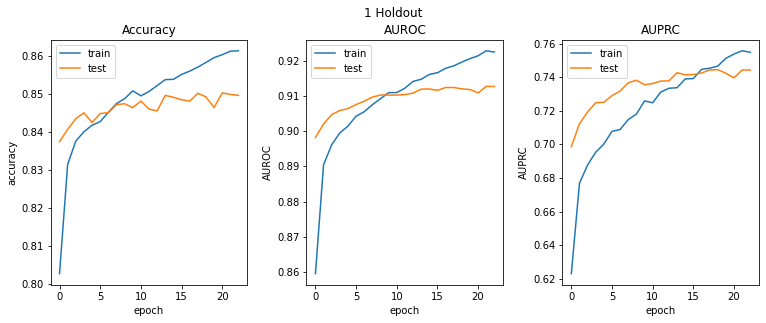

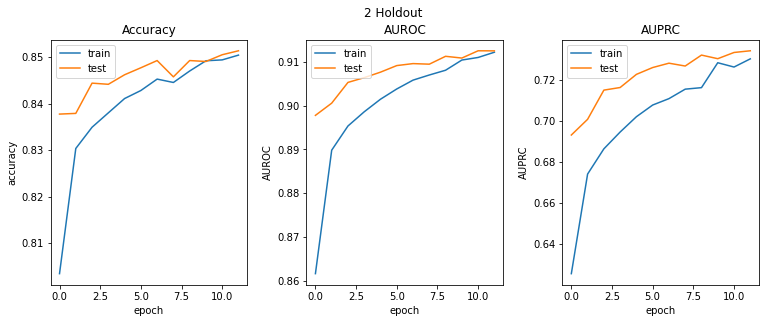

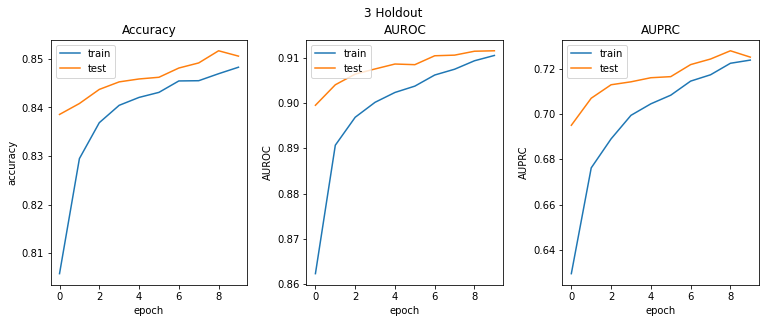

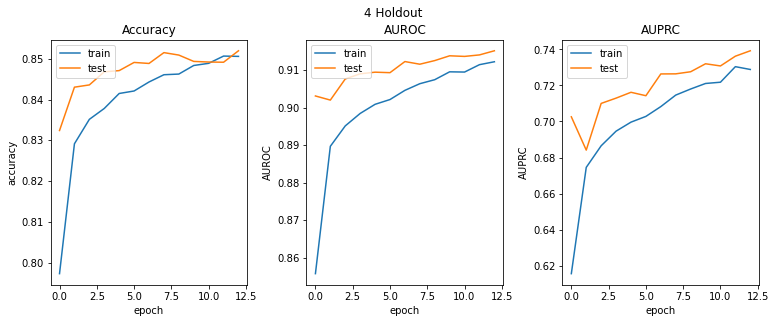

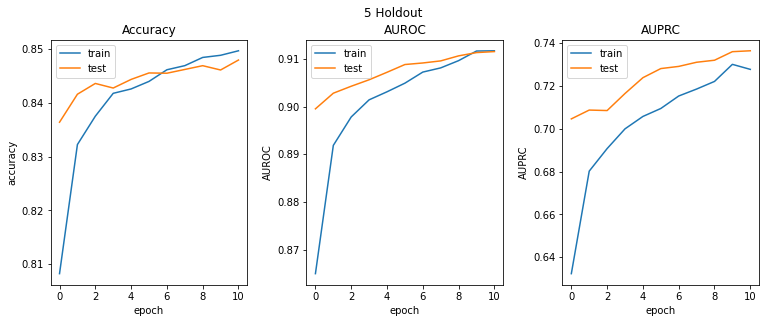

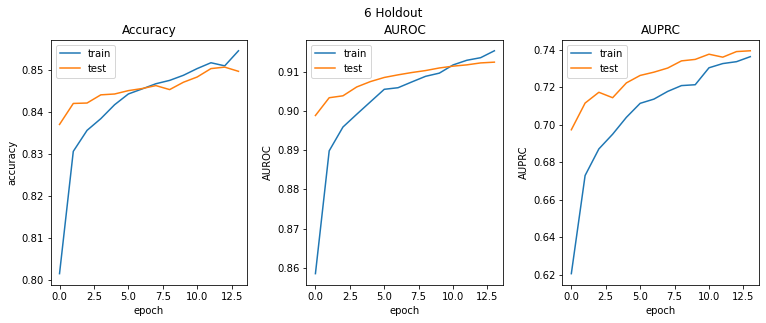

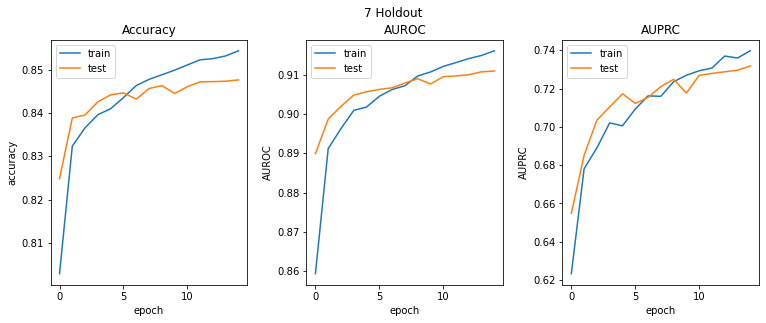

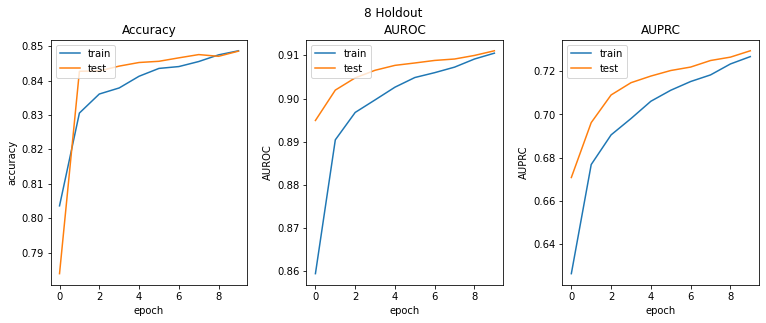

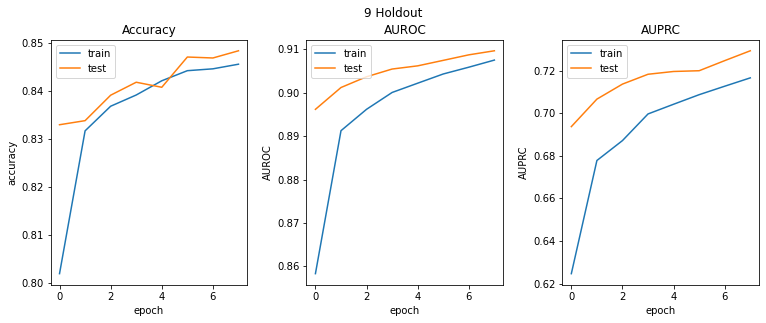

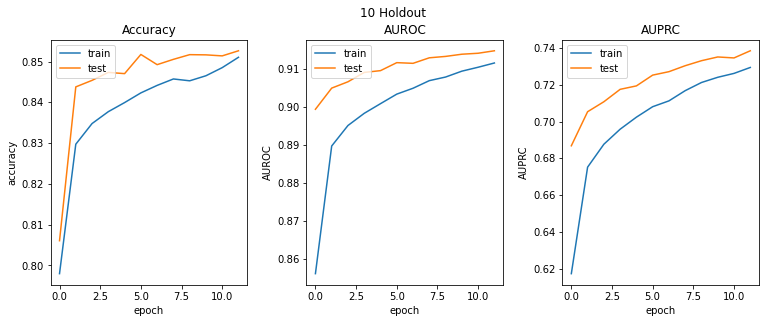

----------------------------------------------------------------------------------------------------
-- PROMTOTERS -- with bayesian optimized hyperparameters MLP and CNN
MMNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.8814577519893646  --  test - 0.8502327740192414
AUROC : train - 0.9431495547294617  --  test - 0.9146451532840729
AUPRC : train - 0.8385738432407379  --  test - 0.7485358357429505
--------------------------------------------------------------------------------
MMNN - Train history:


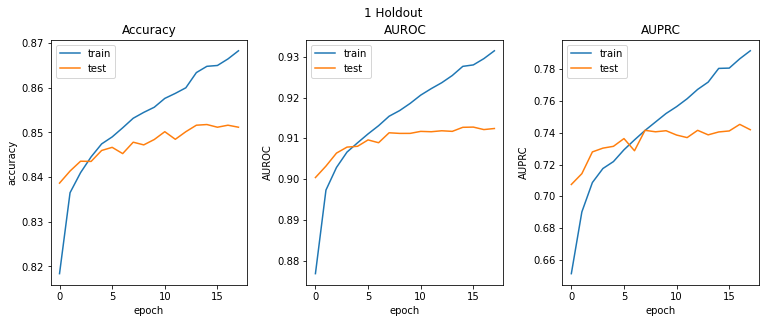

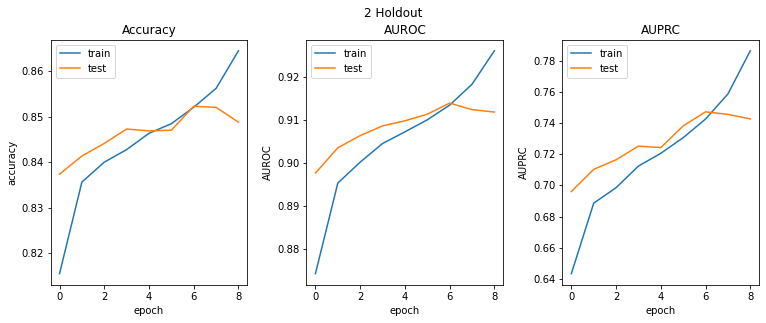

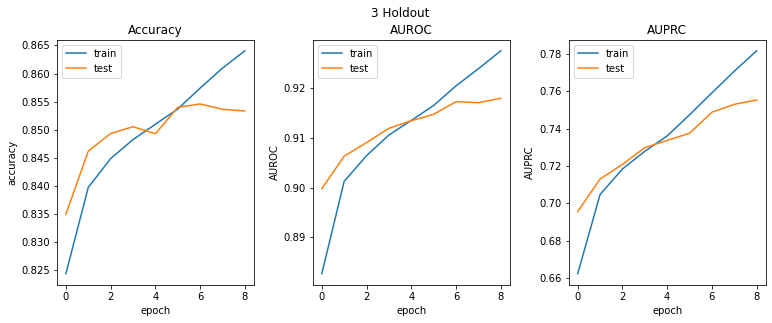

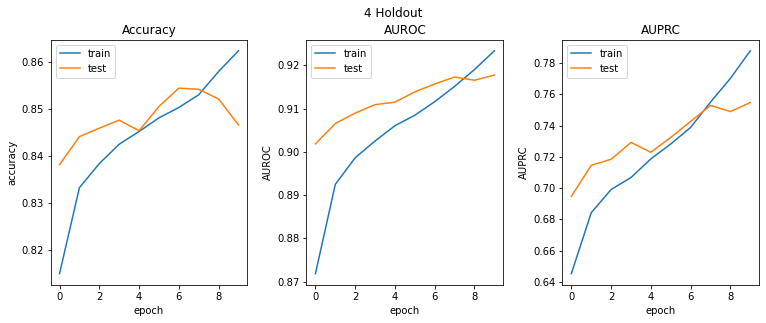

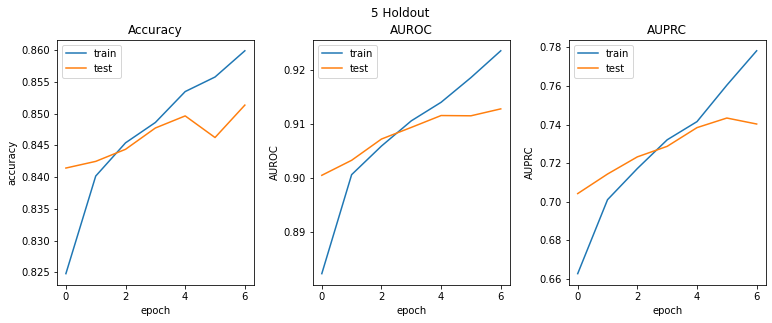

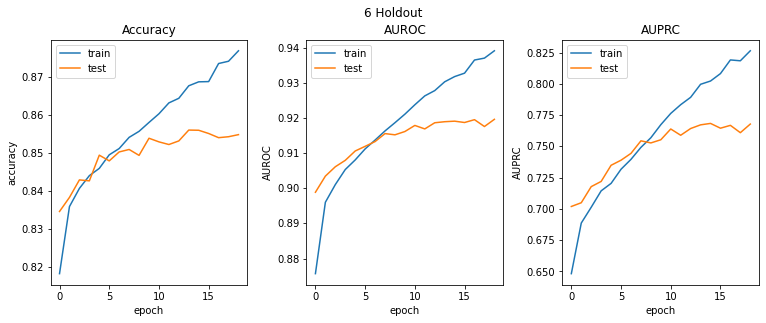

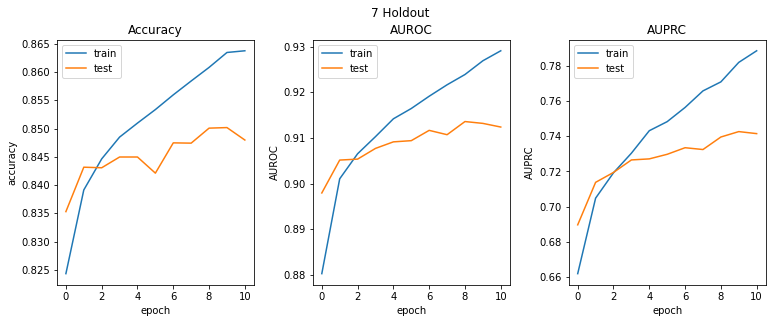

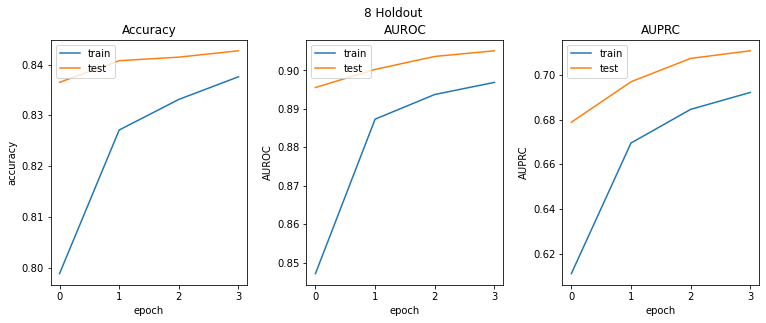

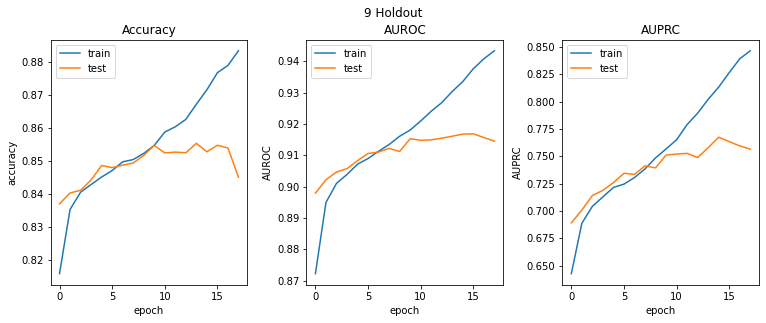

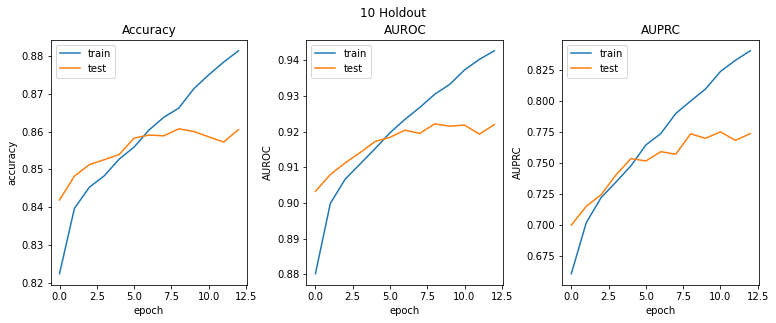

In [195]:
MMNN_metrics_estimate = model_metrics_holdout_estimate_evaluation(MMNN_metrics_promoters["tuning_False"], number_of_splits)
print("-- PROMOTERS -- with FIXED MLP and CNN")
print(f"MMNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MMNN_metrics_estimate['accuracy_train']}  --  test - {MMNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MMNN_metrics_estimate['AUROC_train']}  --  test - {MMNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MMNN_metrics_estimate['AUPRC_train']}  --  test - {MMNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MMNN - Train history:")
plot_train_history(MMNN_history_promoters["tuning_False"])

print("-"*100)

MMNN_metrics_estimate = model_metrics_holdout_estimate_evaluation(MMNN_metrics_promoters["tuning_True"], number_of_splits)
print("-- PROMOTERS -- with bayesian optimized hyperparameters MLP and CNN")
print(f"MMNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MMNN_metrics_estimate['accuracy_train']}  --  test - {MMNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MMNN_metrics_estimate['AUROC_train']}  --  test - {MMNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MMNN_metrics_estimate['AUPRC_train']}  --  test - {MMNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MMNN - Train history:")
plot_train_history(MMNN_history_promoters["tuning_True"])

In [196]:
MMNN_metrics_promoters

{'tuning_True': [{'train_evaluation': {'loss': 0.26318269968032837,
    'accuracy': 0.8808194994926453,
    'recall': 0.81207275390625,
    'precision': 0.7478567361831665,
    'AUROC': 0.9440953135490417,
    'AUPRC': 0.8309550881385803,
    'f1_score': 0.778643012046814,
    'balanced_accuracy': 0.8584057092666626,
    'specificity': 0.9047386050224304,
    'miss_rate': 0.1879272758960724,
    'fall_out': 0.09526138752698898,
    'mcc': 0.6983979344367981},
   'test_evaluation': {'loss': 0.32070329785346985,
    'accuracy': 0.8511788845062256,
    'recall': 0.7537328004837036,
    'precision': 0.695348858833313,
    'AUROC': 0.9124017953872681,
    'AUPRC': 0.7418513894081116,
    'f1_score': 0.7233646512031555,
    'balanced_accuracy': 0.8194102644920349,
    'specificity': 0.8850877285003662,
    'miss_rate': 0.24626721441745758,
    'fall_out': 0.11491227895021439,
    'mcc': 0.6227453947067261}},
  {'train_evaluation': {'loss': 0.2676412761211395,
    'accuracy': 0.88558769226074

In [197]:
# Saving results
import json

# Saving metrics
file = open("results/MMNN_metrics_promoters.txt", "w") 
string = repr(MMNN_metrics_promoters)
file.write("MMNN_metrics_promoters = " + string + "\n")
file.close()

# Saving history
for tuning in ("tuning_True", "tuning_False"):
    with open("results/MMNN_history_promoters_" + tuning + ".json", 'w') as h:
        for holdout in range(number_of_splits):
            json.dump(MMNN_history_promoters[tuning][holdout].history, h)

In [198]:
MMNN_metrics_promoters

{'tuning_True': [{'train_evaluation': {'loss': 0.26318269968032837,
    'accuracy': 0.8808194994926453,
    'recall': 0.81207275390625,
    'precision': 0.7478567361831665,
    'AUROC': 0.9440953135490417,
    'AUPRC': 0.8309550881385803,
    'f1_score': 0.778643012046814,
    'balanced_accuracy': 0.8584057092666626,
    'specificity': 0.9047386050224304,
    'miss_rate': 0.1879272758960724,
    'fall_out': 0.09526138752698898,
    'mcc': 0.6983979344367981},
   'test_evaluation': {'loss': 0.32070329785346985,
    'accuracy': 0.8511788845062256,
    'recall': 0.7537328004837036,
    'precision': 0.695348858833313,
    'AUROC': 0.9124017953872681,
    'AUPRC': 0.7418513894081116,
    'f1_score': 0.7233646512031555,
    'balanced_accuracy': 0.8194102644920349,
    'specificity': 0.8850877285003662,
    'miss_rate': 0.24626721441745758,
    'fall_out': 0.11491227895021439,
    'mcc': 0.6227453947067261}},
  {'train_evaluation': {'loss': 0.2676412761211395,
    'accuracy': 0.88558769226074

#### Wilcoxon test [MMNN_Promoters_Bayesian_Tuning VS MMNN_Promoters_No_Bayesian_Tuning]

In [199]:
MMNN_distinct_metrics_promoters = {}
MMNN_distinct_metrics_promoters["tuning_True"] = {}
MMNN_distinct_metrics_promoters["tuning_False"] = {}

for tuning in ("tuning_True", "tuning_False"):
    MMNN_distinct_metrics_promoters[tuning]["accuracy_test"] = []
    MMNN_distinct_metrics_promoters[tuning]["AUROC_test"] = []
    MMNN_distinct_metrics_promoters[tuning]["AUPRC_test"] = []
    for holdout in MMNN_metrics_promoters[tuning]:
        MMNN_distinct_metrics_promoters[tuning]["accuracy_test"].append(holdout["test_evaluation"]["accuracy"])
        MMNN_distinct_metrics_promoters[tuning]["AUROC_test"].append(holdout["test_evaluation"]["AUROC"])
        MMNN_distinct_metrics_promoters[tuning]["AUPRC_test"].append(holdout["test_evaluation"]["AUPRC"])

print("MMNN - Promoters - Wilcoxon test - fixed MLP and CNN performances VS optimized MLP and CNN performances")
print(f"-Accuracy: {wilcoxon(MMNN_distinct_metrics_promoters['tuning_True']['accuracy_test'], MMNN_distinct_metrics_promoters['tuning_False']['accuracy_test'])}")
print(f"-AUROC: {wilcoxon(MMNN_distinct_metrics_promoters['tuning_True']['AUROC_test'], MMNN_distinct_metrics_promoters['tuning_False']['AUROC_test'])}")
print(f"-AUPRC: {wilcoxon(MMNN_distinct_metrics_promoters['tuning_True']['AUPRC_test'], MMNN_distinct_metrics_promoters['tuning_False']['AUPRC_test'])}")

MMNN - Promoters - Wilcoxon test - fixed MLP and CNN performances VS optimized MLP and CNN performances
-Accuracy: WilcoxonResult(statistic=25.5, pvalue=0.921875)
-AUROC: WilcoxonResult(statistic=10.0, pvalue=0.083984375)
-AUPRC: WilcoxonResult(statistic=7.0, pvalue=0.037109375)


#### Enhancers

In [200]:
print("---- ENHANCERS ----")

MMNN_metrics_enhancers = {}
MMNN_history_enhancers = {}

MMNN_metrics_enhancers["tuning_True"] = []
MMNN_metrics_enhancers["tuning_False"] = []

MMNN_history_enhancers["tuning_True"] = []
MMNN_history_enhancers["tuning_False"] = []

for holdout_number, (train_indices, test_indices) in enumerate(holdouts_generator.split(bed_enhancers, enhancers_labels)):
    print(f"-- HOLDOUT {holdout_number+1} --")
    # Train/Test data
    x_train_enhancers, x_test_enhancers = enhancers_epigenomes.iloc[train_indices], enhancers_epigenomes.iloc[test_indices]
    x_train_enhancers_bed, x_test_enhancers_bed = bed_enhancers.iloc[train_indices], bed_enhancers.iloc[test_indices]
    y_train_enhancers, y_test_enhancers = enhancers_labels.iloc[train_indices], enhancers_labels.iloc[test_indices]

    correlation_test = False
    
    for use_tuning in (False, True):
        if use_tuning:
            ## Hyperparameter tuning
            # Generate holdouts
            for holdout_number_tuning, (train_indices_tuning, val_indices_tuning) in enumerate(holdouts_generator_tuning.split(x_train_enhancers, y_train_enhancers)):
                # Train/Validation data
                x_train_enhancers_tuning, x_val_enhancers_tuning = x_train_enhancers.iloc[train_indices_tuning], x_train_enhancers.iloc[val_indices_tuning]
                x_train_enhancers_bed_tuning, x_val_enhancers_bed_tuning = x_train_enhancers_bed.iloc[train_indices_tuning], x_train_enhancers_bed.iloc[val_indices_tuning]
                y_train_enhancers_tuning, y_val_enhancers_tuning = y_train_enhancers.iloc[train_indices_tuning], y_train_enhancers.iloc[val_indices_tuning]

                hp = kt.HyperParameters()

                best_hyperparameters_MLP = hyperparameter_tuning(
                    x_train_enhancers_tuning.values,
                    x_val_enhancers_tuning.values,
                    y_train_enhancers_tuning.values,
                    y_val_enhancers_tuning.values,
                    build_MLP_hypermodel,
                    name = "MLP_hypermodel_enhancers_" + str(holdout_number),
                    directory='MLP_hypermodel_enhancers',
                    max_trials = 8,
                    epochs = 50,
                    batch_size = 256
                )  

                best_hyperparameters_CNN = hyperparameter_tuning_CNN(
                    x_train_enhancers_bed_tuning,
                    x_val_enhancers_bed_tuning,
                    y_train_enhancers_tuning.values,
                    y_val_enhancers_tuning.values,
                    build_CNN_hypermodel,
                    name = "CNN_hypermodel_enhancers_" + str(holdout_number),
                    directory='CNN_hypermodel_enhancers',
                    max_trials = 15,
                    epochs = 50,
                    batch_size = 256
                )

        if not correlation_test:
            useless_features = []
            ## Remove uncorrelated features with the output (epigenomic data)
            uncorrelated_features = uncorrelated_features_test(x_train_enhancers, y_train_enhancers)
            for feature in (x_train_enhancers.columns):
                if feature in (uncorrelated_features):
                    x_train_enhancers_subset = x_train_enhancers.drop(columns=feature)
                    x_test_enhancers_subset = x_test_enhancers.drop(columns=feature)
                    useless_features.append(feature)

            ## Remove correlated features with eachother (epigenomic data)
            correlated_features = correlated_features_test(x_train_enhancers_subset)
            for feature in (x_train_enhancers_subset.columns):
                if feature in (correlated_features):
                    x_train_enhancers_subset = x_train_enhancers_subset.drop(columns=feature)
                    x_test_enhancers_subset = x_test_enhancers_subset.drop(columns=feature)
                    useless_features.append(feature)

        if correlation_test:
            # Correlation tests already executed, removing useless features found
            print(f"- Removing uncorrelated/correlated features: {useless_features}\n")
            for feature in (x_train_enhancers.columns):
                if feature in (useless_features):
                    x_train_enhancers_subset = x_train_enhancers.drop(columns=feature)
                    x_test_enhancers_subset = x_test_enhancers.drop(columns=feature)

        correlation_test = True

        if not use_tuning:
            # Build Fixed MLP, CNN
            MLP, input_epigenomic_data, last_hidden_MLP = build_fixed_MLP(x_train_enhancers_subset.shape)
            CNN, input_sequence_data, last_hidden_CNN = build_fixed_CNN(window_size)

        if use_tuning:
            # Build MLP, CNN with best set of hyperparameters
            MLP, input_epigenomic_data, last_hidden_MLP = build_optimized_MLP(best_hyperparameters_MLP, x_train_enhancers_subset.shape)
            CNN, input_sequence_data, last_hidden_CNN = build_optimized_CNN(best_hyperparameters_CNN, window_size)
        
        # Build MMNN
        MMNN = build_MMNN(
            input_epigenomic_data,
            input_sequence_data,
            last_hidden_MLP,
            last_hidden_CNN
        )

        print("- Training MMNN model:\n")
        MMNN_holdout_metrics, MMNN_holdout_history = train_MMNN(
            MMNN,
            x_train_enhancers_bed,
            x_test_enhancers_bed,
            x_train_enhancers_subset.values,
            x_test_enhancers_subset.values,
            y_train_enhancers.values,
            y_test_enhancers.values,
            genome,
            epochs,
            batch_size
        )
        
        MMNN_metrics_enhancers["tuning_" + str(use_tuning)].append(MMNN_holdout_metrics)
        MMNN_history_enhancers["tuning_" + str(use_tuning)].append(MMNN_holdout_history)

---- ENHANCERS ----
-- HOLDOUT 1 --
-- 2 Uncorrelated features: [Pearson+Spearman]
['SNRNP70', 'ZNF282']
-- Actually uncorrelated features: [confirmed via MIC]
['SNRNP70', 'ZNF282']
-- 0 Correlated features: [Pearson]
[]
- Building Fixed MLP:

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 epigenomic_data (InputLayer  [(None, 561)]            0         
 )                                                               
                                                                 
 dense (Dense)               (None, 128)               71936     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dro

                                                                                                  
 dropout_7 (Dropout)            (None, 31, 8)        0           ['conv1d_4[0][0]']               
                                                                                                  
 epigenomic_data (InputLayer)   [(None, 561)]        0           []                               
                                                                                                  
 max_pooling1d_3 (MaxPooling1D)  (None, 15, 8)       0           ['dropout_7[0][0]']              
                                                                                                  
 dense (Dense)                  (None, 128)          71936       ['epigenomic_data[0][0]']        
                                                                                                  
 conv1d_5 (Conv1D)              (None, 15, 8)        392         ['max_pooling1d_3[0][0]']        
          

198/198 [==============================] - 13s 60ms/step - loss: 1.0478 - accuracy: 0.9178 - recall: 0.4357 - precision: 0.7305 - AUROC: 0.9050 - AUPRC: 0.6672 - f1_score: 0.5459 - balanced_accuracy: 0.7076 - specificity: 0.9794 - miss_rate: 0.5643 - fall_out: 0.0206 - mcc: 0.5242 - val_loss: 1.1215 - val_accuracy: 0.9177 - val_recall: 0.3693 - val_precision: 0.7946 - val_AUROC: 0.8475 - val_AUPRC: 0.5977 - val_f1_score: 0.5043 - val_balanced_accuracy: 0.6786 - val_specificity: 0.9878 - val_miss_rate: 0.6307 - val_fall_out: 0.0122 - val_mcc: 0.5068
Epoch 23/1000
198/198 [==============================] - 13s 60ms/step - loss: 1.0266 - accuracy: 0.9192 - recall: 0.4617 - precision: 0.7261 - AUROC: 0.9101 - AUPRC: 0.6788 - f1_score: 0.5645 - balanced_accuracy: 0.7197 - specificity: 0.9777 - miss_rate: 0.5383 - fall_out: 0.0223 - mcc: 0.5386 - val_loss: 1.1100 - val_accuracy: 0.9172 - val_recall: 0.3840 - val_precision: 0.7706 - val_AUROC: 0.8371 - val_AUPRC: 0.5932 - val_f1_score: 0.5126

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 epigenomic_data (InputLayer  [(None, 561)]            0         
 )                                                               
                                                                 
 dense_4 (Dense)             (None, 136)               76432     
                                                                 
 dropout_3 (Dropout)         (None, 136)               0         
                                                                 
 dense_5 (Dense)             (None, 72)                9864      
                                                                 
 dropout_4 (Dropout)         (None, 72)                0         
                                                                 
 dense_6 (Dense)             (None, 136)               9928      
                                                             

                                                                                                  
 dropout_10 (Dropout)           (None, 32, 152)      0           ['conv1d_4[0][0]']               
                                                                                                  
 max_pooling1d_4 (MaxPooling1D)  (None, 16, 152)     0           ['dropout_10[0][0]']             
                                                                                                  
 flatten_1 (Flatten)            (None, 2432)         0           ['max_pooling1d_4[0][0]']        
                                                                                                  
 dense_9 (Dense)                (None, 128)          311424      ['flatten_1[0][0]']              
                                                                                                  
 epigenomic_data (InputLayer)   [(None, 561)]        0           []                               
          

Epoch 6/1000
198/198 [==============================] - 13s 62ms/step - loss: 0.2458 - accuracy: 0.9115 - recall: 0.3258 - precision: 0.7535 - AUROC: 0.8538 - AUPRC: 0.5734 - f1_score: 0.4550 - balanced_accuracy: 0.6561 - specificity: 0.9864 - miss_rate: 0.6742 - fall_out: 0.0136 - mcc: 0.4584 - val_loss: 0.2452 - val_accuracy: 0.9097 - val_recall: 0.2272 - val_precision: 0.9056 - val_AUROC: 0.8626 - val_AUPRC: 0.6065 - val_f1_score: 0.3632 - val_balanced_accuracy: 0.6121 - val_specificity: 0.9970 - val_miss_rate: 0.7728 - val_fall_out: 0.0030 - val_mcc: 0.4275
Epoch 7/1000
50/50 [==============================] - 5s 88ms/step - loss: 0.2458 - accuracy: 0.9075 - recall: 0.2021 - precision: 0.9177 - AUROC: 0.8609 - AUPRC: 0.6083 - f1_score: 0.3312 - balanced_accuracy: 0.5999 - specificity: 0.9977 - miss_rate: 0.7979 - fall_out: 0.0023 - mcc: 0.4060
-- HOLDOUT 2 --
-- 1 Uncorrelated features: [Pearson+Spearman]
['SNRNP70']
-- Actually uncorrelated features: [confirmed via MIC]
['SNRNP70'

 dropout_4 (Dropout)            (None, 249, 64)      0           ['conv1d_1[0][0]']               
                                                                                                  
 max_pooling1d (MaxPooling1D)   (None, 124, 64)      0           ['dropout_4[0][0]']              
                                                                                                  
 conv1d_2 (Conv1D)              (None, 124, 32)      16416       ['max_pooling1d[0][0]']          
                                                                                                  
 dropout_5 (Dropout)            (None, 124, 32)      0           ['conv1d_2[0][0]']               
                                                                                                  
 max_pooling1d_1 (MaxPooling1D)  (None, 62, 32)      0           ['dropout_5[0][0]']              
                                                                                                  
 conv1d_3 

 )                                                               
                                                                 
 flatten (Flatten)           (None, 1024)              0         
                                                                 
 dense_2 (Dense)             (None, 16)                16400     
                                                                 
 dropout_2 (Dropout)         (None, 16)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 17        
                                                                 
Total params: 16,617
Trainable params: 16,617
Non-trainable params: 0
_________________________________________________________________
INFO:tensorflow:Reloading Tuner from CNN_hypermodel_enhancers\CNN_hypermodel_enhancers_1\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'conv_depth': 6, 'filters_

                                                                                                  
 dropout_8 (Dropout)            (None, 256, 160)     0           ['conv1d_1[0][0]']               
                                                                                                  
 max_pooling1d_1 (MaxPooling1D)  (None, 128, 160)    0           ['dropout_8[0][0]']              
                                                                                                  
 conv1d_2 (Conv1D)              (None, 128, 128)     123008      ['max_pooling1d_1[0][0]']        
                                                                                                  
 dropout_9 (Dropout)            (None, 128, 128)     0           ['conv1d_2[0][0]']               
                                                                                                  
 max_pooling1d_2 (MaxPooling1D)  (None, 64, 128)     0           ['dropout_9[0][0]']              
          

Epoch 3/1000
198/198 [==============================] - 12s 56ms/step - loss: 0.2543 - accuracy: 0.9104 - recall: 0.3312 - precision: 0.7321 - AUROC: 0.8346 - AUPRC: 0.5540 - f1_score: 0.4561 - balanced_accuracy: 0.6579 - specificity: 0.9845 - miss_rate: 0.6688 - fall_out: 0.0155 - mcc: 0.4538 - val_loss: 0.2484 - val_accuracy: 0.9149 - val_recall: 0.3052 - val_precision: 0.8456 - val_AUROC: 0.8634 - val_AUPRC: 0.6091 - val_f1_score: 0.4485 - val_balanced_accuracy: 0.6490 - val_specificity: 0.9929 - val_miss_rate: 0.6948 - val_fall_out: 0.0071 - val_mcc: 0.4770
Epoch 4/1000
198/198 [==============================] - 12s 59ms/step - loss: 0.2477 - accuracy: 0.9116 - recall: 0.3408 - precision: 0.7385 - AUROC: 0.8472 - AUPRC: 0.5722 - f1_score: 0.4664 - balanced_accuracy: 0.6627 - specificity: 0.9846 - miss_rate: 0.6592 - fall_out: 0.0154 - mcc: 0.4633 - val_loss: 0.2509 - val_accuracy: 0.9043 - val_recall: 0.1617 - val_precision: 0.9667 - val_AUROC: 0.8625 - val_AUPRC: 0.6092 - val_f1_s

 dense_4 (Dense)             (None, 128)               7296      
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 115,361
Trainable params: 115,361
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence_data (InputLayer)     [(None, 256, 4)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (No

50/50 [==============================] - 5s 90ms/step - loss: 1.0615 - accuracy: 0.9140 - recall: 0.2913 - precision: 0.8531 - AUROC: 0.8656 - AUPRC: 0.6258 - f1_score: 0.4343 - balanced_accuracy: 0.6424 - specificity: 0.9936 - miss_rate: 0.7087 - fall_out: 0.0064 - mcc: 0.4682
INFO:tensorflow:Reloading Oracle from existing project MLP_hypermodel_enhancers\MLP_hypermodel_enhancers_2\oracle.json
Model: "MLP_Hypermodel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 4504      
                                                                 
 dropout (Dropout)           (None, 8)                 0         
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4,513
Trainable params: 4,513
Non-tr

                                                                 
 max_pooling1d_4 (MaxPooling  (None, 16, 120)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 16, 160)           115360    
                                                                 
 dropout_10 (Dropout)        (None, 16, 160)           0         
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 8, 160)           0         
 1D)                                                             
                                                                 
 conv1d_6 (Conv1D)           (None, 8, 8)              20488     
                                                                 
 dropout_11 (Dropout)        (None, 8, 8)              0         
                                                                 
 max_pooli

 dense_10 (Dense)               (None, 64)           1600        ['concatenate[0][0]']            
                                                                                                  
 dense_11 (Dense)               (None, 1)            65          ['dense_10[0][0]']               
                                                                                                  
Total params: 254,465
Trainable params: 254,465
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000
198/198 [==============================] - 16s 59ms/step - loss: 0.3066 - accuracy: 0.8983 - recall: 0.2463 - precision: 0.6321 - AUROC: 0.7504 - AUPRC: 0.4086 - f1_score: 0.3544 - balanced_accuracy: 0.6140 - specificity: 0.9817 - miss_rate: 0.7537 - fall_out: 0.0183 - mcc: 0.3517 - val_loss: 0.2495 - val_accuracy: 0.9157 - val_recall: 0.4314 - val_precision: 0.7115 - val_AUROC: 0.8519 - val_A

 flatten (Flatten)           (None, 56)                0         
                                                                 
 dense_4 (Dense)             (None, 128)               7296      
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 115,361
Trainable params: 115,361
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 sequence_data (InputLayer)     [(None, 256, 4)]     0           []                               
  

198/198 [==============================] - 13s 62ms/step - loss: 1.1694 - accuracy: 0.9168 - recall: 0.4068 - precision: 0.7439 - AUROC: 0.8903 - AUPRC: 0.6377 - f1_score: 0.5260 - balanced_accuracy: 0.6945 - specificity: 0.9821 - miss_rate: 0.5932 - fall_out: 0.0179 - mcc: 0.5113 - val_loss: 1.2968 - val_accuracy: 0.9138 - val_recall: 0.3066 - val_precision: 0.8209 - val_AUROC: 0.8622 - val_AUPRC: 0.6005 - val_f1_score: 0.4465 - val_balanced_accuracy: 0.6490 - val_specificity: 0.9914 - val_miss_rate: 0.6934 - val_fall_out: 0.0086 - val_mcc: 0.4693
Epoch 17/1000
198/198 [==============================] - 13s 62ms/step - loss: 1.1485 - accuracy: 0.9169 - recall: 0.4119 - precision: 0.7402 - AUROC: 0.8916 - AUPRC: 0.6417 - f1_score: 0.5293 - balanced_accuracy: 0.6967 - specificity: 0.9815 - miss_rate: 0.5881 - fall_out: 0.0185 - mcc: 0.5130 - val_loss: 1.2770 - val_accuracy: 0.9166 - val_recall: 0.3484 - val_precision: 0.8052 - val_AUROC: 0.8617 - val_AUPRC: 0.6092 - val_f1_score: 0.4864

 conv1d_2 (Conv1D)           (None, 128, 104)          266344    
                                                                 
 dropout_5 (Dropout)         (None, 128, 104)          0         
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 64, 104)          0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 64, 160)           100000    
                                                                 
 dropout_6 (Dropout)         (None, 64, 160)           0         
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 32, 160)          0         
 1D)                                                             
                                                                 
 conv1d_4 (Conv1D)           (None, 32, 8)             7688      
          

                                                                                                  
 concatenate (Concatenate)      (None, 200)          0           ['dropout_3[0][0]',              
                                                                  'dropout_10[0][0]']             
                                                                                                  
 dense_8 (Dense)                (None, 64)           12864       ['concatenate[0][0]']            
                                                                                                  
 dense_9 (Dense)                (None, 1)            65          ['dense_8[0][0]']                
                                                                                                  
Total params: 442,833
Trainable params: 442,833
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000


                                                                 
 max_pooling1d (MaxPooling1D  (None, 124, 64)          0         
 )                                                               
                                                                 
 conv1d_2 (Conv1D)           (None, 124, 32)           16416     
                                                                 
 dropout_5 (Dropout)         (None, 124, 32)           0         
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 62, 32)           0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 62, 16)            3088      
                                                                 
 dropout_6 (Dropout)         (None, 62, 16)            0         
                                                                 
 max_pooli

                                                                                                  
 dropout_2 (Dropout)            (None, 64)           0           ['dense_2[0][0]']                
                                                                                                  
 dropout_9 (Dropout)            (None, 128)          0           ['dense_4[0][0]']                
                                                                                                  
 concatenate (Concatenate)      (None, 192)          0           ['dropout_2[0][0]',              
                                                                  'dropout_9[0][0]']              
                                                                                                  
 dense_6 (Dense)                (None, 64)           12352       ['concatenate[0][0]']            
                                                                                                  
 dense_7 (

50/50 [==============================] - 5s 95ms/step - loss: 1.1524 - accuracy: 0.9138 - recall: 0.2850 - precision: 0.8629 - AUROC: 0.8498 - AUPRC: 0.5952 - f1_score: 0.4285 - balanced_accuracy: 0.6396 - specificity: 0.9942 - miss_rate: 0.7150 - fall_out: 0.0058 - mcc: 0.4663
INFO:tensorflow:Reloading Oracle from existing project MLP_hypermodel_enhancers\MLP_hypermodel_enhancers_4\oracle.json
Model: "MLP_Hypermodel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 4504      
                                                                 
 dropout (Dropout)           (None, 8)                 0         
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4,513
Trainable params: 4,513
Non-tr

 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 64)                0         
                                                                 
 dense_6 (Dense)             (None, 96)                6240      
                                                                 
 dropout_10 (Dropout)        (None, 96)                0         
                                                                 
 dense_7 (Dense)             (None, 32)                3104      
                                                                 
 dropout_11 (Dropout)        (None, 32)                0         
                                                                 
 dense_8 (Dense)             (None, 80)                2640      
                                                                 
 dropout_12 (Dropout)        (None, 80)                0         
          

                                                                  'dropout_13[0][0]']             
                                                                                                  
 dense_11 (Dense)               (None, 64)           6720        ['concatenate[0][0]']            
                                                                                                  
 dense_12 (Dense)               (None, 1)            65          ['dense_11[0][0]']               
                                                                                                  
Total params: 215,737
Trainable params: 215,737
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000
198/198 [==============================] - 16s 66ms/step - loss: 0.3399 - accuracy: 0.8756 - recall: 0.3142 - precision: 0.4332 - AUROC: 0.7562 - AUPRC: 0.3863 - f1_score: 0.3642 - balanced_accuracy

                                                                 
 dropout_6 (Dropout)         (None, 62, 16)            0         
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 31, 16)           0         
 1D)                                                             
                                                                 
 conv1d_4 (Conv1D)           (None, 31, 8)             776       
                                                                 
 dropout_7 (Dropout)         (None, 31, 8)             0         
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 15, 8)            0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 15, 8)             392       
                                                                 
 dropout_8

 dense_6 (Dense)                (None, 64)           12352       ['concatenate[0][0]']            
                                                                                                  
 dense_7 (Dense)                (None, 1)            65          ['dense_6[0][0]']                
                                                                                                  
Total params: 212,001
Trainable params: 212,001
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000
198/198 [==============================] - 16s 67ms/step - loss: 16.4572 - accuracy: 0.8827 - recall: 0.2752 - precision: 0.4707 - AUROC: 0.7426 - AUPRC: 0.3833 - f1_score: 0.3473 - balanced_accuracy: 0.6178 - specificity: 0.9604 - miss_rate: 0.7248 - fall_out: 0.0396 - mcc: 0.3002 - val_loss: 2.4133 - val_accuracy: 0.8994 - val_recall: 0.1345 - val_precision: 0.8616 - val_AUROC: 0.8294 - val_

Trainable params: 4,513
Non-trainable params: 0
_________________________________________________________________
INFO:tensorflow:Reloading Tuner from MLP_hypermodel_enhancers\MLP_hypermodel_enhancers_5\tuner0.json
INFO:tensorflow:Oracle triggered exit
-- Best set of hyperparameters found:
{'depth': 3, 'units_0': 136, 'dropout_0': 0.4, 'units_1': 8, 'dropout_1': 0.3, 'units_2': 8, 'dropout_2': 0.5, 'units_3': 136, 'dropout_3': 0.4}
INFO:tensorflow:Reloading Oracle from existing project CNN_hypermodel_enhancers\CNN_hypermodel_enhancers_5\oracle.json
Model: "CNN_Hypermodel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 256, 8)            200       
                                                                 
 dropout_1 (Dropout)         (None, 256, 8)            0         
                                                                 
 max_pooling1d (MaxPoolin

                                                                                                  
 conv1d_1 (Conv1D)              (None, 256, 160)     4000        ['sequence_data[0][0]']          
                                                                                                  
 dropout_6 (Dropout)            (None, 256, 160)     0           ['conv1d_1[0][0]']               
                                                                                                  
 max_pooling1d_1 (MaxPooling1D)  (None, 128, 160)    0           ['dropout_6[0][0]']              
                                                                                                  
 conv1d_2 (Conv1D)              (None, 128, 160)     204960      ['max_pooling1d_1[0][0]']        
                                                                                                  
 dropout_7 (Dropout)            (None, 128, 160)     0           ['conv1d_2[0][0]']               
          

Epoch 5/1000
50/50 [==============================] - 5s 99ms/step - loss: 0.2698 - accuracy: 0.9046 - recall: 0.1728 - precision: 0.9219 - AUROC: 0.8435 - AUPRC: 0.5716 - f1_score: 0.2911 - balanced_accuracy: 0.5855 - specificity: 0.9981 - miss_rate: 0.8272 - fall_out: 0.0019 - mcc: 0.3758
-- HOLDOUT 7 --
-- 2 Uncorrelated features: [Pearson+Spearman]
['SNRNP70', 'ZNF282']
-- Actually uncorrelated features: [confirmed via MIC]
['SNRNP70', 'ZNF282']
-- 0 Correlated features: [Pearson]
[]
- Building Fixed MLP:

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 epigenomic_data (InputLayer  [(None, 561)]            0         
 )                                                               
                                                                 
 dense (Dense)               (None, 128)               71936     
                                                                 
 dropou

 dropout_5 (Dropout)            (None, 124, 32)      0           ['conv1d_2[0][0]']               
                                                                                                  
 max_pooling1d_1 (MaxPooling1D)  (None, 62, 32)      0           ['dropout_5[0][0]']              
                                                                                                  
 conv1d_3 (Conv1D)              (None, 62, 16)       3088        ['max_pooling1d_1[0][0]']        
                                                                                                  
 dropout_6 (Dropout)            (None, 62, 16)       0           ['conv1d_3[0][0]']               
                                                                                                  
 max_pooling1d_2 (MaxPooling1D)  (None, 31, 16)      0           ['dropout_6[0][0]']              
                                                                                                  
 conv1d_4 

                                                                 
Total params: 42,409
Trainable params: 42,409
Non-trainable params: 0
_________________________________________________________________
- Building Optimized CNN:

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequence_data (InputLayer)  [(None, 256, 4)]          0         
                                                                 
 conv1d_1 (Conv1D)           (None, 256, 160)          10400     
                                                                 
 dropout_6 (Dropout)         (None, 256, 160)          0         
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 128, 160)         0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)          

                                                                  'dropout_10[0][0]']             
                                                                                                  
 dense_10 (Dense)               (None, 64)           9792        ['concatenate[0][0]']            
                                                                                                  
 dense_11 (Dense)               (None, 1)            65          ['dense_10[0][0]']               
                                                                                                  
Total params: 145,145
Trainable params: 145,145
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000
198/198 [==============================] - 18s 61ms/step - loss: 0.3086 - accuracy: 0.8971 - recall: 0.2605 - precision: 0.6081 - AUROC: 0.7419 - AUPRC: 0.4017 - f1_score: 0.3648 - balanced_accuracy

 max_pooling1d_4 (MaxPooling  (None, 7, 8)             0         
 1D)                                                             
                                                                 
 flatten (Flatten)           (None, 56)                0         
                                                                 
 dense_4 (Dense)             (None, 128)               7296      
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 115,361
Trainable params: 115,361
Non-trainable params: 0
_________________________________________________________________
- Building MMNN:

Model: "model_2"
__________________________________________________________________________________________________
 L

Epoch 2/1000
198/198 [==============================] - 14s 66ms/step - loss: 2.0436 - accuracy: 0.9063 - recall: 0.2943 - precision: 0.7101 - AUROC: 0.8264 - AUPRC: 0.5162 - f1_score: 0.4162 - balanced_accuracy: 0.6395 - specificity: 0.9846 - miss_rate: 0.7057 - fall_out: 0.0154 - mcc: 0.4179 - val_loss: 1.7181 - val_accuracy: 0.9126 - val_recall: 0.2843 - val_precision: 0.8378 - val_AUROC: 0.8555 - val_AUPRC: 0.5970 - val_f1_score: 0.4246 - val_balanced_accuracy: 0.6386 - val_specificity: 0.9930 - val_miss_rate: 0.7157 - val_fall_out: 0.0070 - val_mcc: 0.4571
Epoch 3/1000
198/198 [==============================] - 15s 70ms/step - loss: 1.8178 - accuracy: 0.9093 - recall: 0.3178 - precision: 0.7306 - AUROC: 0.8378 - AUPRC: 0.5451 - f1_score: 0.4430 - balanced_accuracy: 0.6514 - specificity: 0.9850 - miss_rate: 0.6822 - fall_out: 0.0150 - mcc: 0.4434 - val_loss: 1.5289 - val_accuracy: 0.9125 - val_recall: 0.2704 - val_precision: 0.8661 - val_AUROC: 0.8590 - val_AUPRC: 0.6042 - val_f1_s

 max_pooling1d_4 (MaxPooling  (None, 16, 72)           0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 16, 64)            36928     
                                                                 
 dropout_12 (Dropout)        (None, 16, 64)            0         
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 8, 64)            0         
 1D)                                                             
                                                                 
 conv1d_6 (Conv1D)           (None, 8, 8)              3080      
                                                                 
 dropout_13 (Dropout)        (None, 8, 8)              0         
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 4, 8)             0         
 1D)      

 dropout_14 (Dropout)           (None, 80)           0           ['dense_10[0][0]']               
                                                                                                  
 dense_7 (Dense)                (None, 8)            72          ['dropout_5[0][0]']              
                                                                                                  
 dense_11 (Dense)               (None, 128)          10368       ['dropout_14[0][0]']             
                                                                                                  
 dropout_6 (Dropout)            (None, 8)            0           ['dense_7[0][0]']                
                                                                                                  
 dropout_15 (Dropout)           (None, 128)          0           ['dense_11[0][0]']               
                                                                                                  
 dense_8 (

 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 64)                4160      
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 84,417
Trainable params: 84,417
Non-trainable params: 0
_________________________________________________________________
- Building Fixed CNN:

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequence_data (InputLayer)  [(N

 conv1d_5 (Conv1D)              (None, 15, 8)        392         ['max_pooling1d_3[0][0]']        
                                                                                                  
 dropout (Dropout)              (None, 128)          0           ['dense[0][0]']                  
                                                                                                  
 dropout_8 (Dropout)            (None, 15, 8)        0           ['conv1d_5[0][0]']               
                                                                                                  
 dense_1 (Dense)                (None, 64)           8256        ['dropout[0][0]']                
                                                                                                  
 max_pooling1d_4 (MaxPooling1D)  (None, 7, 8)        0           ['dropout_8[0][0]']              
                                                                                                  
 dropout_1

Epoch 10/1000
198/198 [==============================] - 14s 67ms/step - loss: 1.3351 - accuracy: 0.9150 - recall: 0.3617 - precision: 0.7644 - AUROC: 0.8700 - AUPRC: 0.6071 - f1_score: 0.4911 - balanced_accuracy: 0.6737 - specificity: 0.9857 - miss_rate: 0.6383 - fall_out: 0.0143 - mcc: 0.4889 - val_loss: 1.1245 - val_accuracy: 0.9145 - val_recall: 0.2927 - val_precision: 0.8624 - val_AUROC: 0.8601 - val_AUPRC: 0.6133 - val_f1_score: 0.4370 - val_balanced_accuracy: 0.6434 - val_specificity: 0.9940 - val_miss_rate: 0.7073 - val_fall_out: 0.0060 - val_mcc: 0.4726
Epoch 11/1000
198/198 [==============================] - 14s 66ms/step - loss: 1.3009 - accuracy: 0.9145 - recall: 0.3617 - precision: 0.7580 - AUROC: 0.8747 - AUPRC: 0.6069 - f1_score: 0.4897 - balanced_accuracy: 0.6735 - specificity: 0.9852 - miss_rate: 0.6383 - fall_out: 0.0148 - mcc: 0.4863 - val_loss: 1.0837 - val_accuracy: 0.9151 - val_recall: 0.3003 - val_precision: 0.8603 - val_AUROC: 0.8591 - val_AUPRC: 0.6118 - val_f1

 Layer (type)                Output Shape              Param #   
 sequence_data (InputLayer)  [(None, 256, 4)]          0         
                                                                 
 conv1d_1 (Conv1D)           (None, 256, 112)          2800      
                                                                 
 dropout_5 (Dropout)         (None, 256, 112)          0         
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 128, 112)         0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 128, 8)            5384      
                                                                 
 dropout_6 (Dropout)         (None, 128, 8)            0         
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 64, 8)            0         
 1D)      

Epoch 3/1000
198/198 [==============================] - 10s 50ms/step - loss: 0.2548 - accuracy: 0.9110 - recall: 0.3274 - precision: 0.7443 - AUROC: 0.8394 - AUPRC: 0.5528 - f1_score: 0.4548 - balanced_accuracy: 0.6565 - specificity: 0.9856 - miss_rate: 0.6726 - fall_out: 0.0144 - mcc: 0.4559 - val_loss: 0.2406 - val_accuracy: 0.9148 - val_recall: 0.3045 - val_precision: 0.8436 - val_AUROC: 0.8605 - val_AUPRC: 0.6107 - val_f1_score: 0.4475 - val_balanced_accuracy: 0.6487 - val_specificity: 0.9928 - val_miss_rate: 0.6955 - val_fall_out: 0.0072 - val_mcc: 0.4758
Epoch 4/1000
198/198 [==============================] - 10s 50ms/step - loss: 0.2478 - accuracy: 0.9129 - recall: 0.3393 - precision: 0.7600 - AUROC: 0.8506 - AUPRC: 0.5710 - f1_score: 0.4691 - balanced_accuracy: 0.6628 - specificity: 0.9863 - miss_rate: 0.6607 - fall_out: 0.0137 - mcc: 0.4709 - val_loss: 0.2402 - val_accuracy: 0.9125 - val_recall: 0.2662 - val_precision: 0.8761 - val_AUROC: 0.8608 - val_AUPRC: 0.6139 - val_f1_s

                                                                 
 conv1d_4 (Conv1D)           (None, 31, 8)             776       
                                                                 
 dropout_7 (Dropout)         (None, 31, 8)             0         
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 15, 8)            0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 15, 8)             392       
                                                                 
 dropout_8 (Dropout)         (None, 15, 8)             0         
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 7, 8)             0         
 1D)                                                             
                                                                 
 flatten (

Total params: 212,001
Trainable params: 212,001
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000
198/198 [==============================] - 20s 76ms/step - loss: 16.7347 - accuracy: 0.8936 - recall: 0.2456 - precision: 0.5720 - AUROC: 0.7452 - AUPRC: 0.3881 - f1_score: 0.3436 - balanced_accuracy: 0.6110 - specificity: 0.9765 - miss_rate: 0.7544 - fall_out: 0.0235 - mcc: 0.3272 - val_loss: 2.4387 - val_accuracy: 0.8997 - val_recall: 0.1317 - val_precision: 0.8873 - val_AUROC: 0.8359 - val_AUPRC: 0.5579 - val_f1_score: 0.2294 - val_balanced_accuracy: 0.5648 - val_specificity: 0.9979 - val_miss_rate: 0.8683 - val_fall_out: 0.0021 - val_mcc: 0.3194
Epoch 2/1000
198/198 [==============================] - 14s 67ms/step - loss: 2.0127 - accuracy: 0.9080 - recall: 0.3100 - precision: 0.7192 - AUROC: 0.8275 - AUPRC: 0.5275 - f1_score: 0.4332 - balanced_accuracy: 0.6473 - specificity: 0

Epoch 15/1000
198/198 [==============================] - 14s 67ms/step - loss: 1.1912 - accuracy: 0.9164 - recall: 0.4002 - precision: 0.7444 - AUROC: 0.8910 - AUPRC: 0.6387 - f1_score: 0.5206 - balanced_accuracy: 0.6913 - specificity: 0.9824 - miss_rate: 0.5998 - fall_out: 0.0176 - mcc: 0.5071 - val_loss: 1.3304 - val_accuracy: 0.9121 - val_recall: 0.2906 - val_precision: 0.8160 - val_AUROC: 0.8422 - val_AUPRC: 0.5800 - val_f1_score: 0.4286 - val_balanced_accuracy: 0.6411 - val_specificity: 0.9916 - val_miss_rate: 0.7094 - val_fall_out: 0.0084 - val_mcc: 0.4546
Epoch 16/1000
198/198 [==============================] - 14s 67ms/step - loss: 1.1675 - accuracy: 0.9170 - recall: 0.4100 - precision: 0.7433 - AUROC: 0.8938 - AUPRC: 0.6444 - f1_score: 0.5285 - balanced_accuracy: 0.6959 - specificity: 0.9819 - miss_rate: 0.5900 - fall_out: 0.0181 - mcc: 0.5131 - val_loss: 1.2629 - val_accuracy: 0.9131 - val_recall: 0.3066 - val_precision: 0.8073 - val_AUROC: 0.8431 - val_AUPRC: 0.5795 - val_f1

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 epigenomic_data (InputLayer  [(None, 561)]            0         
 )                                                               
                                                                 
 dense_4 (Dense)             (None, 136)               76432     
                                                                 
 dropout_3 (Dropout)         (None, 136)               0         
                                                                 
 dense_5 (Dense)             (None, 8)                 1096      
                                                                 
 dropout_4 (Dropout)         (None, 8)                 0         
                                                                 
 dense_6 (Dense)             (None, 8)                 72        
                                                             

                                                                                                  
 concatenate (Concatenate)      (None, 40)           0           ['dropout_5[0][0]',              
                                                                  'dropout_9[0][0]']              
                                                                                                  
 dense_10 (Dense)               (None, 64)           2624        ['concatenate[0][0]']            
                                                                                                  
 dense_11 (Dense)               (None, 1)            65          ['dense_10[0][0]']               
                                                                                                  
Total params: 418,777
Trainable params: 418,777
Non-trainable params: 0
__________________________________________________________________________________________________
- Training MMNN model:

Epoch 1/1000


-- ENHANCERS -- with FIXED MLP and CNN
MMNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.9213261425495147  --  test - 0.9121987879276275
AUROC : train - 0.9278244793415069  --  test - 0.8479498088359833
AUPRC : train - 0.7284751772880554  --  test - 0.5957026779651642
--------------------------------------------------------------------------------
MMNN - Train history:


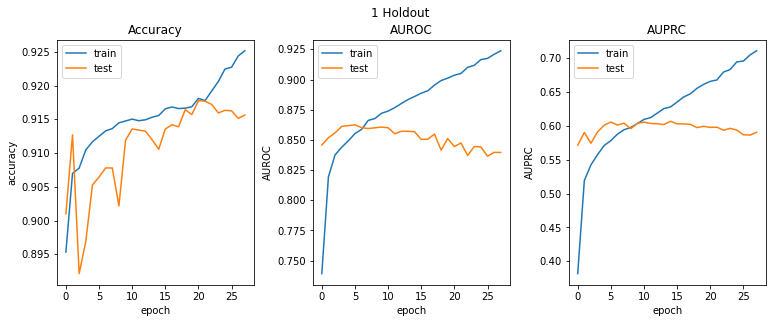

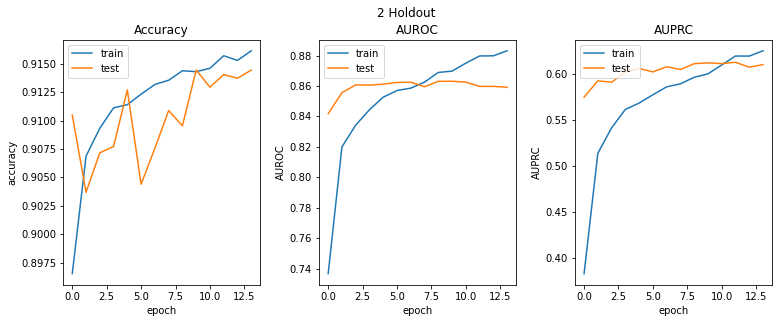

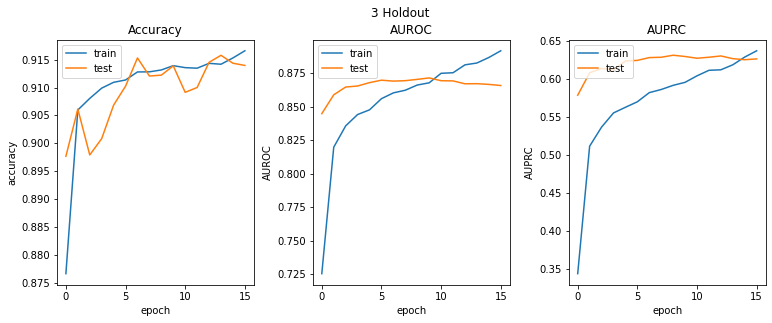

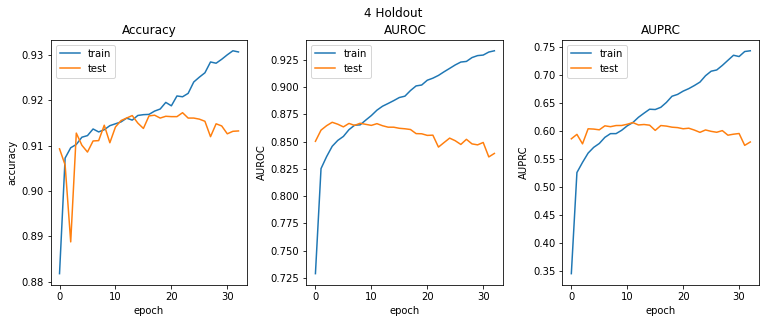

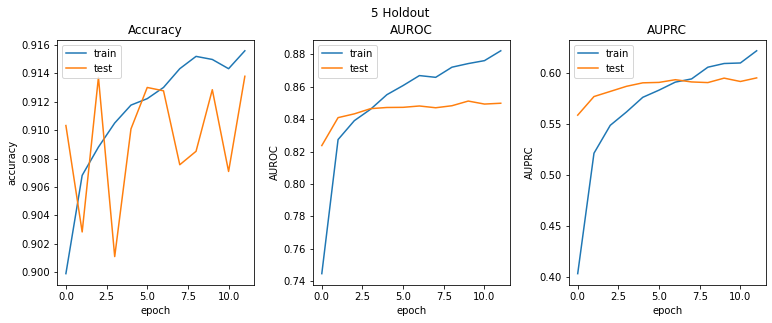

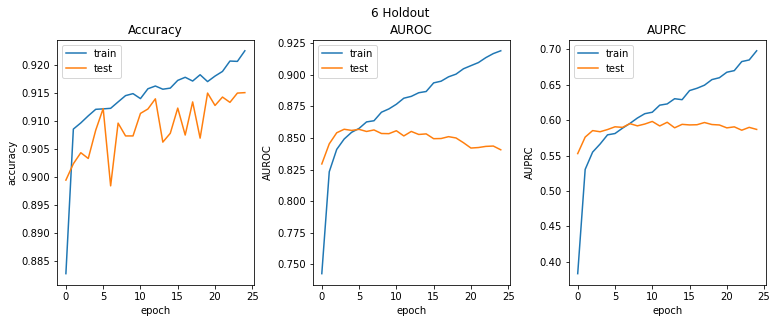

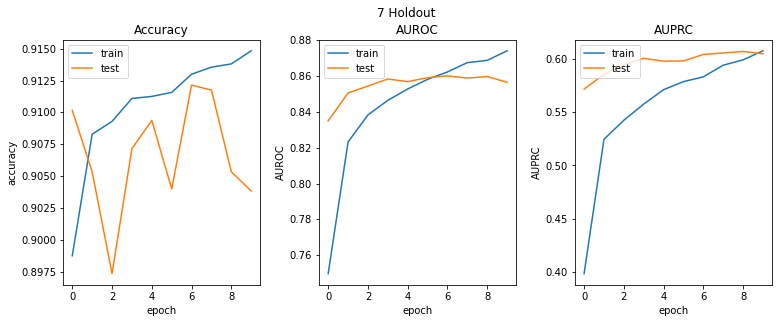

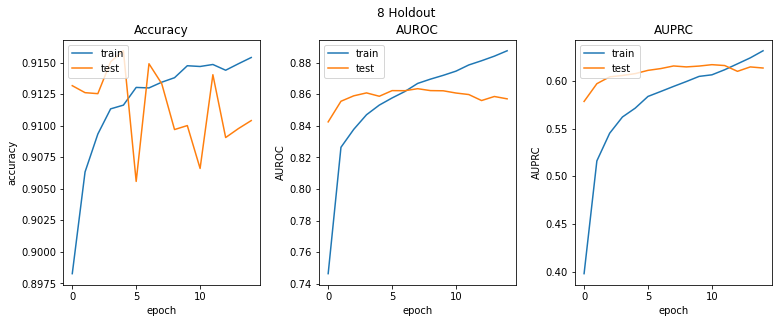

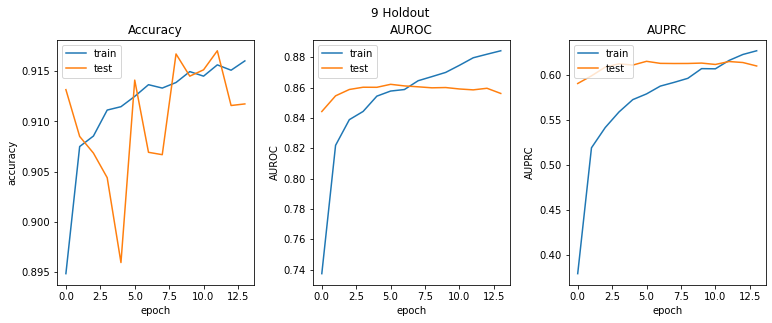

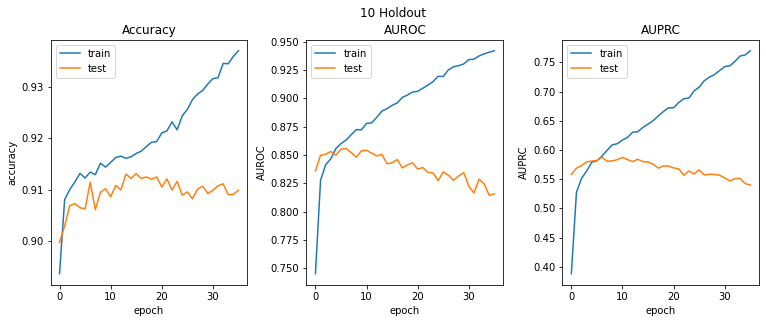

----------------------------------------------------------------------------------------------------
-- ENHANCERS -- with bayesian optimized hyperparameters MLP and CNN
MMNN Metrics - 10-holdouts estimate:
Accuracy : train - 0.9104132056236267  --  test - 0.9092122912406921
AUROC : train - 0.8816489458084107  --  test - 0.8556916177272796
AUPRC : train - 0.6161971867084504  --  test - 0.5873279452323914
--------------------------------------------------------------------------------
MMNN - Train history:


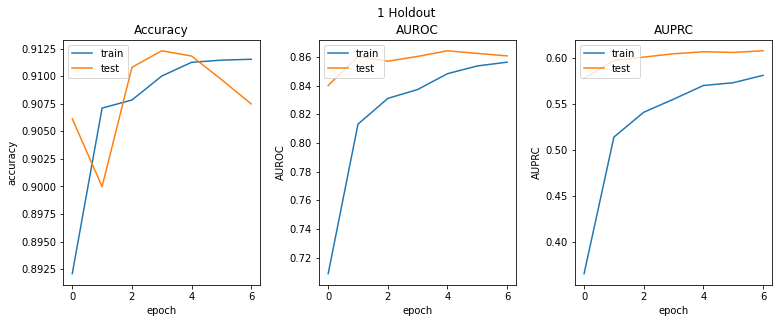

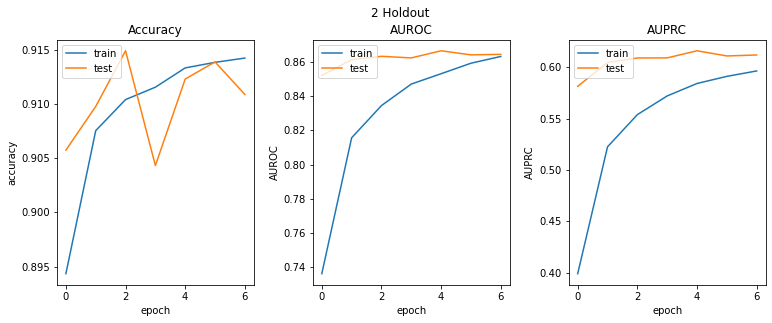

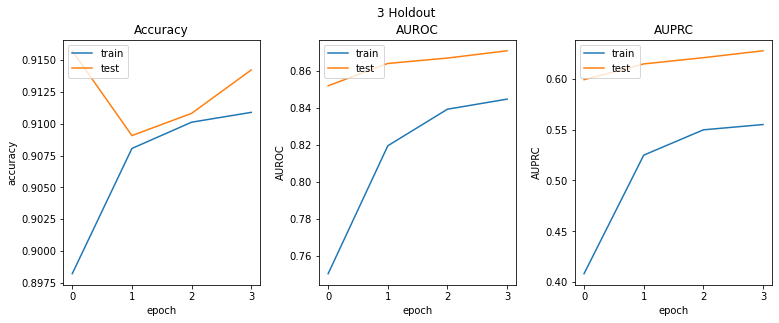

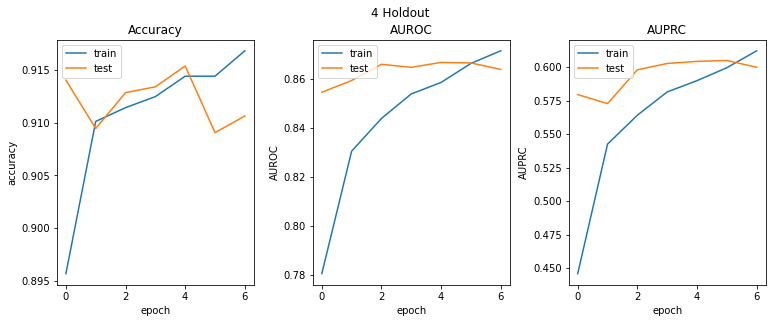

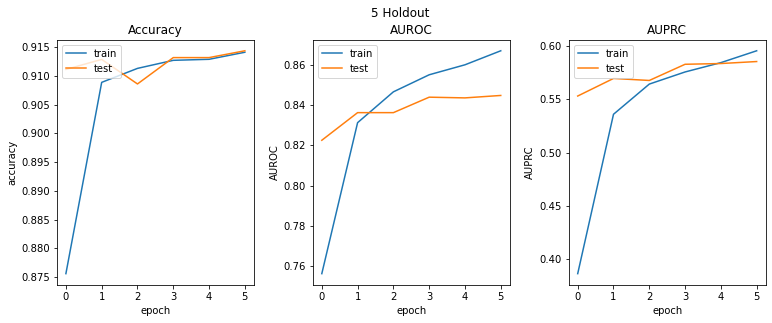

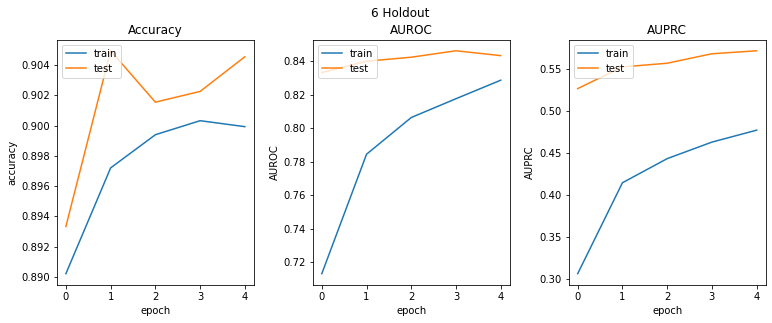

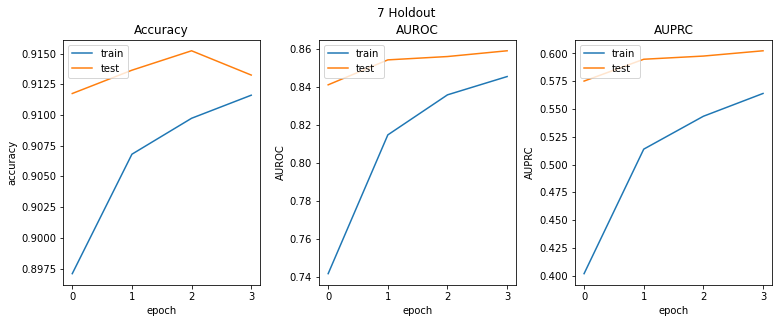

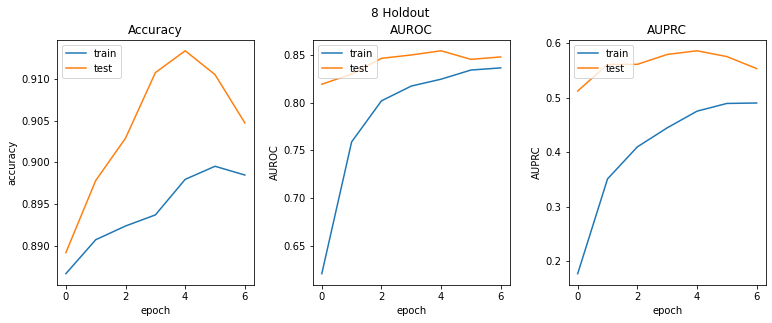

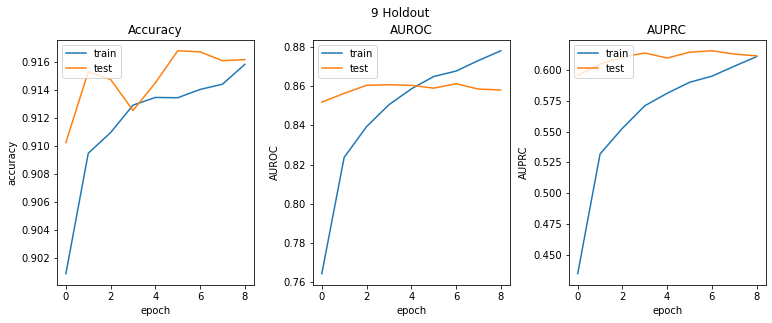

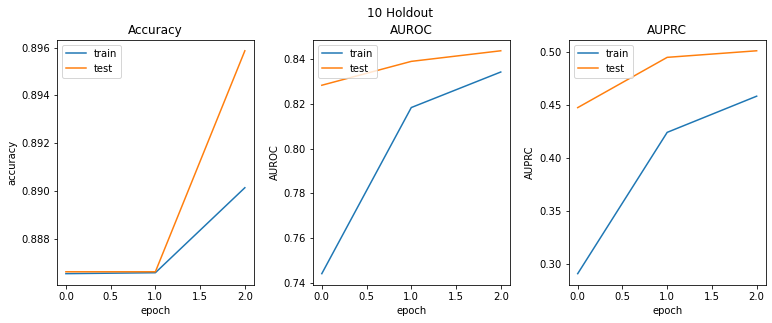

In [202]:
MMNN_metrics_estimate = model_metrics_holdout_estimate_evaluation(MMNN_metrics_enhancers["tuning_False"], number_of_splits)
print("-- ENHANCERS -- with FIXED MLP and CNN")
print(f"MMNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MMNN_metrics_estimate['accuracy_train']}  --  test - {MMNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MMNN_metrics_estimate['AUROC_train']}  --  test - {MMNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MMNN_metrics_estimate['AUPRC_train']}  --  test - {MMNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MMNN - Train history:")
plot_train_history(MMNN_history_enhancers["tuning_False"])

print("-"*100)

MMNN_metrics_estimate = model_metrics_holdout_estimate_evaluation(MMNN_metrics_enhancers["tuning_True"], number_of_splits)
print("-- ENHANCERS -- with bayesian optimized hyperparameters MLP and CNN")
print(f"MMNN Metrics - {number_of_splits}-holdouts estimate:")
print(f"Accuracy : train - {MMNN_metrics_estimate['accuracy_train']}  --  test - {MMNN_metrics_estimate['accuracy_test']}")
print(f"AUROC : train - {MMNN_metrics_estimate['AUROC_train']}  --  test - {MMNN_metrics_estimate['AUROC_test']}")
print(f"AUPRC : train - {MMNN_metrics_estimate['AUPRC_train']}  --  test - {MMNN_metrics_estimate['AUPRC_test']}")
print("-"*80)
print("MMNN - Train history:")
plot_train_history(MMNN_history_enhancers["tuning_True"])

In [203]:
MMNN_metrics_enhancers

{'tuning_True': [{'train_evaluation': {'loss': 0.23686882853507996,
    'accuracy': 0.9082720875740051,
    'recall': 0.20898641645908356,
    'precision': 0.921658992767334,
    'AUROC': 0.8809362053871155,
    'AUPRC': 0.6303306818008423,
    'f1_score': 0.3407154977321625,
    'balanced_accuracy': 0.6033570170402527,
    'specificity': 0.9977275729179382,
    'miss_rate': 0.7910135984420776,
    'fall_out': 0.002272423356771469,
    'mcc': 0.41410788893699646},
   'test_evaluation': {'loss': 0.24579110741615295,
    'accuracy': 0.9074820280075073,
    'recall': 0.20209059119224548,
    'precision': 0.9177215099334717,
    'AUROC': 0.8608652949333191,
    'AUPRC': 0.6082503795623779,
    'f1_score': 0.3312392830848694,
    'balanced_accuracy': 0.5998868346214294,
    'specificity': 0.9976831078529358,
    'miss_rate': 0.7979093790054321,
    'fall_out': 0.002316877478733659,
    'mcc': 0.4059576392173767}},
  {'train_evaluation': {'loss': 0.22841493785381317,
    'accuracy': 0.910978

In [204]:
# Saving results
import json

# Saving metrics
file = open("results/MMNN_metrics_enhancers.txt", "w") 
string = repr(MMNN_metrics_enhancers)
file.write("MMNN_metrics_enhancers = " + string + "\n")
file.close()
        
# Saving history
for tuning in ("tuning_True", "tuning_False"):
    with open("results/MMNN_history_enhancers_" + tuning + ".json", 'w') as h:
        for holdout in range(number_of_splits):
            json.dump(MMNN_history_enhancers[tuning][holdout].history, h)

#### Wilcoxon test [MMNN_Enhancers_Bayesian_Tuning VS MMNN_Enhancers_No_Bayesian_Tuning]

In [205]:
MMNN_distinct_metrics_enhancers = {}
MMNN_distinct_metrics_enhancers["tuning_True"] = {}
MMNN_distinct_metrics_enhancers["tuning_False"] = {}

for tuning in ("tuning_True", "tuning_False"):
    MMNN_distinct_metrics_enhancers[tuning]["accuracy_test"] = []
    MMNN_distinct_metrics_enhancers[tuning]["AUROC_test"] = []
    MMNN_distinct_metrics_enhancers[tuning]["AUPRC_test"] = []
    for holdout in MMNN_metrics_enhancers[tuning]:
        MMNN_distinct_metrics_enhancers[tuning]["accuracy_test"].append(holdout["test_evaluation"]["accuracy"])
        MMNN_distinct_metrics_enhancers[tuning]["AUROC_test"].append(holdout["test_evaluation"]["AUROC"])
        MMNN_distinct_metrics_enhancers[tuning]["AUPRC_test"].append(holdout["test_evaluation"]["AUPRC"])

print("MMNN - Enhancers - Wilcoxon test - fixed MLP and CNN performances VS optimized MLP and CNN performances")
print(f"-Accuracy: {wilcoxon(MMNN_distinct_metrics_enhancers['tuning_True']['accuracy_test'], MMNN_distinct_metrics_enhancers['tuning_False']['accuracy_test'])}")
print(f"-AUROC: {wilcoxon(MMNN_distinct_metrics_enhancers['tuning_True']['AUROC_test'], MMNN_distinct_metrics_enhancers['tuning_False']['AUROC_test'])}")
print(f"-AUPRC: {wilcoxon(MMNN_distinct_metrics_enhancers['tuning_True']['AUPRC_test'], MMNN_distinct_metrics_enhancers['tuning_False']['AUPRC_test'])}")

MMNN - Enhancers - Wilcoxon test - fixed MLP and CNN performances VS optimized MLP and CNN performances
-Accuracy: WilcoxonResult(statistic=16.0, pvalue=0.275390625)
-AUROC: WilcoxonResult(statistic=11.0, pvalue=0.10546875)
-AUPRC: WilcoxonResult(statistic=21.0, pvalue=0.556640625)


### Complete results visualization - Barplots
Hereby all the **results** from all the different architectures designed are grouped and visualized via barplots.

*Note*: as stated at the start of this notebook the code was very much revised and customized, hence results were stored in a different format than that necessary for the barplot library used here. Therefore, the following cells are required to format the results for the barplot visualization.

In [124]:
results = {"task": [], "model":[], "accuracy":[], "AUROC":[], "AUPRC":[]}

In [125]:
# MLP
for metrics in (MLP_metrics_promoters, MLP_metrics_enhancers):
    for boruta in ("boruta_False", "boruta_True"):
        for holdout in (metrics[boruta]):
            results["model"].append("MLP_" + str(boruta))
            results["accuracy"].append(holdout["accuracy_test"])
            results["AUROC"].append(holdout["AUROC_test"])
            results["AUPRC"].append(holdout["AUPRC_test"])
            if metrics == MLP_metrics_promoters:
                results["task"].append("active promoters VS inactive promoters")
            else:
                results["task"].append("active enhancers VS inactive enhancers")

In [135]:
# CNN
for metrics in (CNN_metrics_promoters, CNN_metrics_enhancers):
    for holdout in metrics:
        results["model"].append("CNN")
        results["accuracy"].append(holdout["test_evaluation"]["accuracy"])
        results["AUROC"].append(holdout["test_evaluation"]["AUROC"])
        results["AUPRC"].append(holdout["test_evaluation"]["AUPRC"])
        if metrics == CNN_metrics_promoters:
            results["task"].append("active promoters VS inactive promoters")
        else:
            results["task"].append("active enhancers VS inactive enhancers")

In [144]:
# MMNN
for metrics in (MMNN_metrics_promoters, MMNN_metrics_enhancers):
    for tuning in ("tuning_False", "tuning_True"):
        for holdout in metrics[tuning]:
            results["model"].append("MMNN_" + str(tuning))
            results["accuracy"].append(holdout["test_evaluation"]["accuracy"])
            results["AUROC"].append(holdout["test_evaluation"]["AUROC"])
            results["AUPRC"].append(holdout["test_evaluation"]["AUPRC"])
            if metrics == MMNN_metrics_promoters:
                results["task"].append("active promoters VS inactive promoters")
            else:
                results["task"].append("active enhancers VS inactive enhancers")

In [148]:
resultsDF = pd.DataFrame(results)
resultsDF

,task,model,accuracy,AUROC,AUPRC
0,active promoters VS inactive promoters,MLP_boruta_False,0.839315,0.896390,0.714968
1,active promoters VS inactive promoters,MLP_boruta_False,0.846724,0.912573,0.736934
2,active promoters VS inactive promoters,MLP_boruta_False,0.848276,0.913516,0.738965
3,active promoters VS inactive promoters,MLP_boruta_False,0.851379,0.916971,0.749560
4,active promoters VS inactive promoters,MLP_boruta_False,0.833809,0.895597,0.705919
...,...,...,...,...,...
95,active enhancers VS inactive enhancers,MMNN_tuning_True,0.904559,0.843458,0.571634
96,active enhancers VS inactive enhancers,MMNN_tuning_True,0.913250,0.859116,0.602440
97,active enhancers VS inactive enhancers,MMNN_tuning_True,0.904717,0.847728,0.553511
98,active enhancers VS inactive enhancers,MMNN_tuning_True,0.916173,0.858158,0.611622


Rendering barplots:   0%|                                                                        | 0/3 [00:00<…

((<Figure size 3200x300 with 2 Axes>,
  <Figure size 3200x300 with 2 Axes>,
  <Figure size 3200x300 with 2 Axes>),
 (array([<AxesSubplot:title={'center':'active enhancers VS inactive enhancers'}, xlabel='AUPRC'>,
         <AxesSubplot:title={'center':'active promoters VS inactive promoters'}, xlabel='AUPRC'>],
        dtype=object),
  array([<AxesSubplot:title={'center':'active enhancers VS inactive enhancers'}, xlabel='Accuracy'>,
         <AxesSubplot:title={'center':'active promoters VS inactive promoters'}, xlabel='Accuracy'>],
        dtype=object),
  array([<AxesSubplot:title={'center':'active enhancers VS inactive enhancers'}, xlabel='AUROC'>,
         <AxesSubplot:title={'center':'active promoters VS inactive promoters'}, xlabel='AUROC'>],
        dtype=object)))

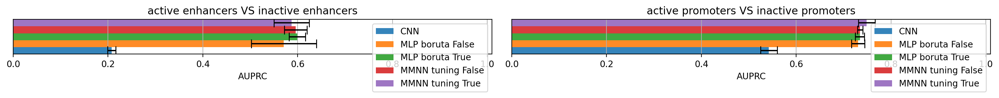

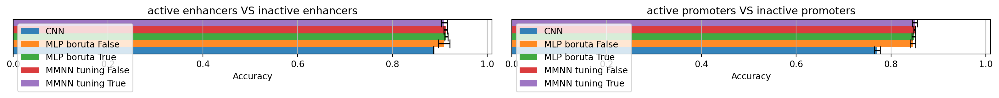

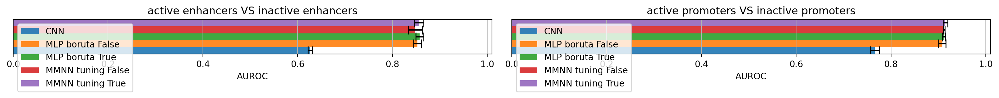

In [147]:
from barplots import barplots

barplots(
    resultsDF,
    groupby=["task", "model"],
    orientation="horizontal",
    height=8,
    subplots=True
)

### Testing
Unit tests for the major functions.

In [275]:
import unittest
class TestNotebook(unittest.TestCase):

    def test_knn_imputation(self):
        promoters, _ = load_epigenomes(
            cell_line = cell_line,
            dataset = "fantom",
            window_size = window_size,
            region = "promoters"
        )
        enhancers, _ = load_epigenomes(
            cell_line = cell_line,
            dataset = "fantom",
            window_size = window_size,
            region = "enhancers"
        )
        # Testing there are no NaN values after imputation
        self.assertEqual(knn_imputation(promoters, 5).isna().values.sum(), 0)
        self.assertEqual(knn_imputation(enhancers, 5).isna().values.sum(), 0)

    def test_robust_scaler(self):
        promoters, _ = load_epigenomes(
            cell_line = cell_line,
            dataset = "fantom",
            window_size = window_size,
            region = "promoters"
        )
        enhancers, _ = load_epigenomes(
            cell_line = cell_line,
            dataset = "fantom",
            window_size = window_size,
            region = "enhancers"
        )
        
        promoters = robust_scaler(promoters)
        enhancers = robust_scaler(enhancers)
        feature = "NR2F6"
        # Testing the correct application of robust scaling to a feature
        self.assertEqual(round(promoters[feature].median()), 0.0)
        self.assertEqual(round(promoters[feature].quantile(.75)-promoters[feature].quantile(.25)), 1)
        self.assertEqual(round(enhancers[feature].median()), 0.0)
        self.assertEqual(round(enhancers[feature].quantile(.75)-enhancers[feature].quantile(.25)), 1)

    def test_build_fixed_MLP(self):
        MLP = build_fixed_MLP(input_shape=(10, feature_number))
        # Testing that layers have the correct number of neurons
        self.assertEqual(MLP[1].shape[1], feature_number)
        self.assertEqual(MLP[2].shape[1], 64)

    def test_build_fixed_CNN(self):
        CNN = build_fixed_CNN(window_size=window_size)
        # Testing that layers have the correct number of neurons
        self.assertEqual(CNN[1].shape[1], 256)
        self.assertEqual(CNN[1].shape[2], 4)
        self.assertEqual(CNN[2].shape[1], 128)

In [276]:
unittest.main(argv=[''], verbosity=2, exit=False)

test_build_fixed_CNN (__main__.TestNotebook) ... 

- Building Fixed CNN:

Model: "model_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequence_data (InputLayer)  [(None, 256, 4)]          0         
                                                                 
 conv1d_42 (Conv1D)          (None, 249, 160)          5280      
                                                                 
 dropout_112 (Dropout)       (None, 249, 160)          0         
                                                                 
 conv1d_43 (Conv1D)          (None, 249, 64)           81984     
                                                                 
 dropout_113 (Dropout)       (None, 249, 64)           0         
                                                                 
 max_pooling1d_35 (MaxPoolin  (None, 124, 64)          0         
 g1D)                                                            
                                   

ok
test_build_fixed_MLP (__main__.TestNotebook) ... 

- Building Fixed MLP:

Model: "model_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 epigenomic_data (InputLayer  [(None, 562)]            0         
 )                                                               
                                                                 
 dense_100 (Dense)           (None, 128)               72064     
                                                                 
 dropout_119 (Dropout)       (None, 128)               0         
                                                                 
 dense_101 (Dense)           (None, 64)                8256      
                                                                 
 dropout_120 (Dropout)       (None, 64)                0         
                                                                 
 dense_102 (Dense)           (None, 64)                4160      
                                   

ok
test_knn_imputation (__main__.TestNotebook) ... ok
test_robust_scaler (__main__.TestNotebook) ... ok

----------------------------------------------------------------------
Ran 4 tests in 50.201s

OK
